## Import Packages

In [ ]:
!pip install aif360 'aif360[Reductions]' 'aif360[inFairness]'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.7/259.7 kB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.0/240.0 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.1/263.1 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 901.7/901.7 kB 41.9 MB/s eta 0:00:00


In [ ]:
!pip install torch torchvision adjustText BlackBoxAuditing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for BlackBoxAuditing: filename=BlackBoxAuditing-0.1.54-py2.py3-none-any.whl size=1394756 sha256=3dd572ad25edec3a9196a57cbb96be6a9347e26abcd090bcf41ca0231020ef9f
  Stored in directory: /root/.cache/pip/wheels/c5/b9/e9/152a447c23f9c30559676a9f4ecee5c7e9a36130d48176555c
Successfully built BlackBoxAuditing


In [ ]:
# Data handling and preprocessing
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, MinMaxScaler, MaxAbsScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector as selector
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.inspection import permutation_importance

# Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from math import pi
from adjustText import adjust_text
import random

# Machine Learning models
import os
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

# Boosting models
import xgboost as xgb
from xgboost import XGBClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier

# Pytorch for NN (MLP)
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torch.optim as optim
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_array
from itertools import product

# Evaluation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [ ]:
# Fairness Metrics and Analysis
# AIF360
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import BinaryLabelDatasetMetric, ClassificationMetric
from aif360.algorithms.preprocessing import Reweighing, DisparateImpactRemover
from aif360.algorithms.inprocessing import AdversarialDebiasing, PrejudiceRemover, MetaFairClassifier

from fairlearn.reductions import DemographicParity, EqualizedOdds, ExponentiatedGradient
from fairlearn.metrics import MetricFrame, selection_rate, false_positive_rate, false_negative_rate
from sklearn.base import clone

/usr/local/lib/python3.12/dist-packages/inFairness/utils/ndcg.py:37: FutureWarning: We've integrated functorch into PyTorch. As the final step of the integration, `functorch.vmap` is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use `torch.vmap` instead; see the PyTorch 2.0 release notes and/or the `torch.func` migration guide for more details https://pytorch.org/docs/main/func.migrating.html
  vect_normalized_discounted_cumulative_gain = vmap(
/usr/local/lib/python3.12/dist-packages/inFairness/utils/ndcg.py:48: FutureWarning: We've integrated functorch into PyTorch. As the final step of the integration, `functorch.vmap` is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use `torch.vmap` instead; see the PyTorch 2.0 release notes and/or the `torch.func` migration guide for more details https://pytorch.org/docs/main/func.migrating.html
  monte_carlo_vect_ndcg = vmap(vect_normalized_discounted

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_eager_execution()

In [ ]:
random_seed = 57
# PYTHON
os.environ['PYTHONHASHSEED'] = str(random_seed)
random.seed(random_seed)

# NUMPY
np.random.seed(random_seed)

# TENSORFLOW (TF 1.x session)
tf.compat.v1.set_random_seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
tf.set_random_seed(random_seed)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Loading Datasets

In [ ]:
# Adult
cols = ['age', 'workclass', 'fnlwgt', 'education', 'education-num',
                'marital-status', 'occupation', 'relationship', 'race', 'sex',
                'capital-gain', 'capital-loss', 'hours-per-week', 'native-country', 'income']

train_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data"
test_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.test"

train = pd.read_csv(train_url, header=None, names=cols, na_values=' ?')
test = pd.read_csv(test_url, header=0, names=cols, na_values=' ?')

target = 'income'

data = pd.concat([train, test], axis=0).dropna()
data[target] = data[target].apply(lambda x: 1 if '>50K' in x else 0)
data['sex'] = data['sex'].apply(lambda x: 1 if x == ' Male' else 0)
data['race'] = data['race'].apply(lambda x: 1 if x == ' White' else 0)

In [ ]:
data

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,1,1,2174,0,40,United-States,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,1,1,0,0,13,United-States,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,1,1,0,0,40,United-States,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,0,1,0,0,40,United-States,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,0,0,0,0,40,Cuba,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16275,33,Private,245211,Bachelors,13,Never-married,Prof-specialty,Own-child,1,1,0,0,40,United-States,0
16276,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,1,0,0,0,36,United-States,0
16278,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,1,1,0,0,50,United-States,0
16279,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,0,1,5455,0,40,United-States,0


In [ ]:
print(data['sex'].value_counts(normalize=True))

sex
1    0.675048
0    0.324952
Name: proportion, dtype: float64


In [ ]:
print(data['race'].value_counts(normalize=True))

race
1    0.860267
0    0.139733
Name: proportion, dtype: float64


In [ ]:
# save data to drive
data.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/Adult_Census_orig.csv')

## Data Integrity Check

In [ ]:
def check_data_integrity(df, target):
    """
    Check for data integrity issues such as missing values, duplicates, and outliers.
    """
    # Check for missing values
    missing_values = df.isnull().sum()
    print("Missing values in each column:\n", missing_values[missing_values > 0])

    # List out columns with missing or NA values
    missing_columns = df.columns[df.isna().any()].tolist()
    print("Columns with missing or NA values:")
    print(missing_columns)

    # Check for duplicates
    duplicates = df.duplicated().sum()
    print("Number of duplicate rows:", duplicates)

    # Check for unique values in categorical columns
    categorical_columns = df.select_dtypes(include=['object']).columns
    print("Unique values in categorical columns:")
    for col in categorical_columns:
        unique_values = df[col].unique()
        print(f"{col}: {len(unique_values)} unique values")

    # Check for class imbalance
    plt.figure(figsize=(4, 3))
    sns.countplot(x=target, data=df)
    plt.title('Class Distribution')
    plt.xlabel(target)
    plt.ylabel('Count')
    plt.show()

    # Check for outliers using boxplots
    num_numeric_cols = len(df.select_dtypes(include=[np.number]).columns)
    num_rows = (num_numeric_cols + 3) // 4  # Calculate rows needed
    plt.figure(figsize=(12, 8))
    for i, col in enumerate(df.select_dtypes(include=[np.number]).columns):
        plt.subplot(num_rows, 4, i + 1)  # Adjust subplot grid
        sns.boxplot(x=df[col])
        plt.title(col)
    plt.tight_layout()
    plt.show()

    '''
    # Show all feature distribution
    plt.figure(figsize=(12, 6))
    for i, col in enumerate(df.select_dtypes(include=[np.number]).columns):
        plt.subplot(2, 4, i + 1)
        sns.histplot(df[col], kde=True)
        plt.title(col)
        plt.xlabel('Value')
        plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()
    '''

    # Show feature distribution by income
    plt.figure(figsize=(12, 8))
    for i, col in enumerate(df.select_dtypes(include=[np.number]).columns):
        plt.subplot(num_rows, 4, i + 1)  # Adjust subplot grid to accommodate more columns
        sns.histplot(df[df[target] == 0][col], kde=True, label='Target Value = 0', color='blue', alpha=0.5)
        sns.histplot(df[df[target] == 1][col], kde=True, label='Target Value = 1', color='red', alpha=0.5)
        plt.title(col)
        plt.xlabel('Value')


Missing values in each column:
 Series([], dtype: int64)
Columns with missing or NA values:
[]
Number of duplicate rows: 47
Unique values in categorical columns:
workclass: 7 unique values
education: 16 unique values
marital-status: 7 unique values
occupation: 14 unique values
relationship: 6 unique values
native-country: 41 unique values


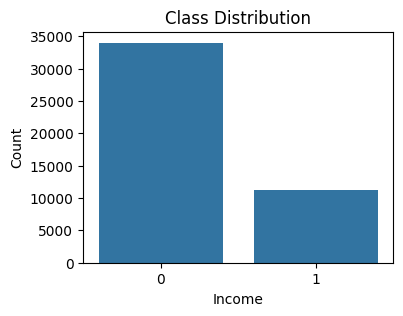

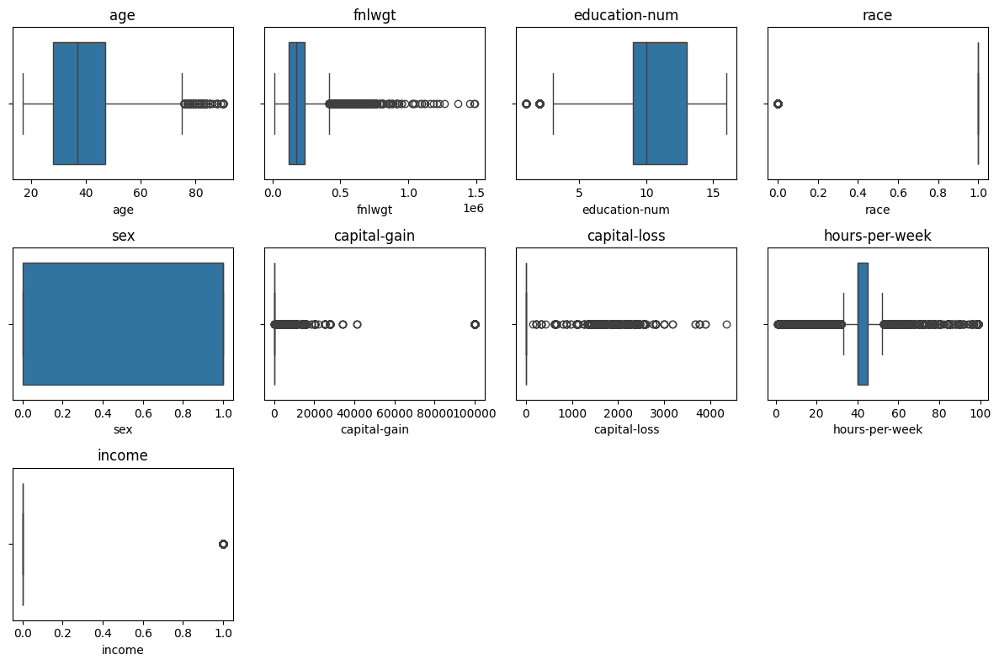

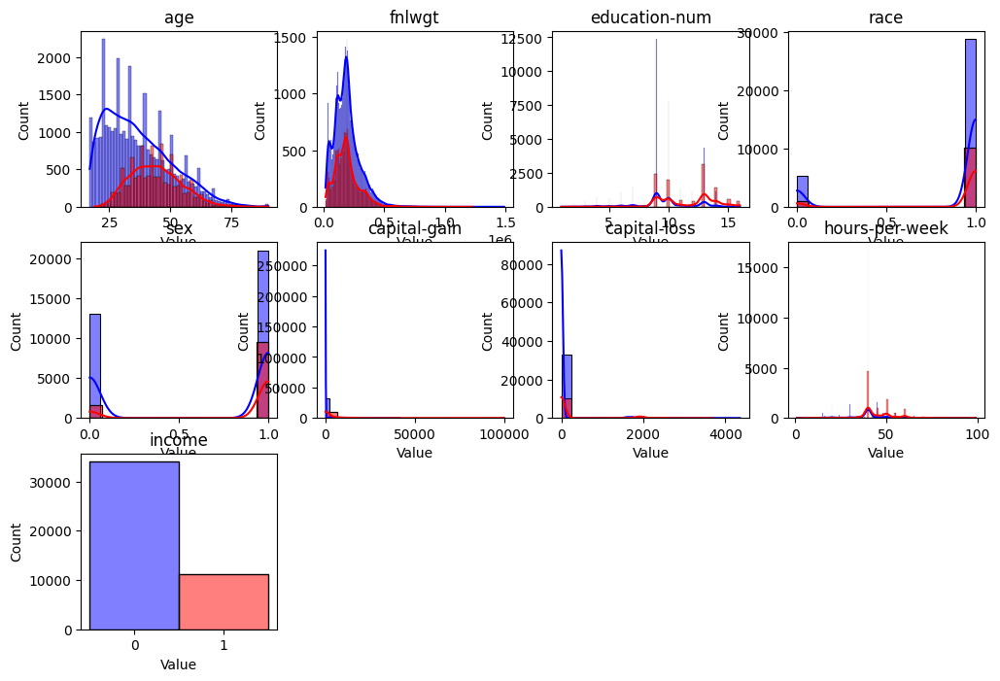

In [ ]:
check_data_integrity(data, target)

## Preprocessing

In [ ]:
def data_preprocessing(data, target):
    # Encode categorical variables
    cat_features = data.select_dtypes(include='object').columns.tolist()

    data_OHE = pd.get_dummies(data, columns=cat_features, drop_first=True)

    X = data_OHE.drop(target, axis=1)
    y = data_OHE[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_seed, stratify=y)

    return X_train, X_test, y_train, y_test

In [ ]:
X_train, X_test, y_train, y_test = data_preprocessing(data, target)

## MODEL SELECTION & FAIRNESS EVALUATION

In [ ]:
sensitive_feature = 'sex'

In [ ]:
class SimpleMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super(SimpleMLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, 2)  # Binary classification with 2 logits

    def forward(self, x):
        x = F.relu(self.fc1(x))
        return self.fc2(x)  # Raw logits

class PyTorchMLPWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, input_dim=10, hidden_dim=64, lr=0.001, epochs=20, batch_size=64, random_state=42):
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.lr = lr
        self.epochs = epochs
        self.batch_size = batch_size
        self.random_state = random_state
        self._build_model()

    def _set_seed(self):
        seed = self.random_state
        os.environ['PYTHONHASHSEED'] = str(seed)
        random.seed(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

    def _build_model(self):
        self.model = SimpleMLP(self.input_dim, self.hidden_dim)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)

    def fit(self, X, y, sample_weight=None):
        X = np.asarray(X, dtype=np.float32)
        y = np.asarray(y, dtype=np.longlong)
        X, y = check_X_y(X, y)
        self._build_model()

        X_tensor = torch.tensor(X, dtype=torch.float32).to(self.device)
        y_tensor = torch.tensor(y, dtype=torch.long).to(self.device)
        dataset = torch.utils.data.TensorDataset(X_tensor, y_tensor)

        if sample_weight is not None:
            sw_tensor = torch.tensor(sample_weight, dtype=torch.float32).to(self.device)
        else:
            sw_tensor = torch.ones(len(X_tensor)).to(self.device)

        optimizer = optim.Adam(self.model.parameters(), lr=self.lr)
        criterion = nn.CrossEntropyLoss(reduction='none')

        for epoch in range(self.epochs):
            self.model.train()
            for i in range(0, len(X_tensor), self.batch_size):
                x_batch = X_tensor[i:i+self.batch_size]
                y_batch = y_tensor[i:i+self.batch_size]
                sw_batch = sw_tensor[i:i+self.batch_size]

                optimizer.zero_grad()
                logits = self.model(x_batch)
                loss = criterion(logits, y_batch)
                loss = (loss * sw_batch).mean()
                loss.backward()
                optimizer.step()

        return self

    def predict(self, X):
        X = np.asarray(X, dtype=np.float32)
        X = check_array(X)
        self.model.eval()
        X_tensor = torch.tensor(X, dtype=torch.float32).to(self.device)
        with torch.no_grad():
            logits = self.model(X_tensor)
            preds = torch.argmax(logits, dim=1)
        return preds.cpu().numpy().ravel()

    def predict_proba(self, X):
        X = np.asarray(X, dtype=np.float32)
        X = check_array(X)
        self.model.eval()
        X_tensor = torch.tensor(X, dtype=torch.float32).to(self.device)
        with torch.no_grad():
            logits = self.model(X_tensor)
            probs = F.softmax(logits, dim=1)
        probs = probs.cpu().numpy()
        return probs

In [ ]:
# Dictionary of models
models = {
    "LR": LogisticRegression(max_iter=2000, random_state=random_seed),
    "NB": GaussianNB(),
    "RF": RandomForestClassifier(random_state=random_seed),
    "DT": DecisionTreeClassifier(random_state=random_seed),
    "XGB": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=random_seed),
    "LGBM": LGBMClassifier(random_state=random_seed),
    "GBM": GradientBoostingClassifier(random_state=random_seed),
    "MLP": PyTorchMLPWrapper(input_dim=X_train.shape[1])
}

In [ ]:
param_grid = {
    "NB": {
        'var_smoothing': [1e-9, 1e-8, 1e-7]
    },
    "LR": {
        'C': [0.1, 1, 10],
        'penalty': ['l2', 'l1'],
        'solver': ['liblinear', 'saga']
    },
    "RF": {
        'n_estimators': [50, 100, 200],
        'max_depth': [10, 20, 30],
        #'min_samples_split': [2, 5, 10],
        #'min_samples_leaf': [1, 2, 4]
    },
    "DT": {
        'max_depth': [10, 20, 30],
        'min_samples_split': [2, 5, 10],
        #'min_samples_leaf': [1, 2, 4]
    },
    "XGB": {
        'n_estimators': [50, 100],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1]
    },
    "LGBM": {
        'n_estimators': [50, 100],
        'max_depth': [10, 20],
        'learning_rate': [0.01, 0.1]
    },
    "GBM": {
        'n_estimators': [50, 100],
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5]
    },
    "MLP": {
        'hidden_dim': [32, 64],
        'lr': [0.001, 0.01],
        'epochs': [10, 20]
    }
}


### Combined Functions

In [ ]:
#Use This (FINAL)
def train_evaluate_plot(models, param_grid, X_train, y_train, X_test, y_test, target, sensitive_feature):
    results = {}

    test_splits = np.array_split(np.arange(len(X_test)), 3)

    param_combinations = list(product(*param_grid['MLP'].values()))
    param_names = list(param_grid['MLP'].keys())

    for name, model in models.items():
        if name != 'MLP':
            pipe = ImbPipeline([
                ('scaler', MinMaxScaler()),
                ('clf', model)
            ])
            updated_param_grid = {f"clf__{key}": value for key, value in param_grid[name].items()}
            cv = GridSearchCV(pipe, updated_param_grid, cv=5, scoring='f1', return_train_score=True, n_jobs=-1)
            cv.fit(X_train, y_train)
            best_model = cv.best_estimator_

            cv_results = cv.cv_results_
            train_cv_score = np.mean(cv_results['mean_train_score'])
            val_cv_score = np.mean(cv_results['mean_test_score'])

            acc_list, f1_list, roc_list = [], [], []
            sp_list, eo_list, eodd_list, aod_list = [], [], [], []
            tpr_list, fpr_list, fnr_list = [], [], []

            for split in test_splits:
                X_split = X_test.iloc[split]
                y_split = y_test.iloc[split]

                y_pred = best_model.predict(X_split)
                y_prob = best_model.predict_proba(X_split)[:, 1]

                acc_list.append(accuracy_score(y_split, y_pred))
                f1_list.append(f1_score(y_split, y_pred))
                roc_list.append(roc_auc_score(y_split, y_prob))

                true_df = X_split.copy()
                true_df[target] = y_split.values
                pred_df = X_split.copy()
                pred_df[target] = y_pred

                true_dataset = BinaryLabelDataset(df=true_df, label_names=[target], protected_attribute_names=[sensitive_feature])
                pred_dataset = BinaryLabelDataset(df=pred_df, label_names=[target], protected_attribute_names=[sensitive_feature])

                metric = ClassificationMetric(true_dataset, pred_dataset,
                                              unprivileged_groups=[{sensitive_feature: 0}],
                                              privileged_groups=[{sensitive_feature: 1}])

                sp_list.append(metric.statistical_parity_difference())
                eo_list.append(metric.equal_opportunity_difference())
                eodd_list.append(metric.equalized_odds_difference())
                aod_list.append(metric.average_odds_difference())

                tpr_list.append(metric.true_positive_rate())
                fpr_list.append(metric.false_positive_rate())
                fnr_list.append(metric.false_negative_rate())

            results[name] = {
                'train_cv_f1': train_cv_score,
                'val_cv_f1': val_cv_score,
                'accuracy': np.mean(acc_list),
                'f1': np.mean(f1_list),
                'roc_auc': np.mean(roc_list),
                'stat_parity': np.mean(sp_list),
                'equal_opp': np.mean(eo_list),
                'equal_odds': np.mean(eodd_list),
                'avg_odds_diff': np.mean(aod_list),
                'tpr': np.mean(tpr_list),
                'fpr': np.mean(fpr_list),
                'fnr': np.mean(fnr_list),
                'best_model': best_model
            }

        else:
            # Manual CV for PyTorch MLP
            scaler = MinMaxScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)
            X_np = X_train_scaled
            y_np = y_train.to_numpy() if hasattr(y_train, "to_numpy") else y_train

            best_score = -1
            best_params = None

            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            for values in param_combinations:
                params = dict(zip(param_names, values))
                fold_scores = []

                for train_idx, val_idx in skf.split(X_np, y_np):
                    X_fold_train, X_fold_val = X_np[train_idx], X_np[val_idx]
                    y_fold_train, y_fold_val = y_np[train_idx], y_np[val_idx]

                    model = PyTorchMLPWrapper(
                        input_dim=X_np.shape[1],
                        hidden_dim=params['hidden_dim'],
                        lr=params['lr'],
                        epochs=params['epochs']
                    )
                    model.fit(X_fold_train, y_fold_train)
                    y_pred = model.predict(X_fold_val)
                    fold_scores.append(f1_score(y_fold_val, y_pred))

                avg_score = np.mean(fold_scores)
                if avg_score > best_score:
                    best_score = avg_score
                    best_params = params

            best_model = PyTorchMLPWrapper(
                input_dim=X_np.shape[1],
                hidden_dim=best_params['hidden_dim'],
                lr=best_params['lr'],
                epochs=best_params['epochs']
            )
            best_model.fit(X_np, y_np)
            train_cv_score = val_cv_score = best_score

            acc_list, f1_list, roc_list = [], [], []
            sp_list, eo_list, eodd_list, aod_list = [], [], [], []
            tpr_list, fpr_list, fnr_list = [], [], []

            for split in test_splits:
                X_split = pd.DataFrame(X_test_scaled[split], columns=X_test.columns)
                y_split = y_test.iloc[split]

                y_pred = best_model.predict(X_split)
                y_prob = best_model.predict_proba(X_split)[:, 1]

                acc_list.append(accuracy_score(y_split, y_pred))
                f1_list.append(f1_score(y_split, y_pred))
                roc_list.append(roc_auc_score(y_split, y_prob))

                true_df = X_split.copy()
                true_df[target] = y_split.values
                pred_df = X_split.copy()
                pred_df[target] = y_pred

                true_dataset = BinaryLabelDataset(df=true_df, label_names=[target], protected_attribute_names=[sensitive_feature])
                pred_dataset = BinaryLabelDataset(df=pred_df, label_names=[target], protected_attribute_names=[sensitive_feature])

                metric = ClassificationMetric(true_dataset, pred_dataset,
                                              unprivileged_groups=[{sensitive_feature: 0}],
                                              privileged_groups=[{sensitive_feature: 1}])

                sp_list.append(metric.statistical_parity_difference())
                eo_list.append(metric.equal_opportunity_difference())
                eodd_list.append(metric.equalized_odds_difference())
                aod_list.append(metric.average_odds_difference())

                tpr_list.append(metric.true_positive_rate())
                fpr_list.append(metric.false_positive_rate())
                fnr_list.append(metric.false_negative_rate())

            results[name] = {
                'train_cv_f1': train_cv_score,
                'val_cv_f1': val_cv_score,
                'accuracy': np.mean(acc_list),
                'f1': np.mean(f1_list),
                'roc_auc': np.mean(roc_list),
                'stat_parity': np.mean(sp_list),
                'equal_opp': np.mean(eo_list),
                'equal_odds': np.mean(eodd_list),
                'avg_odds_diff': np.mean(aod_list),
                'tpr': np.mean(tpr_list),
                'fpr': np.mean(fpr_list),
                'fnr': np.mean(fnr_list),
                'best_model': best_model
            }

    results_df = pd.DataFrame(results).T.sort_values(by='f1', ascending=False)

    metrics_df = results_df[['train_cv_f1', 'val_cv_f1', 'accuracy', 'f1', 'roc_auc']].astype(float)
    plt.figure(figsize=(6, 5))
    sns.heatmap(metrics_df, annot=True, fmt=".2f", cmap='YlGnBu')
    plt.title("Model Performance Comparison")
    plt.xlabel("Metric")
    plt.ylabel("Model")
    plt.tight_layout()
    plt.show()

    fairness_metrics = ['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'tpr', 'fpr', 'fnr']
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    plt.suptitle('Fairness Metrics and Rates Comparison')
    axes = axes.flatten()

    for i, metric in enumerate(fairness_metrics):

        sns.barplot(x=results_df.index, y=metric, data=results_df, ax=axes[i])
        axes[i].set_title(metric.replace('_', ' ').title())
        axes[i].set_xlabel('Model')
        axes[i].set_ylabel(metric.replace('_', ' ').title())
        if metric in ['stat_parity', 'equal_opp', 'equal_odds']:
            axes[i].axhline(0, linestyle='--', color='gray')

    for j in range(len(fairness_metrics), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    perf_metrics = ['accuracy', 'f1', 'roc_auc']
    fair_metrics = ['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff']

    perf_norm = results_df[perf_metrics] / results_df[perf_metrics].max()
    fair_norm = 1 - results_df[fair_metrics].abs() / results_df[fair_metrics].abs().max()

    def radar_chart(data_norm, title, metrics, subplot_idx):
        N = len(metrics)
        angles = [n / float(N) * 2 * pi for n in range(N)] + [0]
        ax = plt.subplot(1, 2, subplot_idx, polar=True)
        for model in data_norm.index:
            values = data_norm.loc[model].tolist() + [data_norm.loc[model].tolist()[0]]
            ax.plot(angles, values, label=model)
            ax.fill(angles, values, alpha=0.1)
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(metrics)
        ax.set_title(title, size=13)

    plt.figure(figsize=(14, 6))
    radar_chart(perf_norm, 'Performance Metrics (Higher = Better)', perf_metrics, 1)
    radar_chart(fair_norm, 'Fairness Metrics (Higher = Fairer)', fair_metrics, 2)

    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=len(results_df.index))
    plt.tight_layout()
    plt.show()

    return results, results_df

In [ ]:
def pareto_plot(df):
    # Plot Pareto grid (F1 vs AOD)
    plt.figure(figsize=(8, 5))

    # Use 1 - |AOD| as fairness score
    x = 1 - abs(df['avg_odds_diff'])
    y = df['f1']
    labels = df.index

    # Optional: color by another metric (e.g., accuracy)
    colors = df['accuracy']

    # Use seaborn for better style
    sns.set(style="whitegrid")

    # Scatter plot with colormap
    scatter = plt.scatter(x, y, c=colors, cmap='viridis', s=100, edgecolor='k')

    # Prepare text labels
    texts = []
    for i, label in enumerate(labels):
        texts.append(plt.text(x.iloc[i]+0.002, y.iloc[i], label, fontsize=9, ha='left', va='center'))

    # Auto-adjust labels to avoid overlap
    adjust_text(
        texts,
        only_move={'points': 'y', 'texts': 'xy'},  # allow smarter repositioning
        arrowprops=dict(arrowstyle="-", color='gray', lw=0.5)
    )

    # Axes and title
    plt.xlabel('1 - |Average Odds Difference| (Higher = Fairer)', fontsize=12)
    plt.ylabel('F1 Score', fontsize=12)
    plt.title('Fairness–Performance Trade-off Across Models', fontsize=14)

    # Colorbar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Accuracy', rotation=270, labelpad=15)

    plt.tight_layout()
    plt.show()

In [ ]:
results_dict, results_df = train_evaluate_plot(models, param_grid, X_train, y_train, X_test, y_test, target, sensitive_feature)

KeyboardInterrupt: 

In [ ]:
results_df

In [ ]:
pareto_plot(results_df)

In [ ]:
# Export the results DataFrame to a CSV file
results_df.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_sex_original_models.csv')

## Fairness Mitigation

In [ ]:
# Define weights for each metric (tune these based on priority)
w_f1 = 0.5        # Equal weightage between performance and fairness
w_spd = 0.25      # Equal weightage for the 4 fairness metrics
w_eod = 0.25
w_eopp = 0.25
w_aod = 0.25

# Scoring function: higher is better
def composite_score(result):
    f1 = result['f1']
    spd = abs(result['stat_parity'])  # smaller is better → we subtract from 1
    eod = abs(result['equal_odds'])
    eopp = abs(result['equal_opp'])
    aod = abs(result['avg_odds_diff'])

    # Combine the fairness scores into 1 with equal weightage and invert it (higher better)
    fairness_score = 1 - (w_spd * spd + w_eod * eod + w_eopp * eopp + w_aod * aod)
    return w_f1 * f1 + (1 - w_f1) * fairness_score

In [ ]:
# Select model with highest composite score
best_name = max(results_dict, key=lambda x: composite_score(results_dict[x]))
best_model = results_dict[best_name]['best_model']

print(f"Balanced Best Model: {best_name}")

# Check if it's a pipeline
if isinstance(best_model, Pipeline):
    print("Model parameters:")
    print(best_model.named_steps['clf'].get_params())
else:
    print("Model parameters:")
    print(best_model.get_params())

### Fairness Constraints Functions

####Redundant function

In [ ]:
def RW(best_name, X_train, y_train, X_test, y_test, sensitive_feature):
    rw_results = {}

    # Apply Reweighing
    train_df = X_train.copy()
    train_df['income'] = y_train.values

    train_bld = BinaryLabelDataset(df=train_df, label_names=['income'], protected_attribute_names=[sensitive_feature])
    RW = Reweighing(unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])
    train_rw = RW.fit_transform(train_bld)

    # Train on reweighed data
    X_rw = train_rw.features
    y_rw = train_rw.labels.ravel()
    weights = train_rw.instance_weights

    reweigh_model = ImbPipeline([
        ('scaler', MinMaxScaler()),
        ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
    ])

    reweigh_model.fit(X_rw, y_rw, clf__sample_weight=weights)
    y_pred_rw = reweigh_model.predict(X_test)

    # Evaluate
    acc_rw = accuracy_score(y_test, y_pred_rw)
    f1_rw = f1_score(y_test, y_pred_rw)
    roc_rw = roc_auc_score(y_test, reweigh_model.predict_proba(X_test)[:, 1])

    test_df_rw = X_test.copy()
    test_df_rw['income'] = y_test.values
    pred_df_rw = X_test.copy()
    pred_df_rw['income'] = y_pred_rw

    true_ds_rw = BinaryLabelDataset(df=test_df_rw, label_names=['income'], protected_attribute_names=[sensitive_feature])
    pred_ds_rw = BinaryLabelDataset(df=pred_df_rw, label_names=['income'], protected_attribute_names=[sensitive_feature])

    metric_rw = ClassificationMetric(true_ds_rw, pred_ds_rw,
                                    unprivileged_groups=[{sensitive_feature: 0}],
                                    privileged_groups=[{sensitive_feature: 1}])
    rw_results = {
            'accuracy': acc_rw,
            'f1': f1_rw,
            'roc_auc': roc_rw,
            'stat_parity': metric_rw.statistical_parity_difference(),
            'equal_opp': metric_rw.equal_opportunity_difference(),
            'equal_odds': metric_rw.equalized_odds_difference(),
            'avg_odds_diff': metric_rw.average_odds_difference(),
            'tpr': metric_rw.true_positive_rate(),
            'fpr': metric_rw.false_positive_rate(),
            'fnr': metric_rw.false_negative_rate(),
            'best_model': best_model
        }

    # Concatenate results
    rw_results_df = pd.DataFrame(rw_results, index=['RW'])
    combined_results = pd.concat([results_df.loc[[best_name]], rw_results_df], axis=0)

    # Visualization
    plot_data = pd.DataFrame({
        'Metric': ['Accuracy', 'F1 Score', 'ROC AUC', 'Stat_Parity_Diff', 'Equal_Opp_Diff', 'Equal_Odd_Diff'],
        'Base': [combined_results['accuracy'].iloc[0], combined_results['f1'].iloc[0], combined_results['roc_auc'].iloc[0], combined_results['stat_parity'].iloc[0], combined_results['equal_opp'].iloc[0], combined_results['equal_odds'].iloc[0]],
        'Reweigh': [combined_results['accuracy'].iloc[1], combined_results['f1'].iloc[1], combined_results['roc_auc'].iloc[1], combined_results['stat_parity'].iloc[1], combined_results['equal_opp'].iloc[1], combined_results['equal_odds'].iloc[1]]
    })

    # Plot
    ax = plot_data.plot(x='Metric', kind='bar', figsize=(8, 4))
    plt.title('Model Comparison')
    plt.ylabel('Score')
    plt.xlabel('Evaluation Metric')
    plt.xticks(rotation=0)
    plt.legend(title='Model')
    plt.tight_layout()
    plt.show()

    return rw_results_df, combined_results

In [ ]:
def adv_debias(best_name, X_train, y_train, X_test, y_test, sensitive_feature):
    adv_results = {}

    # Scale inputs to [0, 1]
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    X_train_df[sensitive_feature] = X_train[sensitive_feature].values.astype(int)
    X_test_df[sensitive_feature] = X_test[sensitive_feature].values.astype(int)
    X_train_df['income'] = y_train.values
    X_test_df['income'] = y_test.values

    # Create BinaryLabelDatasets
    train_bld = BinaryLabelDataset(
        df=X_train_df,
        label_names=['income'],
        protected_attribute_names=[sensitive_feature]
    )

    test_bld = BinaryLabelDataset(
        df=X_test_df,
        label_names=['income'],
        protected_attribute_names=[sensitive_feature]
    )

    tf.compat.v1.reset_default_graph()
    sess = tf.compat.v1.Session()

    # Train adversarial debiasor
    adv_debiasor = AdversarialDebiasing(
        privileged_groups=[{sensitive_feature: 1}],
        unprivileged_groups=[{sensitive_feature: 0}],
        scope_name='adv_debiasing',
        debias=True,
        sess=sess,
        num_epochs=10,
        batch_size=128
    )
    adv_debiasor.fit(train_bld)
    pred_adv = adv_debiasor.predict(test_bld)

    # Evaluate
    adv_metric = ClassificationMetric(
        test_bld, pred_adv,
        privileged_groups=[{sensitive_feature: 1}],
        unprivileged_groups=[{sensitive_feature: 0}]
    )

    # Record results
    y_true_adv = test_bld.labels.ravel()
    y_pred_adv = pred_adv.labels.ravel()
    acc_adv = accuracy_score(y_true_adv, y_pred_adv)
    f1_adv = f1_score(y_true_adv, y_pred_adv)
    roc_adv = roc_auc_score(y_true_adv, pred_adv.scores)

    adv_results = {
        'accuracy': acc_adv,
        'f1': f1_adv,
        'roc_auc': roc_adv,
        'stat_parity': adv_metric.statistical_parity_difference(),
        'equal_opp': adv_metric.equal_opportunity_difference(),
        'equal_odds': adv_metric.equalized_odds_difference(),
        'adv_model': adv_debiasor
    }

    # Concatenate results
    adv_results_df = pd.DataFrame(adv_results, index=['ADV'])
    combined_results = pd.concat([results_df.loc[[best_name]], adv_results_df], axis=0)

    # Visualization
    plot_data = pd.DataFrame({
        'Metric': ['Accuracy', 'F1 Score', 'ROC AUC', 'Stat_Parity_Diff', 'Equal_Opp_Diff', 'Equal_Odd_Diff'],
        'Base': [combined_results['accuracy'].iloc[0], combined_results['f1'].iloc[0], combined_results['roc_auc'].iloc[0], combined_results['stat_parity'].iloc[0], combined_results['equal_opp'].iloc[0], combined_results['equal_odds'].iloc[0]],
        'AdvDebias': [combined_results['accuracy'].iloc[1], combined_results['f1'].iloc[1], combined_results['roc_auc'].iloc[1], combined_results['stat_parity'].iloc[1], combined_results['equal_opp'].iloc[1], combined_results['equal_odds'].iloc[1]]
    })

    # Plot
    ax = plot_data.plot(x='Metric', kind='bar', figsize=(8, 4))
    plt.title('Model Comparison')
    plt.ylabel('Score')
    plt.xlabel('Evaluation Metric')
    plt.xticks(rotation=0)
    plt.legend(title='Model')
    plt.tight_layout()
    plt.show()

    return adv_results_df, combined_results

In [ ]:
def PR(best_name, X_train, y_train, X_test, y_test, sensitive_feature, results_df, results_dict):
    pr_results = {}

    # Prepare train and test datasets
    train_df = X_train.copy()
    train_df['income'] = y_train.values
    test_df = X_test.copy()
    test_df['income'] = y_test.values

    # Convert to BinaryLabelDataset
    train_bld = BinaryLabelDataset(df=train_df, label_names=['income'], protected_attribute_names=[sensitive_feature])
    test_bld = BinaryLabelDataset(df=test_df, label_names=['income'], protected_attribute_names=[sensitive_feature])

    # Train Prejudice Remover
    pr_model = PrejudiceRemover(sensitive_attr=sensitive_feature, eta=25.0)
    pr_model.fit(train_bld)
    pred_pr = pr_model.predict(test_bld)

    # Get predictions
    y_pred_pr = pred_pr.labels.ravel()
    y_true = y_test.values
    y_score = pred_pr.scores.ravel()

    # Evaluate
    acc_pr = accuracy_score(y_true, y_pred_pr)
    f1_pr = f1_score(y_true, y_pred_pr)
    roc_pr = roc_auc_score(y_true, y_score)

    metric_pr = ClassificationMetric(test_bld, pred_pr,
                                     unprivileged_groups=[{sensitive_feature: 0}],
                                     privileged_groups=[{sensitive_feature: 1}])

    pr_results = {
        'accuracy': acc_pr,
        'f1': f1_pr,
        'roc_auc': roc_pr,
        'stat_parity': metric_pr.statistical_parity_difference(),
        'equal_opp': metric_pr.equal_opportunity_difference(),
        'equal_odds': metric_pr.equalized_odds_difference(),
        'best_model': pr_model
    }

    # Create results DataFrame
    pr_results_df = pd.DataFrame(pr_results, index=['PR'])
    combined_results = pd.concat([results_df.loc[[best_name]], pr_results_df], axis=0)

    # Visualization
    plot_data = pd.DataFrame({
        'Metric': ['Accuracy', 'F1 Score', 'ROC AUC', 'Stat_Parity_Diff', 'Equal_Opp_Diff', 'Equal_Odd_Diff'],
        best_name: [combined_results['accuracy'].iloc[0], combined_results['f1'].iloc[0], combined_results['roc_auc'].iloc[0], combined_results['stat_parity'].iloc[0], combined_results['equal_opp'].iloc[0], combined_results['equal_odds'].iloc[0]],
        'PrejudiceRemover': [combined_results['accuracy'].iloc[1], combined_results['f1'].iloc[1], combined_results['roc_auc'].iloc[1], combined_results['stat_parity'].iloc[1], combined_results['equal_opp'].iloc[1], combined_results['equal_odds'].iloc[1]]
    })

    # Plot
    ax = plot_data.plot(x='Metric', kind='bar', figsize=(8, 4))
    plt.title('Model Comparison: Base vs Prejudice Remover')
    plt.ylabel('Score')
    plt.xlabel('Evaluation Metric')
    plt.xticks(rotation=0)
    plt.legend(title='Model')
    plt.tight_layout()
    plt.show()

    return pr_results_df, combined_results

In [ ]:
def DIR(best_name, X_train, y_train, X_test, y_test, sensitive_feature, results_df, results_dict):
    dir_results = {}

    # Prepare datasets
    train_df = X_train.copy()
    train_df['income'] = y_train.values
    test_df = X_test.copy()
    test_df['income'] = y_test.values

    train_bld = BinaryLabelDataset(df=train_df, label_names=['income'], protected_attribute_names=[sensitive_feature])
    test_bld = BinaryLabelDataset(df=test_df, label_names=['income'], protected_attribute_names=[sensitive_feature])

    # Apply Disparate Impact Remover
    dir = DisparateImpactRemover(repair_level=1.0)
    train_dir = dir.fit_transform(train_bld)
    X_train_dir = train_dir.features
    y_train_dir = train_dir.labels.ravel()

    model = ImbPipeline([
        ('scaler', MinMaxScaler()),
        ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
    ])
    model.fit(X_train_dir, y_train_dir)

    y_pred_dir = model.predict(X_test)
    roc_dir = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    acc_dir = accuracy_score(y_test, y_pred_dir)
    f1_dir = f1_score(y_test, y_pred_dir)

    pred_df = X_test.copy()
    pred_df['income'] = y_pred_dir
    true_df = X_test.copy()
    true_df['income'] = y_test.values

    true_bld = BinaryLabelDataset(df=true_df, label_names=['income'], protected_attribute_names=[sensitive_feature])
    pred_bld = BinaryLabelDataset(df=pred_df, label_names=['income'], protected_attribute_names=[sensitive_feature])

    metric = ClassificationMetric(true_bld, pred_bld,
                                  unprivileged_groups=[{sensitive_feature: 0}],
                                  privileged_groups=[{sensitive_feature: 1}])

    dir_results = {
        'accuracy': acc_dir,
        'f1': f1_dir,
        'roc_auc': roc_dir,
        'stat_parity': metric.statistical_parity_difference(),
        'equal_opp': metric.equal_opportunity_difference(),
        'equal_odds': metric.equalized_odds_difference(),
        'best_model': model
    }

    dir_results_df = pd.DataFrame(dir_results, index=['DIR'])
    combined_results = pd.concat([results_df.loc[[best_name]], dir_results_df], axis=0)

    plot_data = pd.DataFrame({
        'Metric': ['Accuracy', 'F1 Score', 'ROC AUC', 'Stat_Parity_Diff', 'Equal_Opp_Diff', 'Equal_Odd_Diff'],
        best_name: [combined_results['accuracy'].iloc[0], combined_results['f1'].iloc[0], combined_results['roc_auc'].iloc[0], combined_results['stat_parity'].iloc[0], combined_results['equal_opp'].iloc[0], combined_results['equal_odds'].iloc[0]],
        'DisparateImpactRemover': [combined_results['accuracy'].iloc[1], combined_results['f1'].iloc[1], combined_results['roc_auc'].iloc[1], combined_results['stat_parity'].iloc[1], combined_results['equal_opp'].iloc[1], combined_results['equal_odds'].iloc[1]]
    })

    ax = plot_data.plot(x='Metric', kind='bar', figsize=(8, 4))
    plt.title('Model Comparison: Base vs Disparate Impact Remover')
    plt.ylabel('Score')
    plt.xlabel('Evaluation Metric')
    plt.xticks(rotation=0)
    plt.legend(title='Model')
    plt.tight_layout()
    plt.show()

    return dir_results_df, combined_results

In [ ]:
def compare_fairness_constraints(best_name, results_df, rw_results_df, adv_results_df, pr_results_df):
    # Concatenate and Visualise
    all_results = pd.concat([results_df.loc[[best_name]], rw_results_df, adv_results_df, pr_results_df], axis=0)
    all_results

    # Ensure these are the metric columns in the same order you want to plot
    metric_labels = ['Accuracy', 'F1 Score', 'ROC AUC', 'Stat_Parity_Diff', 'Equal_Opp_Diff', 'Equal_Odd_Diff', 'Avg_Odds_Diff']
    metric_keys = ['accuracy', 'f1', 'roc_auc', 'stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff']

    # Create a long-form DataFrame for plotting
    plot_data = pd.melt(
        all_results[metric_keys].reset_index(),
        id_vars='index',
        value_vars=metric_keys,
        var_name='Metric',
        value_name='Score'
    )

    label_map = dict(zip(metric_keys, metric_labels))
    plot_data['Metric'] = plot_data['Metric'].map(label_map)

    # Plot
    plt.figure(figsize=(10, 5))
    sns.barplot(data=plot_data, x='Metric', y='Score', hue='index')
    plt.title('Model Comparison Across Metrics')
    plt.xlabel('Evaluation Metric')
    plt.ylabel('Score')
    plt.xticks(rotation=0)
    plt.legend(title='Model')
    plt.tight_layout()
    plt.show()

####Useful functions

In [ ]:
class MultiLevelReweighing:
    """MultiLevelReweighing is a preprocessing technique that Weights the examples in each
    (group, label) combination differently to ensure fairness before
    classification .This technique can compute the protected level of every sample , and then it can
    give every sample a new weight.
    """

    def __init__(self, unprivileged_groups, privileged_groups):
        """
        Args:
            unprivileged_groups (list(dict)): Representation for unprivileged group.
            privileged_groups (list(dict)): Representation for privileged group.
            such as:
            [{'feature_name':'sex','privileged_value':1,'level':2},
            {'feature_name':'race','privileged_value':1,'level':1}]
        """

        self.unprivileged_groups = unprivileged_groups
        self.privileged_groups = privileged_groups
        self.protect_feature_count = len(self.privileged_groups)
        self.w_p_fav = 1.0
        self.w_p_unfav = 1.0
        self.w_up_fav = 1.0
        self.w_up_unfav = 1.0

    def fit(self, dataset):
        """Compute the weights for reweighing the dataset.

        Args:
            dataset (BinaryLabelDataset): Dataset containing true labels.

        Returns:
            MultiLevelReweighing: Returns self.
        """

        (
            protect_level_dic,
            fav_cond,
            unfav_cond,
            combination_p_fav_dic,
        ) = self._obtain_conditionings(dataset)

        level_max = 0
        for group in self.privileged_groups:
            level_max = level_max + group["level"]
        n = np.sum(dataset.instance_weights, dtype=np.float64)
        n_p_level_dic = {}
        # weight:[1,2,1,1,2]
        #'n_p1':2
        for level in range(0, level_max + 1):
            n_p_level_dic["n_p" + str(level)] = np.sum(
                dataset.instance_weights[
                    protect_level_dic["protect_level" + str(level) + "_cond"]
                ],
                dtype=np.float64,
            )

        n_fav = np.sum(dataset.instance_weights[fav_cond], dtype=np.float64)
        n_unfav = np.sum(dataset.instance_weights[unfav_cond], dtype=np.float64)

        n_p_level_fav_or_unfav_dic = {}
        # "n_p1_unfav":3
        for level in range(0, level_max + 1):
            n_p_level_fav_or_unfav_dic["n_p" + str(level) + "_fav"] = np.sum(
                dataset.instance_weights[
                    combination_p_fav_dic["cond_p" + str(level) + "_fav"]
                ],
                dtype=np.float64,
            )
            n_p_level_fav_or_unfav_dic["n_p" + str(level) + "_unfav"] = np.sum(
                dataset.instance_weights[
                    combination_p_fav_dic["cond_p" + str(level) + "_unfav"]
                ],
                dtype=np.float64,
            )

        self.w_p_level_fav_or_unfav_dic = {}

        # reweighing weights
        # dataset.instance_weights
        # "w_p3_fav":3
        for level in range(0, level_max + 1):
            self.w_p_level_fav_or_unfav_dic["w_p" + str(level) + "_fav"] = (
                n_fav
                * n_p_level_dic["n_p" + str(level)]
                / (n * n_p_level_fav_or_unfav_dic["n_p" + str(level) + "_fav"])
            )
            self.w_p_level_fav_or_unfav_dic["w_p" + str(level) + "_unfav"] = (
                n_unfav
                * n_p_level_dic["n_p" + str(level)]
                / (n * n_p_level_fav_or_unfav_dic["n_p" + str(level) + "_unfav"])
            )

        return self

    def transform(self, dataset):
        """Transform the dataset to a new dataset based on the estimated
        transformation.

        Args:
            dataset (BinaryLabelDataset): Dataset that needs to be transformed.
        Returns:
            dataset (BinaryLabelDataset): Dataset with transformed
                instance_weights attribute.
        """
        protect_level_dic = {}
        level_max = 0
        for group in self.privileged_groups:
            level_max = level_max + group["level"]
        dataset_transformed = dataset.copy(deepcopy=True)

        (
            protect_level_dic,
            fav_cond,
            unfav_cond,
            combination_p_fav_dic,
        ) = self._obtain_conditionings(dataset)

        # apply reweighing
        for level in range(1 + level_max):
            dataset_transformed.instance_weights[
                combination_p_fav_dic["cond_p" + str(level) + "_fav"]
            ] *= self.w_p_level_fav_or_unfav_dic["w_p" + str(level) + "_fav"]
            dataset_transformed.instance_weights[
                combination_p_fav_dic["cond_p" + str(level) + "_unfav"]
            ] *= self.w_p_level_fav_or_unfav_dic["w_p" + str(level) + "_unfav"]

        return dataset_transformed

    ##############################
    #### Supporting functions ####
    ##############################
    def _obtain_conditionings(self, dataset):
        """Obtain the necessary conditioning boolean vectors to compute
        instance level weights.
        [{'feature_name':'sex','privileged_value':1,'level':2},
            {'feature_name':'race','privileged_value':1,'level':1}]
        """
        # conditioning

        protect_level_dic = {}
        level_max = 0
        for group in self.privileged_groups:
            level_max = level_max + group["level"]
        for i in range(0, level_max + 1):
            protect_level_dic["protect_level" + str(i) + "_cond"] = np.zeros(
                dataset.protected_attributes.shape[0], dtype=bool
            )
        #'protect_level3_cond':[0,1,0]
        #'protect_level2_cond':[0,0,1]
        # [
        #     [1,1],
        #     [0,1],
        #     [1,0],
        #     [0,0]
        # ]
        # ['sex','race']
        for sample_index in range(len(dataset.protected_attributes)):  # 3,5
            protect_feature = dataset.protected_attributes[sample_index]
            this_sample_protect_level = 0
            for group in self.privileged_groups:
                name = group["feature_name"]
                val = group["privileged_value"]
                level = group["level"]
                index = dataset.protected_attribute_names.index(name)
                if protect_feature[index] == val:
                    this_sample_protect_level = this_sample_protect_level + level  # 3
            protect_level_dic[
                "protect_level" + str(this_sample_protect_level) + "_cond"
            ][sample_index] = True
            # "protect_level" + str(3) + "_cond":[0,0,0,1,0]

        # [[1],[0],[1]],[1,0,1]
        fav_cond = dataset.labels.ravel() == dataset.favorable_label  # [0,0,1,1,0]
        unfav_cond = dataset.labels.ravel() == dataset.unfavorable_label  # [1,1,0,0,1]

        # combination of label and privileged/unpriv. groups
        combination_p_fav_dic = {}
        # "cond_p3_fav":[0,0,1,0,0]

        for i in range(0, level_max + 1):  # 3

            combination_p_fav_dic["cond_p" + str(i) + "_fav"] = np.logical_and(
                fav_cond, protect_level_dic["protect_level" + str(i) + "_cond"]
            )
            combination_p_fav_dic["cond_p" + str(i) + "_unfav"] = np.logical_and(
                unfav_cond, protect_level_dic["protect_level" + str(i) + "_cond"]
            )

        return (protect_level_dic, fav_cond, unfav_cond, combination_p_fav_dic)

In [ ]:
# NEW: Run all fairness method with gridsearch for hyperparameter
def run_all_fairness_methods(best_name, data, X_train, y_train, X_test, y_test, target, sensitive_feature, results_df, results_dict):
    combined_all = results_df.loc[[best_name]].copy()
    data = data.reset_index(drop=True)
    X_test = X_test.reset_index(drop=True)

    train_df = X_train.copy()
    train_df[target] = y_train.values
    test_df = X_test.copy()
    test_df[target] = y_test.values

    # Ensure sensitive features are included in the DataFrames used for BLD creation
    sensitive_features_list = ['sex', 'race'] # Include both sex and race
    train_df_bld = train_df.copy()
    test_df_bld = test_df.copy()

    # Add sensitive features if they are not already present (after one-hot encoding)
    for sf in sensitive_features_list:
        if sf not in train_df_bld.columns and sf in data.columns: # Check if original data has the feature
             # This assumes original 'data' DataFrame has the sensitive feature before one-hot encoding
             train_df_bld[sf] = data.loc[train_df_bld.index, sf].values.astype(int)
             test_df_bld[sf] = data.loc[test_df_bld.index, sf].values.astype(int)
        elif sf in train_df_bld.columns:
             # If already present (e.g., not one-hot encoded), ensure correct type if needed
             train_df_bld[sf] = train_df_bld[sf].astype(int)
             test_df_bld[sf] = test_df_bld[sf].astype(int)


    train_bld = BinaryLabelDataset(df=train_df_bld, label_names=[target], protected_attribute_names=[sensitive_feature])
    test_bld = BinaryLabelDataset(df=test_df_bld, label_names=[target], protected_attribute_names=[sensitive_feature])


    # --- Reweighing ---
    rw = Reweighing(unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])
    train_rw = rw.fit_transform(train_bld)
    X_rw = train_rw.features
    y_rw = train_rw.labels.ravel()
    weights = train_rw.instance_weights
    input_dim = X_rw.shape[1]

    if best_name=="MLP":
        # MLP model (custom PyTorch wrapper)
        model_rw = results_dict[best_name]['best_model']
        model_rw.fit(X_rw, y_rw)
    else:
        model_rw = ImbPipeline([
            ('scaler', MinMaxScaler()),
            ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
        ])
        model_rw.fit(X_rw, y_rw, clf__sample_weight=weights)

    y_pred_rw = model_rw.predict(X_test)
    # Reconstruct prediction DataFrame with same structure as test_df_bld
    pred_df_rw = test_df_bld.copy()
    pred_df_rw[target] = y_pred_rw

    metric_rw = ClassificationMetric(test_bld, BinaryLabelDataset(df=pred_df_rw, label_names=[target], protected_attribute_names=[sensitive_feature]),
                                     unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])

    RW_row = pd.Series({
        'accuracy': accuracy_score(y_test, y_pred_rw),
        'f1': f1_score(y_test, y_pred_rw),
        'roc_auc': roc_auc_score(y_test, model_rw.predict_proba(X_test)[:, 1]),
        'stat_parity': metric_rw.statistical_parity_difference(),
        'equal_opp': metric_rw.equal_opportunity_difference(),
        'equal_odds': metric_rw.equalized_odds_difference(),
        'avg_odds_diff': metric_rw.average_odds_difference(),
        'tpr': metric_rw.true_positive_rate(),
        'fpr': metric_rw.false_positive_rate(),
        'fnr': metric_rw.false_negative_rate(),
        'best_parameter': None,
        'best_model': model_rw
    }, name='RW')

    combined_all = pd.concat([combined_all, RW_row.to_frame().T], axis=0)

    # --- Prejudice Remover ---
    best_pr = None
    best_pr_row = None
    for eta in [1.0, 10.0, 25.0, 50.0, 100.0]:
        try:
            pr_model = PrejudiceRemover(sensitive_attr=sensitive_feature, eta=eta)
            pr_model.fit(train_bld)
            pred_pr = pr_model.predict(test_bld)
            y_pred_pr = pred_pr.labels.ravel()

            metric_pr = ClassificationMetric(test_bld, pred_pr,
                                            unprivileged_groups=[{sensitive_feature: 0}],
                                            privileged_groups=[{sensitive_feature: 1}])

            pr_row = pd.Series({
                'accuracy': accuracy_score(y_test, y_pred_pr),
                'f1': f1_score(y_test, y_pred_pr),
                'roc_auc': roc_auc_score(y_test, pred_pr.scores.ravel()),
                'stat_parity': metric_pr.statistical_parity_difference(),
                'equal_opp': metric_pr.equal_opportunity_difference(),
                'equal_odds': metric_pr.equalized_odds_difference(),
                'avg_odds_diff': metric_pr.average_odds_difference(),
                'tpr': metric_pr.true_positive_rate(),
                'fpr': metric_pr.false_positive_rate(),
                'fnr': metric_pr.false_negative_rate(),
                'best_parameter': eta,
                'best_model': pr_model
            }, name=f'PR_eta_{eta}')

            if best_pr_row is None or abs(pr_row['equal_opp']) < abs(best_pr_row['equal_opp']):
                best_pr = pr_model
                best_pr_row = pr_row

        except Exception as e:
            print(f"Prejudice Remover failed for eta={eta}: {e}")

    if best_pr_row is not None:
        combined_all = pd.concat([combined_all, best_pr_row.to_frame().T])

    # --- Disparate Impact Remover ---
    best_dir_row = None
    for repair_level in [0.1, 0.25, 0.5, 0.75, 1.0]:
        try:
            dir = DisparateImpactRemover(repair_level=repair_level)
            train_dir = dir.fit_transform(train_bld)
            X_train_dir = train_dir.features
            y_train_dir = train_dir.labels.ravel()

            model_dir = results_dict[best_name]['best_model'] if best_name == "MLP" else ImbPipeline([
                ('scaler', MinMaxScaler()),
                ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
            ])
            model_dir.fit(X_train_dir, y_train_dir)
            y_pred_dir = model_dir.predict(X_test)

            pred_df_dir = test_df_bld.copy()
            pred_df_dir[target] = y_pred_dir

            metric_dir = ClassificationMetric(test_bld, BinaryLabelDataset(df=pred_df_dir, label_names=[target], protected_attribute_names=[sensitive_feature]),
                                              unprivileged_groups=[{sensitive_feature: 0}],
                                              privileged_groups=[{sensitive_feature: 1}])

            dir_row = pd.Series({
                'accuracy': accuracy_score(y_test, y_pred_dir),
                'f1': f1_score(y_test, y_pred_dir),
                'roc_auc': roc_auc_score(y_test, model_dir.predict_proba(X_test)[:, 1]),
                'stat_parity': metric_dir.statistical_parity_difference(),
                'equal_opp': metric_dir.equal_opportunity_difference(),
                'equal_odds': metric_dir.equalized_odds_difference(),
                'avg_odds_diff': metric_dir.average_odds_difference(),
                'tpr': metric_dir.true_positive_rate(),
                'fpr': metric_dir.false_positive_rate(),
                'fnr': metric_dir.false_negative_rate(),
                'best_parameter': repair_level,
                'best_model': model_dir
            }, name=f'DIR_rl_{repair_level}')

            if best_dir_row is None or abs(dir_row['equal_opp']) < abs(best_dir_row['equal_opp']):
                best_dir_row = dir_row

        except Exception as e:
            print(f"DIR failed for repair_level={repair_level}: {e}")

    if best_dir_row is not None:
        combined_all = pd.concat([combined_all, best_dir_row.to_frame().T])


    # --- Exponentiated Gradient Reduction ---
    # Scale X
    scaler = MaxAbsScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Restore DataFrames after scaling
    X_train_reset = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_copy = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # Add sensitive features AFTER scaling (not scaled)
    for sf in sensitive_features_list:
        if sf not in X_train_reset.columns and sf in data.columns:
            X_train_reset[sf] = data.loc[X_train_reset.index, sf].astype(int).values
            X_test_copy[sf] = data.loc[X_test_copy.index, sf].astype(int).values
        elif sf in X_train_reset.columns:
            X_train_reset[sf] = X_train_reset[sf].astype(int)
            X_test_copy[sf] = X_test_copy[sf].astype(int)

    y_train_reset = y_train.reset_index(drop=True)

    best_egr_row = None
    for eps in [0.001, 0.01, 0.1]:
        for constraint in [EqualizedOdds(), DemographicParity()]:
            try:
                expgrad = ExponentiatedGradient(estimator=LogisticRegression(solver='liblinear', random_state=random_seed),
                                                constraints=constraint,
                                                sample_weight_name="sample_weight",
                                                eps=eps)
                expgrad.fit(X_train_reset, y_train_reset, sensitive_features=X_train_reset[sensitive_feature])
                y_pred_eg = expgrad.predict(X_test_copy)

                pred_df_eg = X_test_copy.copy()
                pred_df_eg[target] = y_pred_eg
                test_df_for_metric = X_test_copy.copy()
                test_df_for_metric[target] = y_test.values
                test_bld_for_metric = BinaryLabelDataset(df=test_df_for_metric, label_names=[target], protected_attribute_names=[sensitive_feature])

                metric_eg = ClassificationMetric(test_bld_for_metric, BinaryLabelDataset(df=pred_df_eg, label_names=[target], protected_attribute_names=[sensitive_feature]),
                                                unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])

                egr_row = pd.Series({
                    'accuracy': accuracy_score(y_test, y_pred_eg),
                    'f1': f1_score(y_test, y_pred_eg),
                    'roc_auc': roc_auc_score(y_test, expgrad._pmf_predict(X_test_copy)[:, 1]),
                    'stat_parity': metric_eg.statistical_parity_difference(),
                    'equal_opp': metric_eg.equal_opportunity_difference(),
                    'equal_odds': metric_eg.equalized_odds_difference(),
                    'avg_odds_diff': metric_eg.average_odds_difference(),
                    'tpr': metric_pr.true_positive_rate(),
                    'fpr': metric_pr.false_positive_rate(),
                    'fnr': metric_pr.false_negative_rate(),
                    'best_parameter': eps,
                    'best_model': expgrad
                }, name=f"EGR_{constraint.__class__.__name__}_eps_{eps}")

                if best_egr_row is None or abs(egr_row['equal_opp']) < abs(best_egr_row['equal_opp']):
                    best_egr_row = egr_row

            except Exception as e:
                print(f"EGR failed for eps={eps} constraint={constraint}: {e}")

    if best_egr_row is not None:
        combined_all = pd.concat([combined_all, best_egr_row.to_frame().T])


    # --- Adversarial Debiasing ---
    # Scale inputs to [0, 1]
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # Add sensitive features to X_train_df and X_test_df if not present
    for sf in sensitive_features_list:
        if sf not in X_train_df.columns and sf in data.columns:
            X_train_df[sf] = data.iloc[X_train_df.index, sf].values.astype(int)
            X_test_df[sf] = data.iloc[X_test_df.index, sf].values.astype(int)
        elif sf in X_train_df.columns:
             X_train_df[sf] = X_train_df[sf].astype(int)
             X_test_df[sf] = X_test_df[sf].astype(int)


    X_train_df[target] = y_train.values
    X_test_df[target] = y_test.values

    # Create BinaryLabelDatasets
    train_bld_adv = BinaryLabelDataset(
        df=X_train_df,
        label_names=[target],
        protected_attribute_names=[sensitive_feature]
    )

    test_bld_adv = BinaryLabelDataset(
        df=X_test_df,
        label_names=[target],
        protected_attribute_names=[sensitive_feature]
    )

    best_adv_row = None
    for batch_size in [32, 64]:
        for num_epochs in [10, 20, 50]:
            try:
                tf.compat.v1.reset_default_graph()
                sess = tf.compat.v1.Session()

                adv_debiasor = AdversarialDebiasing(
                    privileged_groups=[{sensitive_feature: 1}],
                    unprivileged_groups=[{sensitive_feature: 0}],
                    scope_name='adv_debiasing',
                    debias=True,
                    seed=random_seed,
                    sess=sess,
                    num_epochs=num_epochs,
                    batch_size=batch_size
                )
                adv_debiasor.fit(train_bld_adv)
                pred_adv = adv_debiasor.predict(test_bld_adv)
                y_pred_adv = pred_adv.labels.ravel()

                metric_adv = ClassificationMetric(test_bld_adv, pred_adv,
                                                  privileged_groups=[{sensitive_feature: 1}],
                                                  unprivileged_groups=[{sensitive_feature: 0}])

                adv_row = pd.Series({
                    'accuracy': accuracy_score(y_test, y_pred_adv),
                    'f1': f1_score(y_test, y_pred_adv),
                    'roc_auc': roc_auc_score(y_test, pred_adv.scores.ravel()),
                    'stat_parity': metric_adv.statistical_parity_difference(),
                    'equal_opp': metric_adv.equal_opportunity_difference(),
                    'equal_odds': metric_adv.equalized_odds_difference(),
                    'avg_odds_diff': metric_adv.average_odds_difference(),
                    'tpr': metric_pr.true_positive_rate(),
                    'fpr': metric_pr.false_positive_rate(),
                    'fnr': metric_pr.false_negative_rate(),
                    'best_parameter': num_epochs,
                    'best_model': adv_debiasor
                }, name=f'ADV_ep_{num_epochs}_bs_{batch_size}')

                if best_adv_row is None or abs(adv_row['equal_opp']) < abs(best_adv_row['equal_opp']):
                    best_adv_row = adv_row

            except Exception as e:
                print(f" ADV failed for batch_size={batch_size}, epochs={num_epochs}: {e}")

    if best_adv_row is not None:
        combined_all = pd.concat([combined_all, best_adv_row.to_frame().T])

    return combined_all

In [ ]:
# OLD CODE FOR BACKUP ONLY
def run_all_fairness_methods(best_name, data, X_train, y_train, X_test, y_test, target, sensitive_feature, results_df, results_dict):
    combined_all = results_df.loc[[best_name]].copy()
    data = data.reset_index(drop=True)
    X_test = X_test.reset_index(drop=True)

    train_df = X_train.copy()
    train_df[target] = y_train.values
    test_df = X_test.copy()
    test_df[target] = y_test.values

    # Ensure sensitive features are included in the DataFrames used for BLD creation
    sensitive_features_list = ['sex', 'race'] # Include both sex and race
    train_df_bld = train_df.copy()
    test_df_bld = test_df.copy()

    # Add sensitive features if they are not already present (after one-hot encoding)
    for sf in sensitive_features_list:
        if sf not in train_df_bld.columns and sf in data.columns: # Check if original data has the feature
             # This assumes original 'data' DataFrame has the sensitive feature before one-hot encoding
             train_df_bld[sf] = data.loc[train_df_bld.index, sf].values.astype(int)
             test_df_bld[sf] = data.loc[test_df_bld.index, sf].values.astype(int)
        elif sf in train_df_bld.columns:
             # If already present (e.g., not one-hot encoded), ensure correct type if needed
             train_df_bld[sf] = train_df_bld[sf].astype(int)
             test_df_bld[sf] = test_df_bld[sf].astype(int)


    train_bld = BinaryLabelDataset(df=train_df_bld, label_names=[target], protected_attribute_names=[sensitive_feature])
    test_bld = BinaryLabelDataset(df=test_df_bld, label_names=[target], protected_attribute_names=[sensitive_feature])


    # --- Reweighing ---
    rw = Reweighing(unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])
    train_rw = rw.fit_transform(train_bld)
    X_rw = train_rw.features
    y_rw = train_rw.labels.ravel()
    weights = train_rw.instance_weights
    input_dim = X_rw.shape[1]

    model_rw = ImbPipeline([
        ('scaler', MinMaxScaler()),
        ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
    ])

    model_rw.fit(X_rw, y_rw, clf__sample_weight=weights)

    y_pred_rw = model_rw.predict(X_test)
    # Reconstruct prediction DataFrame with same structure as test_df_bld
    pred_df_rw = test_df_bld.copy()
    pred_df_rw[target] = y_pred_rw

    metric_rw = ClassificationMetric(test_bld, BinaryLabelDataset(df=pred_df_rw, label_names=[target], protected_attribute_names=[sensitive_feature]),
                                     unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])

    RW_row = pd.Series({
        'accuracy': accuracy_score(y_test, y_pred_rw),
        'f1': f1_score(y_test, y_pred_rw),
        'roc_auc': roc_auc_score(y_test, model_rw.predict_proba(X_test)[:, 1]),
        'stat_parity': metric_rw.statistical_parity_difference(),
        'equal_opp': metric_rw.equal_opportunity_difference(),
        'equal_odds': metric_rw.equalized_odds_difference(),
        'avg_odds_diff': metric_rw.average_odds_difference(),
        'tpr': metric_rw.true_positive_rate(),
        'fpr': metric_rw.false_positive_rate(),
        'fnr': metric_rw.false_negative_rate(),
        'best_model': model_rw
    }, name='RW')

    combined_all = pd.concat([combined_all, RW_row.to_frame().T], axis=0)

    # --- Prejudice Remover ---
    pr_model = PrejudiceRemover(sensitive_attr=sensitive_feature, eta=50.0)
    pr_model.fit(train_bld)
    pred_pr = pr_model.predict(test_bld)
    y_pred_pr = pred_pr.labels.ravel()

    metric_pr = ClassificationMetric(test_bld, pred_pr,
                                     unprivileged_groups=[{sensitive_feature: 0}],
                                     privileged_groups=[{sensitive_feature: 1}])

    PR_row = pd.Series({
        'accuracy': accuracy_score(y_test, y_pred_pr),
        'f1': f1_score(y_test, y_pred_pr),
        'roc_auc': roc_auc_score(y_test, pred_pr.scores.ravel()),
        'stat_parity': metric_pr.statistical_parity_difference(),
        'equal_opp': metric_pr.equal_opportunity_difference(),
        'equal_odds': metric_pr.equalized_odds_difference(),
        'avg_odds_diff': metric_pr.average_odds_difference(),
        'tpr': metric_pr.true_positive_rate(),
        'fpr': metric_pr.false_positive_rate(),
        'fnr': metric_pr.false_negative_rate(),
        'best_model': pr_model
    }, name='PR')

    combined_all = pd.concat([combined_all, PR_row.to_frame().T], axis=0)

    # --- Disparate Impact Remover ---
    dir = DisparateImpactRemover(repair_level=0.0)
    train_dir = dir.fit_transform(train_bld)
    X_train_dir = train_dir.features
    y_train_dir = train_dir.labels.ravel()

    model_dir = ImbPipeline([
        ('scaler', MinMaxScaler()),
        ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
    ])
    model_dir.fit(X_train_dir, y_train_dir)
    y_pred_dir = model_dir.predict(X_test)
    pred_df_dir = test_df_bld.copy()
    pred_df_dir[target] = y_pred_dir

    metric_dir = ClassificationMetric(test_bld, BinaryLabelDataset(df=pred_df_dir, label_names=[target], protected_attribute_names=[sensitive_feature]),
                                      unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])

    DIR_row = pd.Series({
        'accuracy': accuracy_score(y_test, y_pred_dir),
        'f1': f1_score(y_test, y_pred_dir),
        'roc_auc': roc_auc_score(y_test, model_dir.predict_proba(X_test)[:, 1]),
        'stat_parity': metric_dir.statistical_parity_difference(),
        'equal_opp': metric_dir.equal_opportunity_difference(),
        'equal_odds': metric_dir.equalized_odds_difference(),
        'avg_odds_diff': metric_dir.average_odds_difference(),
        'tpr': metric_dir.true_positive_rate(),
        'fpr': metric_dir.false_positive_rate(),
        'fnr': metric_dir.false_negative_rate(),
        'best_model': model_dir
    }, name='DIR')

    combined_all = pd.concat([combined_all, DIR_row.to_frame().T], axis=0)


    # --- Exponentiated Gradient Reduction ---
    try:
        # Scale X
        scaler = MaxAbsScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Restore DataFrames after scaling
        X_train_reset = pd.DataFrame(X_train_scaled, columns=X_train.columns)
        X_test_copy = pd.DataFrame(X_test_scaled, columns=X_test.columns)

        # Add sensitive features AFTER scaling (not scaled)
        for sf in sensitive_features_list:
            if sf not in X_train_reset.columns and sf in data.columns:
                X_train_reset[sf] = data.loc[X_train_reset.index, sf].astype(int).values
                X_test_copy[sf] = data.loc[X_test_copy.index, sf].astype(int).values
            elif sf in X_train_reset.columns:
                X_train_reset[sf] = X_train_reset[sf].astype(int)
                X_test_copy[sf] = X_test_copy[sf].astype(int)

        y_train_reset = y_train.reset_index(drop=True)

        base_estimator = LogisticRegression(solver='liblinear')
        constraint = EqualizedOdds()

        expgrad = ExponentiatedGradient(estimator=base_estimator, constraints=constraint, sample_weight_name="sample_weight")
        expgrad.fit(X_train_reset, y_train_reset, sensitive_features=X_train_reset[sensitive_feature])

        y_pred_eg = expgrad.predict(X_test_copy)
        pred_df_eg = X_test_copy.copy()
        pred_df_eg[target] = y_pred_eg

        test_df_for_metric = X_test_copy.copy()
        test_df_for_metric[target] = y_test.values
        test_bld_for_metric = BinaryLabelDataset(df=test_df_for_metric, label_names=[target], protected_attribute_names=[sensitive_feature])

        metric_eg = ClassificationMetric(test_bld_for_metric, BinaryLabelDataset(df=pred_df_eg, label_names=[target], protected_attribute_names=[sensitive_feature]),
                                        unprivileged_groups=[{sensitive_feature: 0}], privileged_groups=[{sensitive_feature: 1}])

        EGR_row = pd.Series({
            'accuracy': accuracy_score(y_test, y_pred_eg),
            'f1': f1_score(y_test, y_pred_eg),
            'roc_auc': roc_auc_score(y_test, expgrad._pmf_predict(X_test_copy)[:, 1]),
            'stat_parity': metric_eg.statistical_parity_difference(),
            'equal_opp': metric_eg.equal_opportunity_difference(),
            'equal_odds': metric_eg.equalized_odds_difference(),
            'avg_odds_diff': metric_eg.average_odds_difference(),
            'tpr': metric_eg.true_positive_rate(),
            'fpr': metric_eg.false_positive_rate(),
            'fnr': metric_eg.false_negative_rate(),
            'best_model': expgrad
        }, name='EGR')

        combined_all = pd.concat([combined_all, EGR_row.to_frame().T], axis=0)

    except Exception as e:
        print(f"Exponentiated Gradient Reduction evaluation failed: {e}")
        # Add a row with NaN values for EGR if it fails
        EGR_row = pd.Series({
            'accuracy': np.nan, 'f1': np.nan, 'roc_auc': np.nan,
            'stat_parity': np.nan, 'equal_opp': np.nan, 'equal_odds': np.nan,
            'avg_odds_diff': np.nan, 'tpr': np.nan, 'fpr': np.nan, 'fnr': np.nan,
            'best_model': None
        }, name='EGR')
        combined_all = pd.concat([combined_all, EGR_row.to_frame().T], axis=0)


    # --- Adversarial Debiasing ---
    # Scale inputs to [0, 1]
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # Add sensitive features to X_train_df and X_test_df if not present
    for sf in sensitive_features_list:
        if sf not in X_train_df.columns and sf in data.columns:
            X_train_df[sf] = data.iloc[X_train_df.index, sf].values.astype(int)
            X_test_df[sf] = data.iloc[X_test_df.index, sf].values.astype(int)
        elif sf in X_train_df.columns:
             X_train_df[sf] = X_train_df[sf].astype(int)
             X_test_df[sf] = X_test_df[sf].astype(int)


    X_train_df[target] = y_train.values
    X_test_df[target] = y_test.values

    # Create BinaryLabelDatasets
    train_bld_adv = BinaryLabelDataset(
        df=X_train_df,
        label_names=[target],
        protected_attribute_names=[sensitive_feature]
    )

    test_bld_adv = BinaryLabelDataset(
        df=X_test_df,
        label_names=[target],
        protected_attribute_names=[sensitive_feature]
    )

    tf.compat.v1.reset_default_graph()
    sess = tf.compat.v1.Session()

    # Train adversarial debiasor
    adv_debiasor = AdversarialDebiasing(
        privileged_groups=[{sensitive_feature: 1}],
        unprivileged_groups=[{sensitive_feature: 0}],
        scope_name='adv_debiasing',
        debias=True,
        sess=sess,
        num_epochs=20,
        batch_size=64
    )
    adv_debiasor.fit(train_bld_adv)
    pred_adv = adv_debiasor.predict(test_bld_adv)
    y_pred_adv = pred_adv.labels.ravel()

    # Evaluate
    metric_adv = ClassificationMetric(
        test_bld_adv, pred_adv,
        privileged_groups=[{sensitive_feature: 1}],
        unprivileged_groups=[{sensitive_feature: 0}]
    )

    ADV_row = pd.Series({
        'accuracy': accuracy_score(y_test, y_pred_adv),
        'f1': f1_score(y_test, y_pred_adv),
        'roc_auc': roc_auc_score(y_test, pred_adv.scores.ravel()),
        'stat_parity': metric_adv.statistical_parity_difference(),
        'equal_opp': metric_adv.equal_opportunity_difference(),
        'equal_odds': metric_adv.equalized_odds_difference(),
        'avg_odds_diff': metric_adv.average_odds_difference(),
        'tpr': metric_adv.true_positive_rate(),
        'fpr': metric_adv.false_positive_rate(),
        'fnr': metric_adv.false_negative_rate(),
        'best_model': adv_debiasor
    }, name='ADV')

    combined_all = pd.concat([combined_all, ADV_row.to_frame().T], axis=0)

    return combined_all

In [ ]:
def mlrw(best_name, data, X_train, y_train, X_test, y_test, results_dict):

    # --- MultiLevel Reweighing ---
    multi_privileged_groups = [
        {"feature_name": "race", "privileged_value": 1, "level": 3},
        {"feature_name": "sex", "privileged_value": 1, "level": 1},
    ]
    multi_unprivileged_groups = [
        {"feature_name": "race", "unprivileged_value": 0, "level": 3},
        {"feature_name": "sex", "unprivileged_value": 0, "level": 1},
    ]
    privileged_groups1 = [{"sex": 1}]
    unprivileged_groups1 = [{"sex": 0}]
    privileged_groups2 = [{"race": 1}]
    unprivileged_groups2 = [{"race": 0}]

    train_df = X_train.copy()
    train_df['income'] = y_train.values
    test_df = X_test.copy()
    test_df['income'] = y_test.values

    # Ensure sensitive features are included for MLRW processing and metrics
    sensitive_features_for_mlrw = ['sex', 'race']
    for sf in sensitive_features_for_mlrw:
         if sf not in train_df.columns and sf in data.columns:
            train_df[sf] = data.loc[train_df.index, sf].values.astype(int)
            test_df[sf] = data.loc[test_df.index, sf].values.astype(int)
         elif sf in train_df.columns:
            train_df[sf] = train_df[sf].astype(int)
            test_df[sf] = test_df[sf].astype(int)


    train_bld = BinaryLabelDataset(df=train_df, label_names=['income'], protected_attribute_names=sensitive_features_for_mlrw)
    test_bld = BinaryLabelDataset(df=test_df, label_names=['income'], protected_attribute_names=sensitive_features_for_mlrw)

    mlrw = MultiLevelReweighing(multi_unprivileged_groups, multi_privileged_groups)

    train_mlrw = mlrw.fit(train_bld).transform(train_bld)

    X_mlrw = train_mlrw.features
    y_mlrw = train_mlrw.labels.ravel()
    weights = train_mlrw.instance_weights

    if best_name=="MLP":
        # MLP model (custom PyTorch wrapper)
        model_mlrw = results_dict[best_name]['best_model']
        model_mlrw.fit(X_mlrw, y_mlrw)
    else:
        model_mlrw = ImbPipeline([
            ('scaler', MinMaxScaler()),
            ('clf', results_dict[best_name]['best_model'].named_steps['clf'])
        ])
        model_mlrw.fit(X_mlrw, y_mlrw, clf__sample_weight=weights)

    y_pred_mlrw = model_mlrw.predict(X_test)

    classified_dataset = test_bld.copy()
    classified_dataset.labels = y_pred_mlrw.reshape(-1, 1) # Reshape to match the expected shape

    # Evaluate using 'sex' as the sensitive feature for consistency with other methods
    metric_mlrw = ClassificationMetric(
        test_bld,
        classified_dataset,
        unprivileged_groups=unprivileged_groups1,
        privileged_groups=privileged_groups1
    )

    # Evaluate the fairness scores for race (for further evaluation)
    metric_mlrw_race = ClassificationMetric(
        test_bld,
        classified_dataset,
        unprivileged_groups=unprivileged_groups2,  # [{'race': 0}]
        privileged_groups=privileged_groups2       # [{'race': 1}]
    )

    MLRW_row = pd.Series({
        'accuracy': accuracy_score(y_test, y_pred_mlrw),
        'f1': f1_score(y_test, y_pred_mlrw),
        'roc_auc': roc_auc_score(y_test, model_mlrw.predict_proba(X_test)[:, 1]),
        'stat_parity': metric_mlrw.statistical_parity_difference(),
        'equal_opp': metric_mlrw.equal_opportunity_difference(),
        'equal_odds': metric_mlrw.equalized_odds_difference(),
        'avg_odds_diff': metric_mlrw.average_odds_difference(),
        'tpr': metric_mlrw.true_positive_rate(),
        'fpr': metric_mlrw.false_positive_rate(),
        'fnr': metric_mlrw.false_negative_rate(),
        'best_model': model_mlrw,
        'stat_parity_race': metric_mlrw_race.statistical_parity_difference(),
        'equal_opp_race': metric_mlrw_race.equal_opportunity_difference(),
        'equal_odds_race': metric_mlrw_race.equalized_odds_difference(),
        'avg_odds_diff_race': metric_mlrw_race.average_odds_difference(),
        'tpr_race': metric_mlrw_race.true_positive_rate(),
        'fpr_race': metric_mlrw_race.false_positive_rate(),
        'fnr_race': metric_mlrw_race.false_negative_rate()
    }, name='MLRW')

    return MLRW_row.to_frame().T

In [ ]:
def plot_comparison(df):
    %matplotlib inline
    # --- Metric Groups ---
    perf_metrics = ['accuracy', 'f1', 'roc_auc']
    fair_metrics = ['stat_parity', 'equal_odds', 'equal_opp', 'avg_odds_diff']
    all_metrics = perf_metrics + fair_metrics

    # --- Compute Signed Ratios ---
    baseline = df.iloc[0]
    relative_df = df.copy()

    for metric in all_metrics:
        if baseline[metric] == 0 and metric in fair_metrics:
             relative_df[metric] = df[metric] # Keep the original value for now
        else:
            relative_df[metric] = df[metric] / baseline[metric]

    relative_df['model'] = df.index
    relative_df['is_baseline'] = relative_df.index == df.index[0]

    # --- Reshape for Plotting ---
    melted_df = relative_df.melt(id_vars=['model', 'is_baseline'], var_name='Metric', value_name='Signed Ratio')

    # --- Split by Type ---
    perf_df = melted_df[melted_df['Metric'].isin(perf_metrics)].copy()
    fair_df = melted_df[melted_df['Metric'].isin(fair_metrics)].copy()

    # --- Plotting Function ---
    def plot_single_comparison(df, title):
        plt.figure(figsize=(12, 6))
        ax = sns.barplot(x='Metric', y='Signed Ratio', hue='model', data=df, palette='Set2')

        plt.axhline(1.0, color='gray', linestyle='--', label='Baseline (1x)')

        # Add a line at -1.0 if any negative ratios exist
        if (df['Signed Ratio'] < 0).any():
            plt.axhline(-1.0, color='gray', linestyle='--', label='Baseline (1x)')

        # Add a line at 0.0 for fairness metrics for better visualization of deviation
        if any(m in fair_metrics for m in df['Metric'].unique()):
            plt.axhline(0.0, color='black', linestyle=':', linewidth=0.8)

        plt.title(title)
        plt.ylabel("Ratio vs Baseline")
        plt.xlabel("Metric")
        plt.xticks(rotation=0)

        # Move legend outside the plot (right side)
        ax.legend(
            title='Model',
            bbox_to_anchor=(1.02, 1),  # Right outside
            loc='upper left',
            borderaxespad=0
        )

        plt.tight_layout()
        plt.show()

    # --- Generate Plots ---
    plot_single_comparison(perf_df, "Performance Metrics Compared to Baseline")
    plot_single_comparison(fair_df, "Fairness Metrics Compared to Baseline")

#### **Run the combined code - Train / Evaluate / Fairness Mitigation / Plot**

In [ ]:
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

# Function to highlight the min values (closest to zero) in the specified columns
def highlight_min_abs(s):
    is_min_abs = abs(s) == abs(s).min()
    return ['background-color: yellow' if v else '' for v in is_min_abs]

In [ ]:
def run_fair_ml_pipeline(data, target, sensitive_feature, param_grid):

    # --- Step 1: Preprocess Data ---
    X_train, X_test, y_train, y_test = data_preprocessing(data, target)

    # --- Step 2: Define Models ---
    models = {
        "LR": LogisticRegression(max_iter=2000, random_state=random_seed),
        #"NB": GaussianNB(),
        "RF": RandomForestClassifier(random_state=random_seed),
        "DT": DecisionTreeClassifier(random_state=random_seed),
        "XGB": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=random_seed),
        "LGBM": LGBMClassifier(random_state=random_seed),
        "GBM": GradientBoostingClassifier(random_state=random_seed),
        "MLP": PyTorchMLPWrapper(input_dim=X_train.shape[1])
    }

    # --- Step 3: Train & Evaluate Models ---
    results_dict, result_df = train_evaluate_plot(models, param_grid, X_train, y_train, X_test, y_test, target, sensitive_feature)

    # --- Step 4: Plot Pareto Front ---
    pareto_plot(result_df)

    # --- Step 5: Select Best Model by Composite Score ---
    best_name_fair = max(results_dict, key=lambda x: composite_score(results_dict[x]))
    best_model_fair = results_dict[best_name_fair]['best_model']
    print(f"Balanced Best Model: {best_name_fair}")

    # Check if it's a pipeline
    if isinstance(best_model_fair, Pipeline):
        print("Model parameters:")
        print(best_model_fair.named_steps['clf'].get_params())
    else:
        print("Model parameters:")
        print(best_model_fair.get_params())

    # --- Step 6: Run Fairness Mitigation Methods ---
    tf.compat.v1.reset_default_graph()
    sess = tf.compat.v1.Session()
    combined_results = run_all_fairness_methods(best_name_fair, data, X_train, y_train, X_test, y_test, target, sensitive_feature, result_df, results_dict)

    # --- Step 7: Visualise Comparison ---
    combined_results.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
    plot_comparison(combined_results)

    # --- Step 8: Apply MultiLevel Reweighing ---
    mlrw_results = mlrw(best_name_fair, data, X_train, y_train, X_test, y_test, results_dict)

    # --- Step 9: Visualise Comparison with MRLW ---
    combined_final = pd.concat([combined_results, mlrw_results], axis=0)
    combined_final.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
    plot_comparison(combined_final)

    return combined_results, combined_final

In [ ]:
def run_fair_ml_pipeline_fixedmodel(data, target, sensitive_feature, param_grid):

    # --- Step 1: Preprocess Data ---
    X_train, X_test, y_train, y_test = data_preprocessing(data, target)

    # --- Step 2: Define Models ---
    models = results_dict[best_name]['best_model']

    # --- Step 3: Train & Evaluate Models ---
    results_dict, result_df = train_evaluate_plot(models, param_grid, X_train, y_train, X_test, y_test, target, sensitive_feature)

    # --- Step 4: Run Fairness Mitigation Methods using best model ---
    tf.compat.v1.reset_default_graph()
    sess = tf.compat.v1.Session()
    combined_results = run_all_fairness_methods(best_name, data, X_train, y_train, X_test, y_test, target, sensitive_feature, result_df, results_dict)

    # --- Step 7: Visualise Comparison ---
    combined_results.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
    plot_comparison(combined_results)

    # --- Step 8: Apply MultiLevel Reweighing ---
    mlrw_results = mlrw(best_name, data, X_train, y_train, X_test, y_test, results_dict)

    # --- Step 9: Visualise Comparison with MRLW ---
    combined_final = pd.concat([combined_results, mlrw_results], axis=0)
    combined_final.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
    plot_comparison(combined_final)

    return combined_results, combined_final

### Run the codes

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:27:20] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Number of positive: 8966, number of negative: 27211
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 755
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.247837 -> initscore=-1.110182
[LightGBM] [Info] Start training from score -1.110182


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

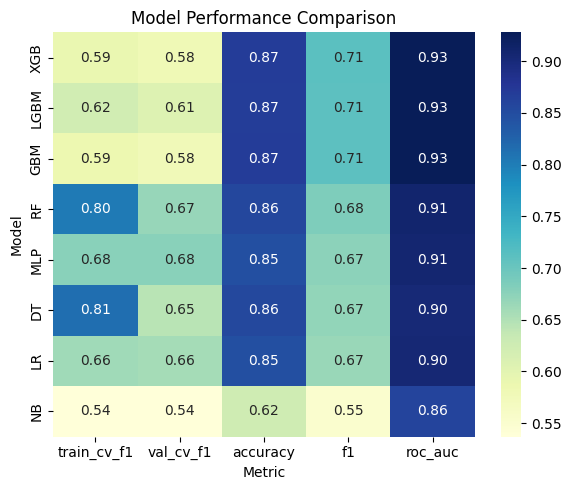

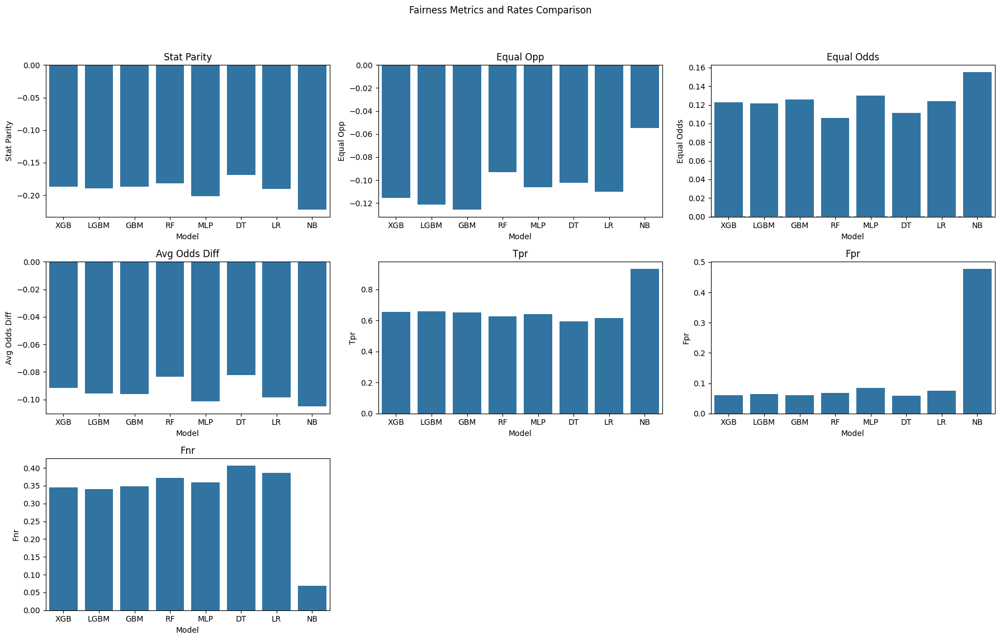

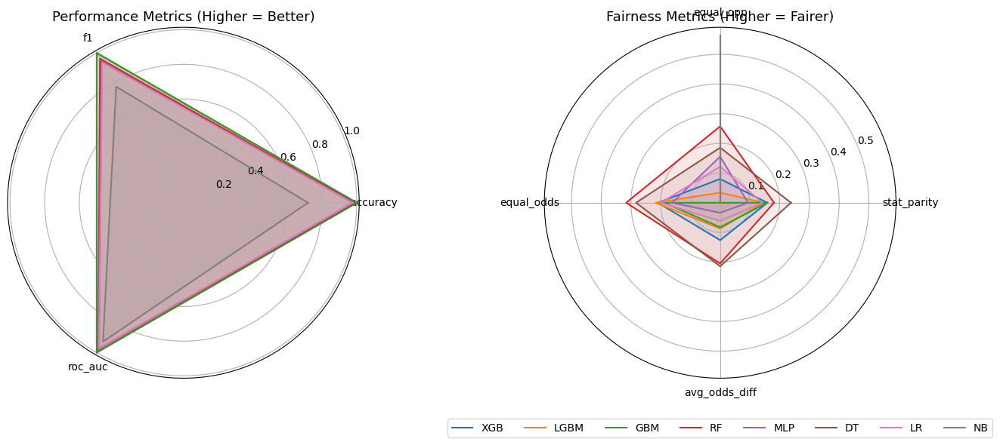

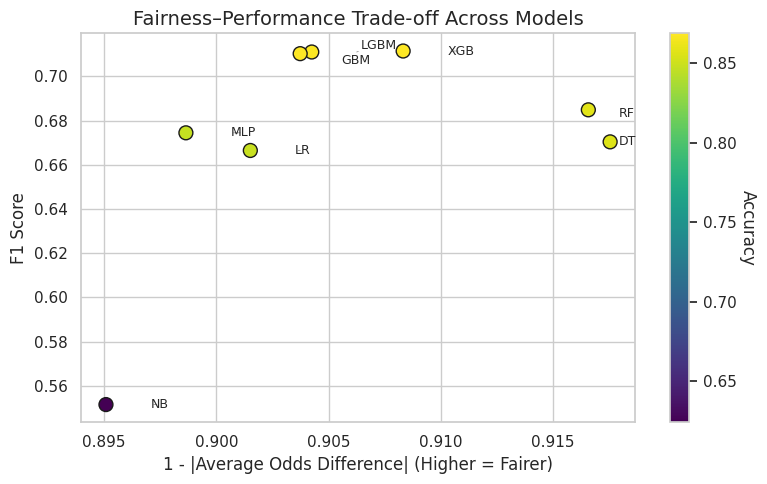

Balanced Best Model: XGB
Model parameters:
{'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': 'logloss', 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 57, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None, 'use_label_encoder': False}


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:37:41] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:46:12] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11

epoch 0; iter: 0; batch classifier loss: 0.721101; batch adversarial loss: 0.743680
epoch 0; iter: 200; batch classifier loss: 0.478734; batch adversarial loss: 0.674097
epoch 0; iter: 400; batch classifier loss: 0.330612; batch adversarial loss: 0.626539
epoch 0; iter: 600; batch classifier loss: 0.232173; batch adversarial loss: 0.663292
epoch 0; iter: 800; batch classifier loss: 0.369065; batch adversarial loss: 0.561020
epoch 0; iter: 1000; batch classifier loss: 0.297591; batch adversarial loss: 0.574387
epoch 1; iter: 0; batch classifier loss: 0.451329; batch adversarial loss: 0.666840
epoch 1; iter: 200; batch classifier loss: 0.316198; batch adversarial loss: 0.616936
epoch 1; iter: 400; batch classifier loss: 0.208506; batch adversarial loss: 0.545479
epoch 1; iter: 600; batch classifier loss: 0.385563; batch adversarial loss: 0.667815
epoch 1; iter: 800; batch classifier loss: 0.263759; batch adversarial loss: 0.581362
epoch 1; iter: 1000; batch classifier loss: 0.298693; bat

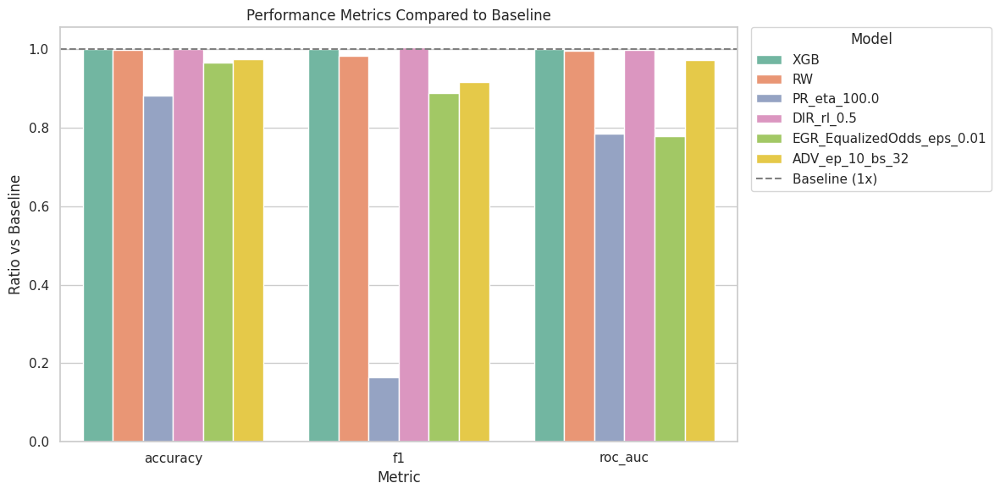

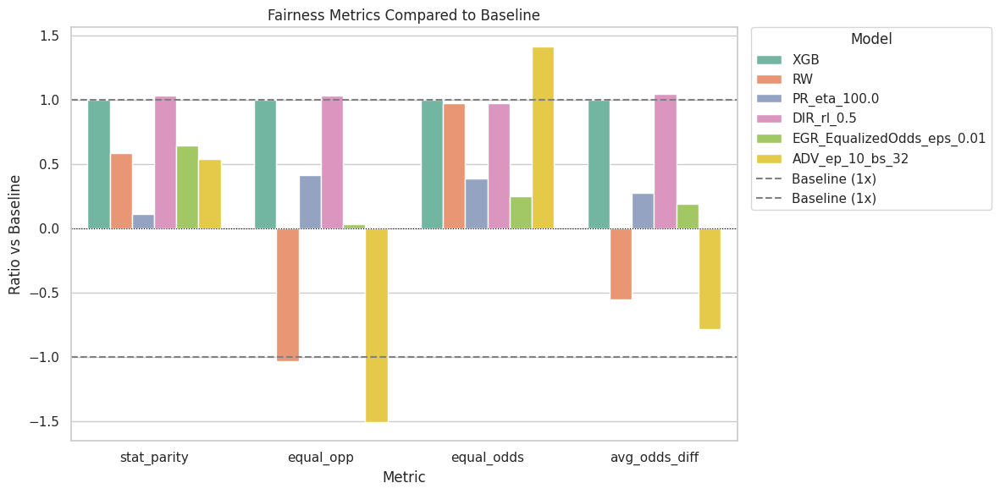

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:55:47] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


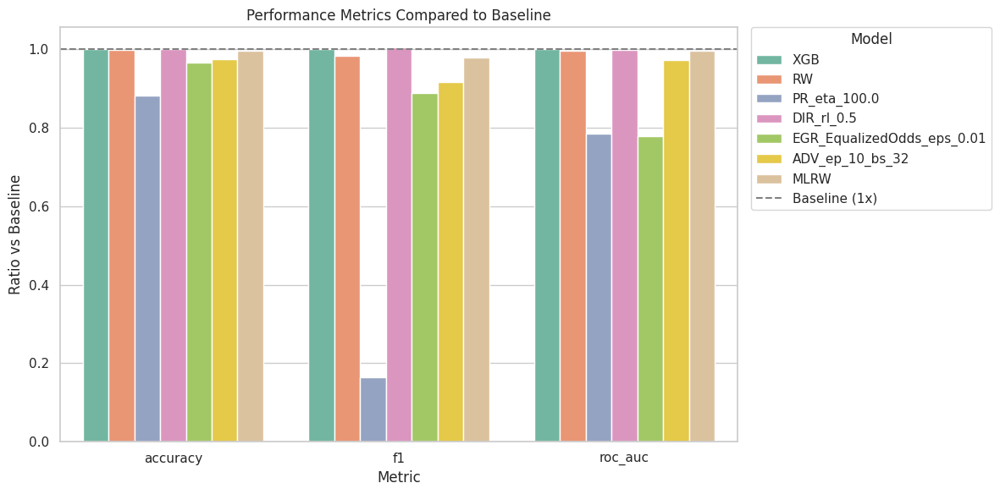

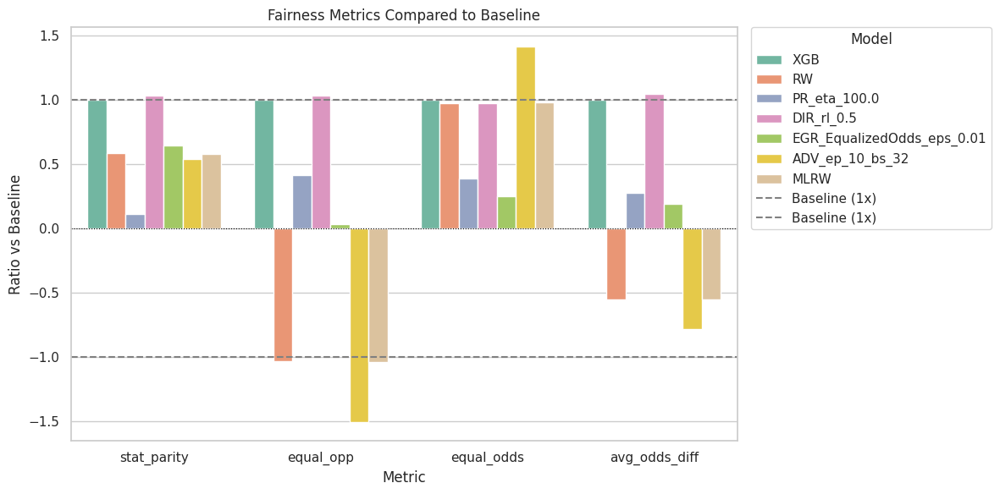

In [ ]:
combined_results, combined_final = run_fair_ml_pipeline(
    data= data,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
XGB,0.590255,0.580776,0.868657,0.711516,0.928010,-0.186858,-0.115569,0.122484,-0.091678,0.655107,0.061144,0.344893,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, ...))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.867330,0.700449,0.924412,-0.110015,0.119474,0.119474,0.050233,0.625781,0.053065,0.374219,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, ...))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_100.0,nan,nan,0.766390,0.117008,0.728538,-0.020816,-0.048045,0.048045,-0.025309,0.062444,0.001617,0.937556,,100.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.5,nan,nan,0.868436,0.715583,0.927115,-0.193529,-0.119368,0.119368,-0.096008,0.667707,0.065412,0.332293,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, ...))])",0.500000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.01,nan,nan,0.839469,0.632219,0.723561,-0.121112,-0.003663,0.031004,-0.017334,0.062444,0.001617,0.937556,"ExponentiatedGradient(constraints=, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0009421827800195058))",0.010000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_32,nan,nan,0.846877,0.652272,0.902614,-0.100669,0.173782,0.173782,0.071373,0.062444,0.001617,0.937556,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.866003,0.696088,0.923801,-0.108641,0.120146,0.120146,0.050605,0.619090,0.052624,0.380910,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_st

In [ ]:
# Export the results DataFrame to a CSV file
combined_final.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult_Sex_original.csv', index=False)

##Modifications to Datasets

###Functions

In [ ]:
def flip_and_adjust_features(df, label_col, sensitive_col, flip_fraction):
    """
    Flip a fraction of privileged group labels and adjust selected features
    to better resemble those from the unprivileged label=0 group.
    """
    # Identify privileged group with label=1
    privileged = (df[sensitive_col] == 1) & (df[label_col] == 1)
    candidates = df[privileged].copy()

    # Randomly select subset to flip
    flip_count = int(flip_fraction * len(candidates))
    to_flip = candidates.sample(flip_count, random_state=42)
    flip_indices = to_flip.index

    # Flip labels
    df.loc[flip_indices, label_col] = 0

    # Reference group for feature adjustment (same sensitive group, opposite label)
    reference_group = df[(df[sensitive_col] == 1) & (df[label_col] == 0)]

    # Define features to adjust
    features_to_adjust = ['workclass','education-num', 'marital-status',
                          'hours-per-week', 'capital-gain',
                          'capital-loss', 'occupation']

    for feature in features_to_adjust:
        valid_values = reference_group[feature].dropna().values
        if len(valid_values) == 0:
            continue  # skip if reference has no valid data

        # Sample same number of values as number of flipped records
        sampled_values = np.random.choice(valid_values, size=flip_count, replace=True)

        # Assign values row by row to avoid shape mismatches
        for idx, val in zip(flip_indices, sampled_values):
            df.at[idx, feature] = val

    return df

In [ ]:
def flip_and_adjust_unprivileged(df, label_col, sensitive_col, flip_fraction):
    """
    Promote a fraction of underprivileged group with label=0 to label=1,
    and adjust their features to resemble label=1 examples.
    """
    # Identify underprivileged group with label=0 (e.g., Female earning <=50k)
    underprivileged = (df[sensitive_col] == 0) & (df[label_col] == 0)
    candidates = df[underprivileged].copy()

    # Determine number to flip
    flip_count = int(flip_fraction * len(candidates))
    to_flip = candidates.sample(flip_count, random_state=42)
    flip_indices = to_flip.index

    # Flip labels to 1
    df.loc[flip_indices, label_col] = 1

    # Reference group for adjustment (underprivileged label=1 or privileged label=1)
    reference_group = df[((df[sensitive_col] == 0) & (df[label_col] == 1)) |
                         ((df[sensitive_col] == 1) & (df[label_col] == 1))]

    features_to_adjust = ['workclass','education-num', 'marital-status',
                          'hours-per-week', 'capital-gain', 'capital-loss', 'occupation']

    for feature in features_to_adjust:
        valid_values = reference_group[feature].dropna().values
        if len(valid_values) == 0:
            continue  # no reference data

        sampled_values = np.random.choice(valid_values, size=flip_count, replace=True)
        for idx, val in zip(flip_indices, sampled_values):
            df.at[idx, feature] = val

    return df

In [ ]:
def flip_near_boundary(X, y, sensitive_col, label_col, flip_fraction, boundary_width=0.2):
    """
    Flip labels for a fraction of privileged group samples near the decision boundary.

    Returns:
        X_encoded_modified: DataFrame (encoded features with flipped labels)
        y_modified: Series (flipped labels)
        flipped_indices: list (indices of flipped samples)
    """
    # --- Combine X and y ---
    data = X.copy()
    data[label_col] = y.values

    # --- One-hot encode categorical features ---
    X_encoded = pd.get_dummies(data.drop(columns=[label_col]), drop_first=True)
    y_array = data[label_col].values

    # --- Fit logistic regression model ---
    model = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear'))
    model.fit(X_encoded, y_array)

    # --- Predict probabilities ---
    probs = model.predict_proba(X_encoded)[:, 1]

    # --- Identify privileged group with positive labels ---
    # Assuming sensitive_col is binary: 1 = privileged, 0 = unprivileged
    # --- Determine privileged group after encoding ---
    if sensitive_col in X.columns and X[sensitive_col].nunique() == 2:
        # Use raw sensitive column (not yet one-hot encoded)
        is_privileged = (X[sensitive_col] == 1)
    else:
        # Look for encoded version of sensitive column
        sensitive_encoded_cols = [col for col in X_encoded.columns if sensitive_col in col]
        if len(sensitive_encoded_cols) == 1:
            priv_col = sensitive_encoded_cols[0]
            is_privileged = (X_encoded[priv_col] == 1)
        elif any(col.endswith('_1') for col in sensitive_encoded_cols):
            priv_col = [col for col in sensitive_encoded_cols if col.endswith('_1')][0]
            is_privileged = (X_encoded[priv_col] == 1)
        else:
            raise ValueError(f"Could not resolve the encoded privileged column for '{sensitive_col}'. Found: {sensitive_encoded_cols}")

    is_positive = (y_array == 1)

    # --- Identify near-boundary privileged-positive samples ---
    boundary_mask = is_privileged & is_positive & ((probs > 0.5 - boundary_width) & (probs < 0.5 + boundary_width))
    candidates = X_encoded[boundary_mask]

    # --- Randomly select a fraction to flip ---
    n_flip = int(flip_fraction * len(candidates))
    if n_flip == 0:
        print("No samples selected for flipping. Try increasing flip_fraction or boundary_width.")
        return X_encoded, pd.Series(y_array, index=X_encoded.index), []

    flipped_indices = candidates.sample(n=n_flip, random_state=42).index

    # --- Flip labels ---
    y_modified = pd.Series(y_array, index=X_encoded.index)
    y_modified.loc[flipped_indices] = 0  # Flip from '>50K' (1) to '<=50K' (0)

    print(f"Flipped {len(flipped_indices)} privileged labels near boundary from 1 to 0.")

    return X_encoded, y_modified, flipped_indices

In [ ]:
def flip_near_boundary_underprivileged(X, y, sensitive_col, label_col, flip_fraction, boundary_width=0.2):
    """
    Flip labels for a fraction of underprivileged group samples near the decision boundary,
    promoting from 0 → 1 to simulate upward mobility.

    Returns:
        X_encoded_modified: DataFrame (encoded features with flipped labels)
        y_modified: Series (flipped labels)
        flipped_indices: list (indices of flipped samples)
    """
    data = X.copy()
    data[label_col] = y.values

    # Encode categorical features
    X_encoded = pd.get_dummies(data.drop(columns=[label_col]), drop_first=True)
    y_array = data[label_col].values

    # Train classifier
    model = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear'))
    model.fit(X_encoded, y_array)

    probs = model.predict_proba(X_encoded)[:, 1]

    # Identify underprivileged group (assumes 0 = underprivileged)
    if sensitive_col in X.columns and X[sensitive_col].nunique() == 2:
        is_underprivileged = (X[sensitive_col] == 0)
    else:
        # Check encoded sensitive col
        sensitive_encoded_cols = [col for col in X_encoded.columns if sensitive_col in col]
        if len(sensitive_encoded_cols) == 1:
            under_col = sensitive_encoded_cols[0]
            is_underprivileged = (X_encoded[under_col] == 1)
        elif any(col.endswith('_0') for col in sensitive_encoded_cols):
            under_col = [col for col in sensitive_encoded_cols if col.endswith('_0')][0]
            is_underprivileged = (X_encoded[under_col] == 1)
        else:
            raise ValueError(f"Could not resolve encoded underprivileged group for '{sensitive_col}'. Found: {sensitive_encoded_cols}")

    is_negative = (y_array == 0)

    # Candidates: underprivileged group with label=0 near boundary
    boundary_mask = is_underprivileged & is_negative & ((probs > 0.5 - boundary_width) & (probs < 0.5 + boundary_width))
    candidates = X_encoded[boundary_mask]

    n_flip = int(flip_fraction * len(candidates))
    if n_flip == 0:
        print("No samples selected for flipping. Try increasing flip_fraction or boundary_width.")
        return X_encoded, pd.Series(y_array, index=X_encoded.index), []

    flipped_indices = candidates.sample(n=n_flip, random_state=42).index

    y_modified = pd.Series(y_array, index=X_encoded.index)
    y_modified.loc[flipped_indices] = 1  # promote: 0 → 1

    print(f"Flipped {len(flipped_indices)} underprivileged labels near boundary from 0 to 1.")

    return X_encoded, y_modified, flipped_indices

In [ ]:
def compare_multiple_feature_distributions(original_df, flipped_df, features, figsize=(15, 10), ncols=3):
    """
    Compare KDE distributions of multiple features between original and flipped datasets in a grid of subplots,
    and annotate each plot with the KS-test p-value.

    Args:
        original_df (pd.DataFrame): Original dataset.
        flipped_df (pd.DataFrame): Flipped/modified dataset.
        features (list): List of features to compare.
        figsize (tuple): Size of the overall figure.
        ncols (int): Number of columns in the subplot grid.
    """
    n_features = len(features)
    nrows = (n_features + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()

    for idx, feature in enumerate(features):
        ax = axes[idx]

        # Plot KDE
        sns.kdeplot(original_df[feature], fill=True, label='Original', color='blue', ax=ax)
        sns.kdeplot(flipped_df[feature], fill=True, label='Flipped', color='orange', ax=ax)

        # Perform KS test
        ks_stat, p_value = ks_2samp(original_df[feature].dropna(), flipped_df[feature].dropna())

        # Annotate with p-value
        ax.set_title(f"{feature}\nKS D={ks_stat:.3f}, p={p_value:.4f}")
        ax.legend()

    # Remove empty subplots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_biased_data_comparison(datasets, sensitive_feature, label_col):
    """
    Compare class distributions across multiple datasets grouped by a sensitive feature.

    Args:
        datasets (list of tuples): [(DataFrame, "Label"), ...]
        sensitive_feature (str): Column name of the sensitive feature (e.g., 'sex')
        label_col (str): Target label column name (e.g., 'income')
    """
    # Preserve the source order from the input
    source_order = [label for _, label in datasets]

    # Tag and combine
    combined_list = []
    for df, source_name in datasets:
        df_copy = df.copy()
        df_copy['Source'] = source_name
        combined_list.append(df_copy)

    combined_df = pd.concat(combined_list, axis=0)

    # Compute proportions
    grouped = (
        combined_df
        .groupby(['Source', sensitive_feature])[label_col]
        .value_counts(normalize=True)
        .rename("Proportion")
        .reset_index()
    )

    # Ensure Source has a defined order
    grouped['Source'] = pd.Categorical(grouped['Source'], categories=source_order, ordered=True)

    # Create a new x-label combining group and source in a consistent order
    grouped['Group'] = grouped[sensitive_feature].astype(str) + " (" + grouped['Source'].astype(str) + ")"

    # Sort by Source and then Group to ensure correct plotting order
    grouped = grouped.sort_values(by=['Source', 'Group'])

    # Plot
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(data=grouped, x='Group', y='Proportion', hue=label_col, palette='Set2')

    # Add percentage text on each bar
    for container in ax.containers:
        ax.bar_label(container, labels=[f'{p.get_height()*100:.1f}%' for p in container],
                     label_type='edge', padding=3, fontsize=8)

    plt.title(f'Class Distribution by {sensitive_feature.title()} Across Datasets')
    plt.ylabel("Proportion")
    plt.xlabel(f"{sensitive_feature.title()} Group (by Dataset)")
    plt.xticks(rotation=90)
    plt.legend(
        title=label_col,
        bbox_to_anchor=(1.01, 1),
        loc='upper left',
        borderaxespad=0)
    plt.tight_layout()
    plt.show()

**Statistical Interpretaion:**

* KS Stat near 0: little or no shift.
* Higher KS Stat: stronger difference in distributions.
* Low p-values (< 0.05) suggest that the distributions are significantly different.

In [ ]:
from scipy.stats import ks_2samp

def ks_feature_shift(original_df, flipped_df, features):
    for f in features:
        stat, p = ks_2samp(original_df[f], flipped_df[f])
        print(f"Feature: {f} | KS Stat: {stat:.4f} | p-value: {p:.4f}")

In [ ]:
def ks_feature_shift_table(original_df, modified_datasets, features, alpha=0.05):
    rows = []
    for modified_df, label in modified_datasets:
        for f in features:
            try:
                stat, p = ks_2samp(original_df[f].dropna(), modified_df[f].dropna())
                rows.append({
                    'Dataset': label,
                    'Feature': f,
                    'KS Stat': stat,
                    'p-value': p,
                    f'Significant (p < {alpha:.2g})': p < alpha
                })
            except Exception as e:
                rows.append({
                    'Dataset': label,
                    'Feature': f,
                    'KS Stat': None,
                    'p-value': None,
                    f'Significant (p < {alpha:.2g})': False
                })

    return pd.DataFrame(rows)

### Dataset Modification - Increase Bias on underprivileged group

Flip Labels - Ratio: 0.3 reduce Priv (biased_df_flip)

In [ ]:
# Flipping only the income labels for a fraction of the Privileged group (no adjustment of features)
# Frac = 0.3
biased_df_flip_1 = data.copy()
flip_mask = (biased_df_flip_1[sensitive_feature] == 1) & (biased_df_flip_1[target] == 1)
flip_idx = biased_df_flip_1[flip_mask].sample(frac=0.3, random_state=random_seed).index
biased_df_flip_1.loc[flip_idx, target] = 0

In [ ]:
# Flipping only the income labels for a fraction of the Privileged group (no adjustment of features)
# Frac = 0.5
biased_df_flip_2 = data.copy()
flip_mask = (biased_df_flip_2[sensitive_feature] == 1) & (biased_df_flip_2[target] == 1)
flip_idx = biased_df_flip_2[flip_mask].sample(frac=0.5, random_state=random_seed).index
biased_df_flip_2.loc[flip_idx, target] = 0

In [ ]:
# Flipping the income labels for a fraction of the Privileged group with feature adjustment
# Frac = 0.3
bias_adjust_flip_1 = flip_and_adjust_features(data.copy(), label_col=target, sensitive_col=sensitive_feature, flip_fraction=0.3)

In [ ]:
# save bias_adust_flip_1 to drive
bias_adjust_flip_1.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/Adult_Census_bias1.csv')

In [ ]:
# Flipping the income labels for a fraction of the Privileged group with feature adjustment
# Frac = 0.3
bias_adjust_flip_2 = flip_and_adjust_features(data.copy(), label_col=target, sensitive_col=sensitive_feature, flip_fraction=0.5)

In [ ]:
# save bias_adust_flip_2 to drive
bias_adjust_flip_2.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/Adult_Census_bias2.csv')

In [ ]:
# Flipping the income labels for a fraction of the Privileged Group at boundary cases
# Frac = 0.5, boundary_width=0.2 (fixed in flip_near_boundary function)
X_flipped, y_flipped, flipped_idx = flip_near_boundary(
    X=data.drop(columns=target),
    y=data[target],
    sensitive_col=sensitive_feature,
    label_col=target,
    flip_fraction=0.5
)

Flipped 1968 privileged labels near boundary from 1 to 0.


In [ ]:
# Ratio of flipped_indices (boundary cases) against the privileged, high income population
print("Percentage of boundary cases flipped upon Privileged group population:")
print(f"{len(flipped_idx) / len(X_flipped[X_flipped[sensitive_feature] == 1])*100:.2f}%")

Percentage of boundary cases flipped upon Privileged group population:
6.45%


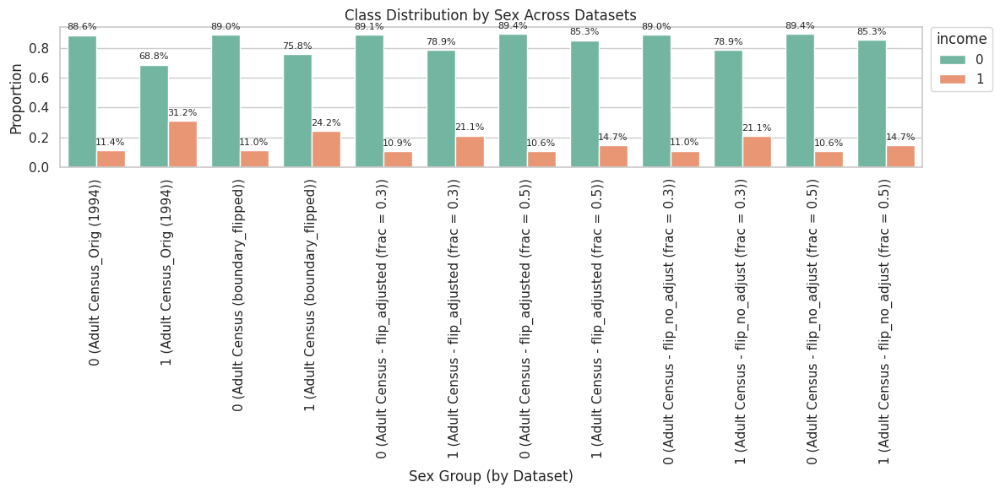

In [ ]:
# Transform X_flipped to be used in plot_biased_data_comparison, including y_flipped
X_flipped.insert(0, target, y_flipped)

# Show comparison of datasets (income labels for privileged and underprivileged groups)
plot_biased_data_comparison(
    datasets=[
        (data, "Adult Census_Orig (1994)"),
        (X_flipped, "Adult Census (boundary_flipped)"),
        (bias_adjust_flip_1, "Adult Census - flip_adjusted (frac = 0.3)"),
        (bias_adjust_flip_2, "Adult Census - flip_adjusted (frac = 0.5)"),
        (biased_df_flip_1, "Adult Census - flip_no_adjust (frac = 0.3)"),
        (biased_df_flip_2, "Adult Census - flip_no_adjust (frac = 0.5)")
    ],
    sensitive_feature=sensitive_feature,
    label_col=target
)

In [ ]:
datasets = [
    (X_flipped, "Adult Census (boundary_flipped)"),
    (bias_adjust_flip_1, "Adult Census - flip_adjusted (frac = 0.3)"),
    (bias_adjust_flip_2, "Adult Census - flip_adjusted (frac = 0.5)"),
    (biased_df_flip_1, "Adult Census - flip_no_adjust (frac = 0.3)"),
    (biased_df_flip_2, "Adult Census - flip_no_adjust (frac = 0.5)")
]

features_to_compare = ['workclass', 'education-num', 'marital-status', 'hours-per-week',
                       'capital-gain', 'capital-loss', 'occupation', 'age']

# Generate table
ks_table = ks_feature_shift_table(data, datasets, features_to_compare)

# Define column name for significance
signif_col = [col for col in ks_table.columns if col.startswith("Significant")][0]

# Define highlighter
def highlight_significant(row):
    if pd.isnull(row['KS Stat']) or pd.isnull(row['p-value']):
        return [''] * len(row)
    color = 'background-color: lightgreen' if row[signif_col] and row['KS Stat'] > 0.01 else ''
    return [color if col in ['KS Stat', 'p-value'] else '' for col in ks_table.columns]

# Apply styling
ks_table_sorted = ks_table.sort_values(by=['Feature', 'Dataset'])
ks_table_sorted.style \
    .apply(highlight_significant, axis=1) \
    .format({
        "KS Stat": "{:.3f}",
        "p-value": "{:.4f}"
    })

,Dataset,Feature,KS Stat,p-value,Significant (p < 0.05)
7,Adult Census (boundary_flipped),age,0.000,1.0000,False
15,Adult Census - flip_adjusted (frac = 0.3),age,0.000,1.0000,False
23,Adult Census - flip_adjusted (frac = 0.5),age,0.000,1.0000,False
31,Adult Census - flip_no_adjust (frac = 0.3),age,0.000,1.0000,False
39,Adult Census - flip_no_adjust (frac = 0.5),age,0.000,1.0000,False
4,Adult Census (boundary_flipped),capital-gain,0.000,1.0000,False
12,Adult Census - flip_adjusted (frac = 0.3),capital-gain,0.010,0.0163,True
20,Adult Census - flip_adjusted (frac = 0.5),capital-gain,0.015,0.0001,True
28,Adult Census - flip_no_adjust (frac = 0.3),capital-gain,0.000,1.0000,False
36,Adult Census - flip_no_adjust (frac = 0.5),capital-gain,0.000,1.0000,False


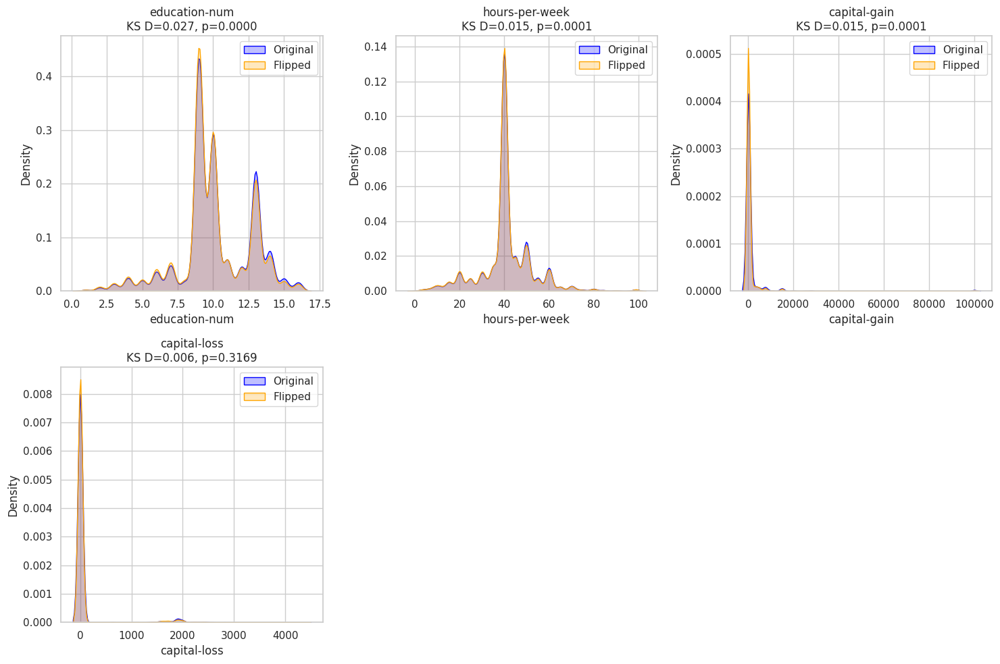

In [ ]:
features_to_compare = ['education-num', 'hours-per-week', 'capital-gain','capital-loss']
compare_multiple_feature_distributions(data, bias_adjust_flip_2, features_to_compare)

**Run the pipeline for biased datasets to show the metric differences for feature adjustments or boundary case vs just flipping labels.**

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:03:04] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 4846, number of negative: 31331
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 766
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 85
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.133953 -> initscore=-1.866454
[LightGBM] [Info] Start training from score -1.866454


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

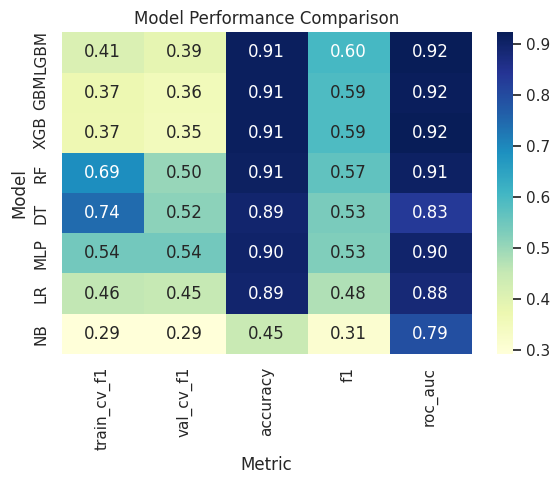

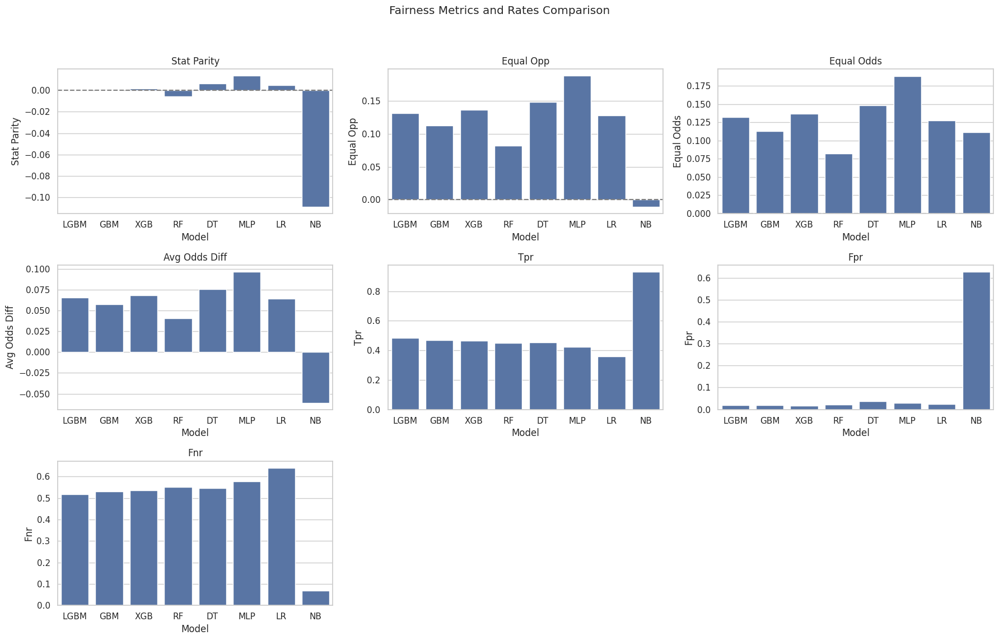

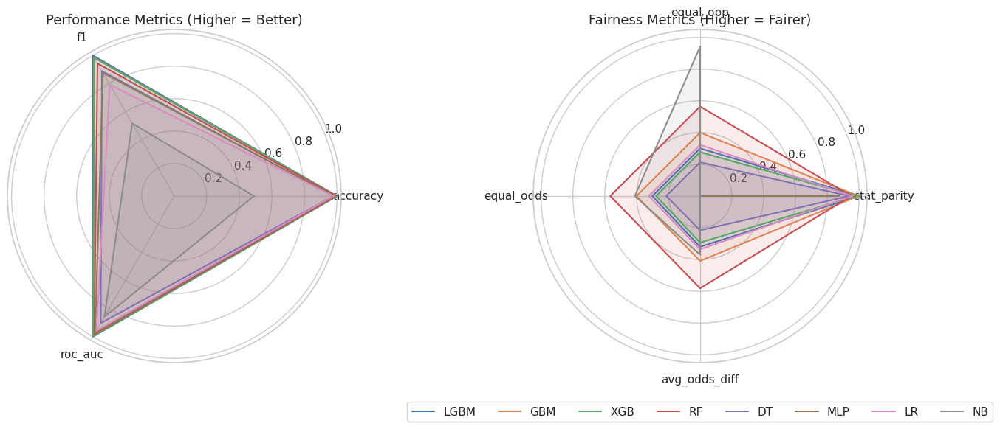

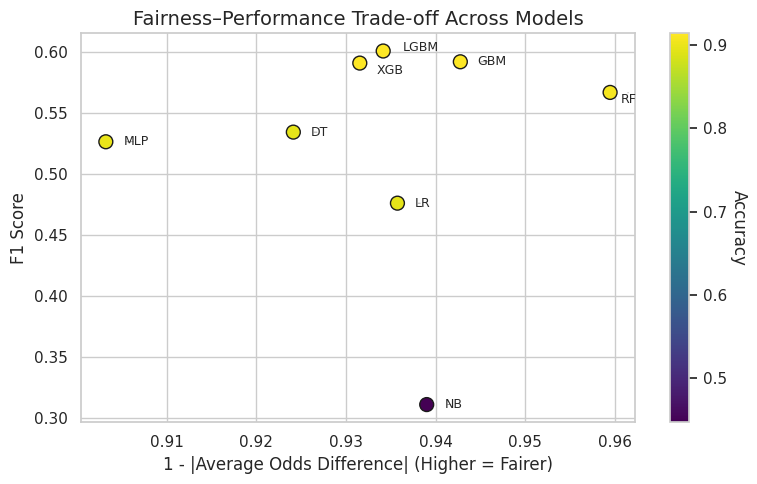

Balanced Best Model: GBM
Model parameters:
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 5, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 57, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler 

epoch 0; iter: 0; batch classifier loss: 0.687297; batch adversarial loss: 0.723655
epoch 0; iter: 200; batch classifier loss: 0.217565; batch adversarial loss: 0.674485
epoch 0; iter: 400; batch classifier loss: 0.237846; batch adversarial loss: 0.646311
epoch 0; iter: 600; batch classifier loss: 0.149818; batch adversarial loss: 0.659190
epoch 0; iter: 800; batch classifier loss: 0.107855; batch adversarial loss: 0.641696
epoch 0; iter: 1000; batch classifier loss: 0.173710; batch adversarial loss: 0.617728
epoch 1; iter: 0; batch classifier loss: 0.258020; batch adversarial loss: 0.557294
epoch 1; iter: 200; batch classifier loss: 0.437420; batch adversarial loss: 0.682557
epoch 1; iter: 400; batch classifier loss: 0.447206; batch adversarial loss: 0.703986
epoch 1; iter: 600; batch classifier loss: 0.281192; batch adversarial loss: 0.647636
epoch 1; iter: 800; batch classifier loss: 0.310296; batch adversarial loss: 0.655584
epoch 1; iter: 1000; batch classifier loss: 0.183463; bat

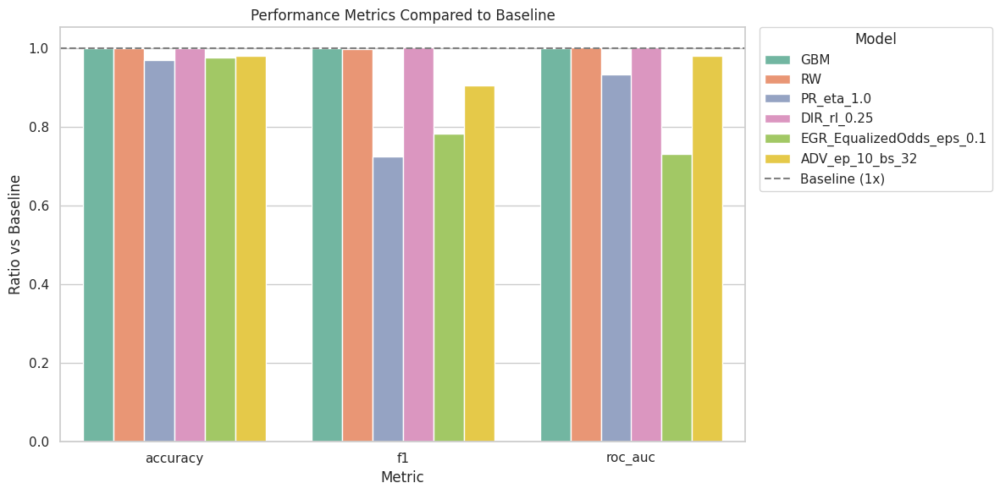

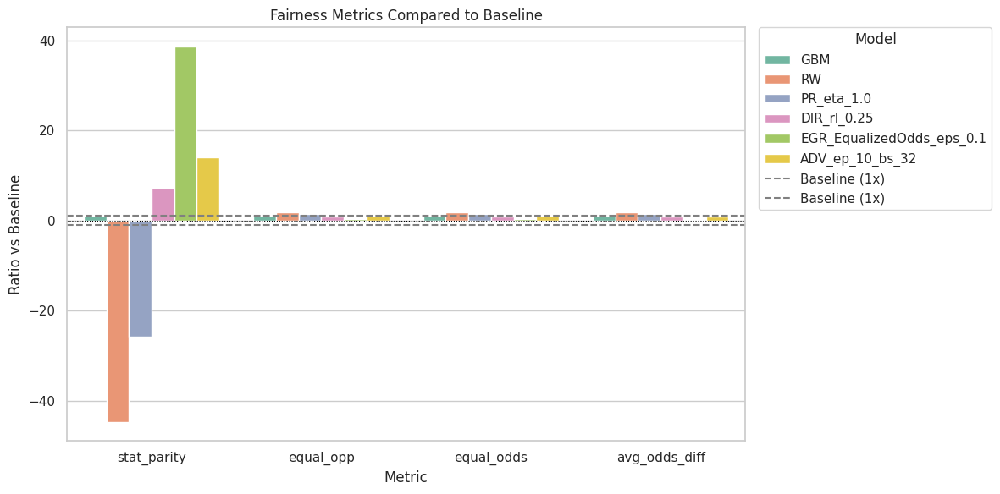

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


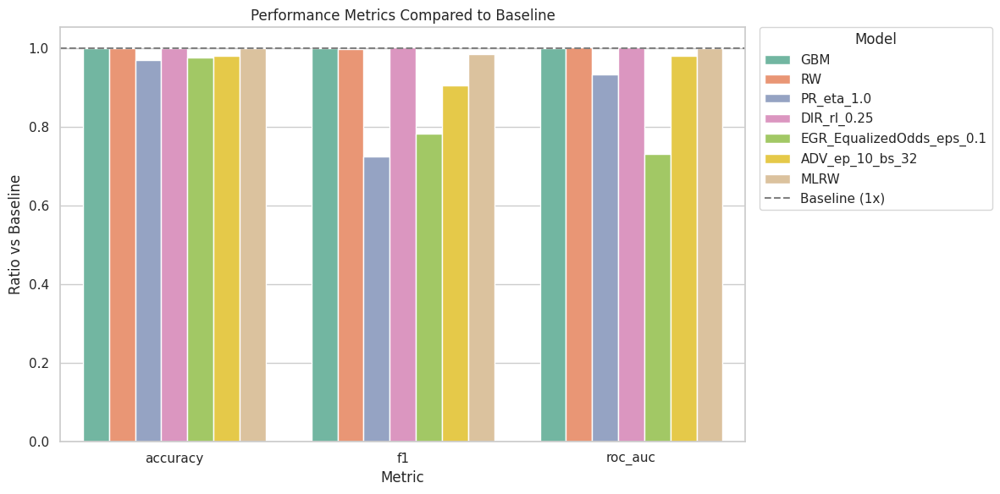

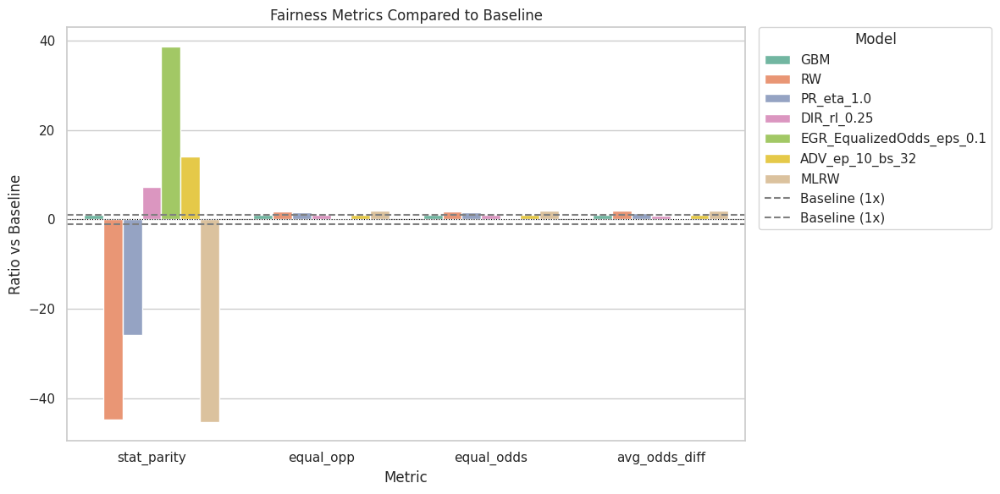

In [ ]:
combined_results_flip_adjusted, combined_final_flip_adjusted = run_fair_ml_pipeline(
    data= bias_adjust_flip_2,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_flip_adjusted.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
GBM,0.369467,0.356050,0.913212,0.591726,0.915222,-0.000426,0.112940,0.112940,0.057242,0.469792,0.018253,0.530208,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GradientBoostingClassifier(max_depth=5, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.913322,0.589958,0.917135,0.019064,0.211126,0.211126,0.110633,0.465731,0.017488,0.534269,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GradientBoostingClassifier(max_depth=5, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_1.0,nan,nan,0.886899,0.428811,0.855306,0.011004,0.169656,0.169656,0.085130,0.317093,0.025019,0.682907,,1.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.25,nan,nan,0.913543,0.593555,0.916783,-0.003124,0.106316,0.106316,0.052854,0.471511,0.018126,0.528489,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GradientBoostingClassifier(max_depth=5, random_state=57))])",0.250000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.1,nan,nan,0.892316,0.463065,0.669405,-0.016521,0.036365,0.036365,0.012525,0.317093,0.025019,0.682907,"ExponentiatedGradient(constraints=, eps=0.1, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0008131606299243672))",0.100000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_32,nan,nan,0.896296,0.536103,0.897772,-0.005975,0.117942,0.117942,0.055474,0.317093,0.025019,0.682907,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.912548,0.582586,0.915994,0.019311,0.212013,0.212013,0.110978,0.455822,0.016850,0.544178,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GradientBoostingClassifier(max_depth=5, random_state=57))])",nan,-0.026060,0.031611,0.031611,0.015161,0.455822,0.016850,0.544178


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_flip_adjusted.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Flip2.csv')

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [21:35:45] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 4841, number of negative: 31336
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 758
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.133814 -> initscore=-1.867646
[LightGBM] [Info] Start training from score -1.867646


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

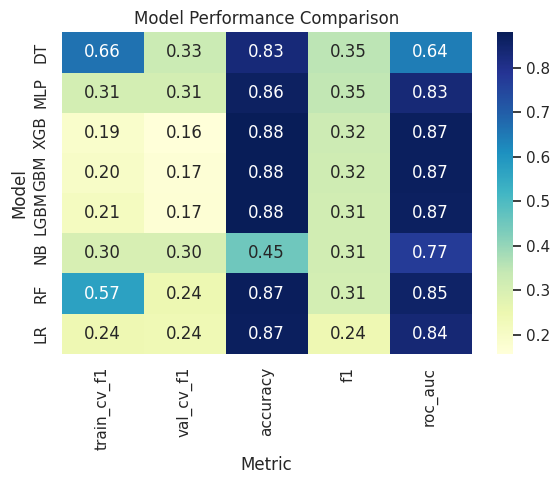

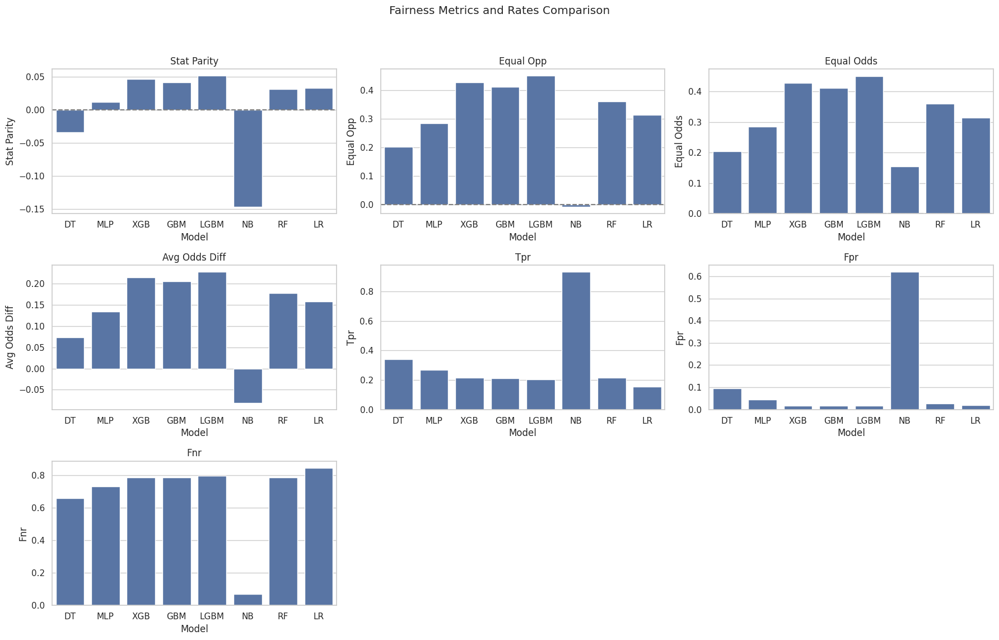

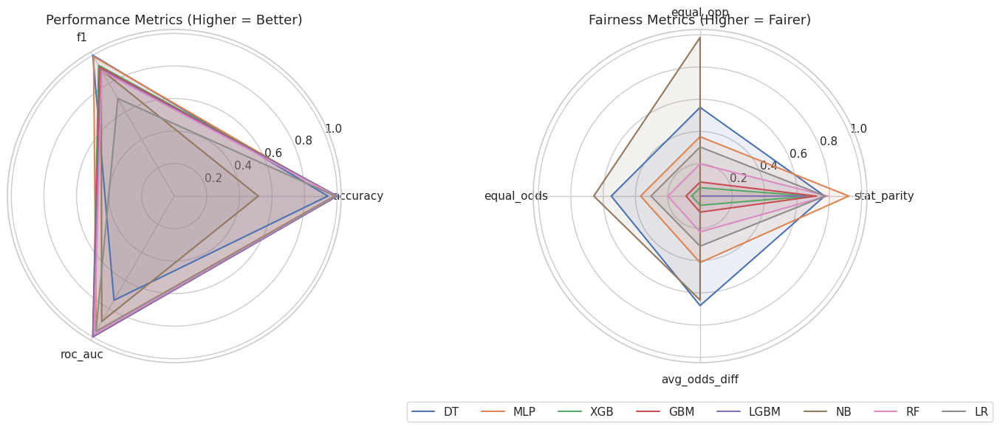

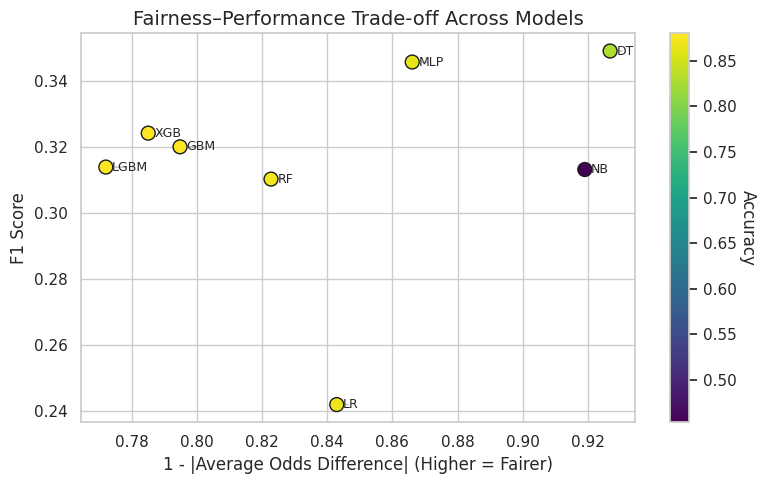

Balanced Best Model: NB
Model parameters: {'priors': None, 'var_smoothing': 1e-07}


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


epoch 0; iter: 0; batch classifier loss: 0.719807; batch adversarial loss: 0.693701
epoch 0; iter: 200; batch classifier loss: 0.324856; batch adversarial loss: 0.668140
epoch 0; iter: 400; batch classifier loss: 0.243159; batch adversarial loss: 0.624069
epoch 1; iter: 0; batch classifier loss: 0.378196; batch adversarial loss: 0.656562
epoch 1; iter: 200; batch classifier loss: 0.335408; batch adversarial loss: 0.600450
epoch 1; iter: 400; batch classifier loss: 0.227379; batch adversarial loss: 0.627016
epoch 2; iter: 0; batch classifier loss: 0.261220; batch adversarial loss: 0.636972
epoch 2; iter: 200; batch classifier loss: 0.231152; batch adversarial loss: 0.668136
epoch 2; iter: 400; batch classifier loss: 0.294568; batch adversarial loss: 0.610718
epoch 3; iter: 0; batch classifier loss: 0.381926; batch adversarial loss: 0.633067
epoch 3; iter: 200; batch classifier loss: 0.317299; batch adversarial loss: 0.676581
epoch 3; iter: 400; batch classifier loss: 0.380226; batch adv

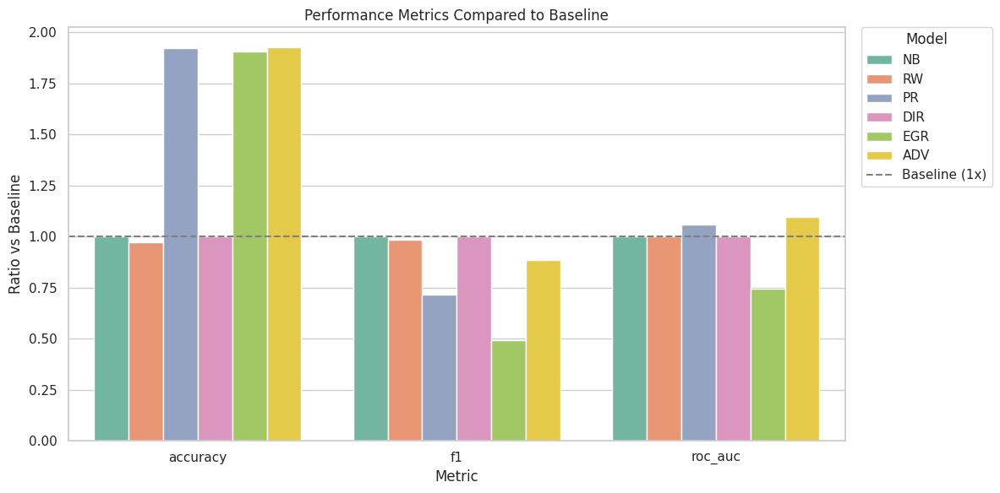

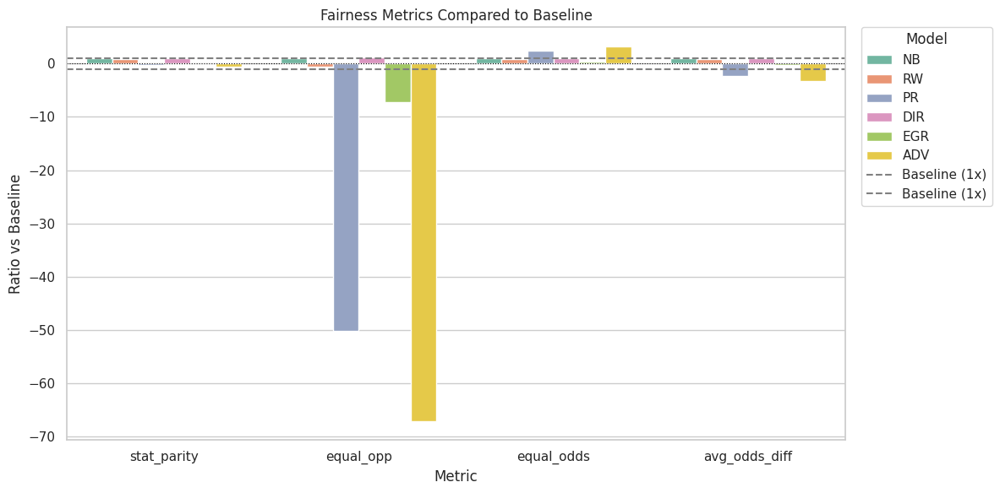

/tmp/ipython-input-26-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-26-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


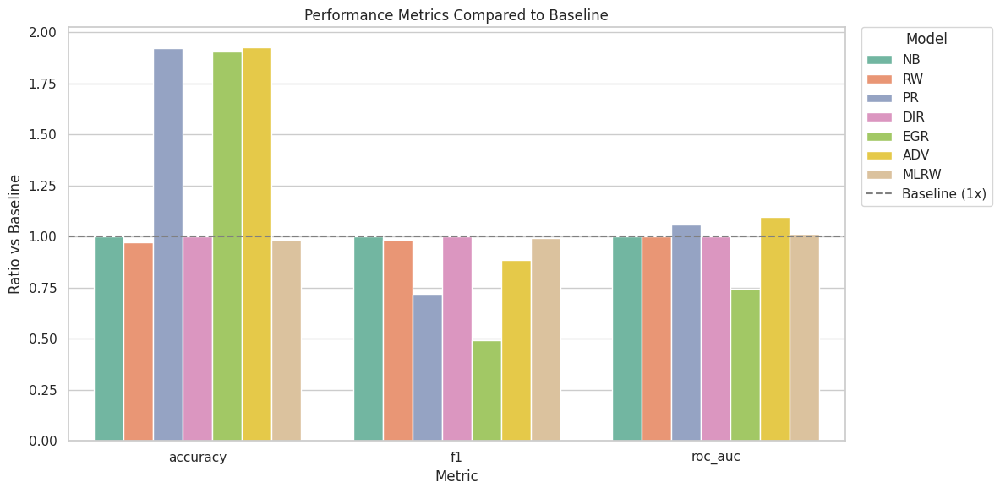

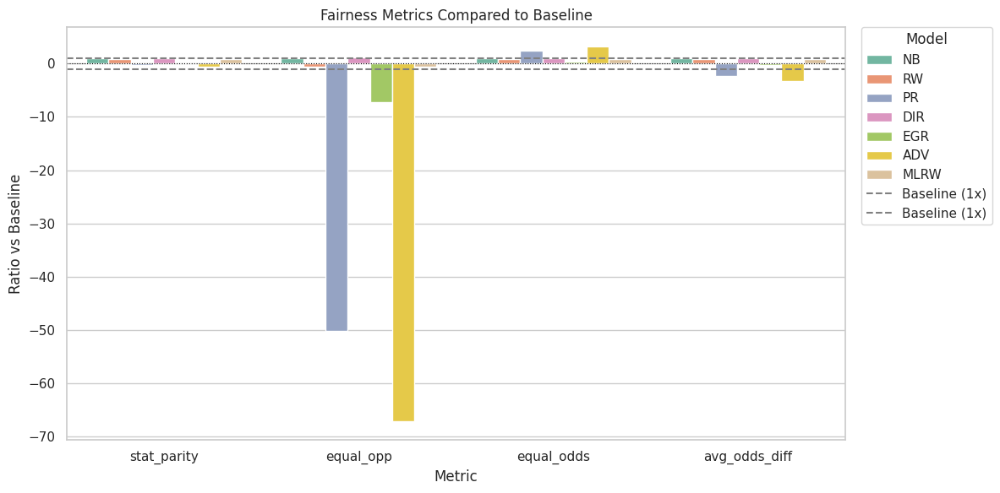

In [ ]:
combined_results_flip_non_adjusted, combined_final_flip_non_adjusted = run_fair_ml_pipeline(
    data=biased_df_flip_2,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_flip_non_adjusted.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model
NB,0.300382,0.299290,0.453621,0.313210,0.774872,-0.147065,-0.007559,0.154334,-0.080946,0.931328,0.620180,0.068672,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GaussianNB(var_smoothing=1e-07))])"
RW,nan,nan,0.440464,0.308701,0.776865,-0.130030,0.003945,0.137078,-0.066567,0.933884,0.635737,0.066116,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GaussianNB(var_smoothing=1e-07))])"
PR,nan,nan,0.872526,0.223569,0.819308,0.047393,0.379621,0.379621,0.193210,0.137190,0.013912,0.862810,
DIR,nan,nan,0.453621,0.313230,0.774867,-0.147306,-0.009242,0.154448,-0.081845,0.931405,0.620166,0.068595,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GaussianNB(var_smoothing=1e-07))])"
EGR,nan,nan,0.864787,0.154803,0.577038,-0.013715,0.055081,0.055081,0.017447,0.092562,0.015954,0.907438,"ExponentiatedGradient(constraints=, estimator=LogisticRegression(solver='liblinear'), nu=np.float64(0.0008795803196143715))"
ADV,nan,nan,0.874185,0.277001,0.848456,0.076610,0.507190,0.507190,0.265649,0.180165,0.018634,0.819835,
MLRW,nan,nan,0.445661,0.310696,0.784147,-0.125756,0.003945,0.131973,-0.064014,0.933884,0.629738,0.066116,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', GaussianNB(var_smoothing=1e-07))])"


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_flip_non_adjusted.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Flip2(non-adjusted).csv')

### Flip Label frac=0.3/0.5 improve UnderPriv (bias_adjust_flip_3, bias_adjust_flip_4)

**Flip labels**

Increasing favourable outcomes for UnderPrivileged Group
Randomly flip income <=50K labels to >50K in the underprivileged group (e.g. sex = Female or race = non-white).

In [ ]:
# Flipping the income labels for a fraction of the Under-Privileged group with feature adjustment
# Frac = 0.3
bias_adjust_flip_3 = flip_and_adjust_unprivileged(data.copy(), label_col=target, sensitive_col=sensitive_feature, flip_fraction=0.3)

In [ ]:
# save bias_adust_flip_3 to drive
bias_adjust_flip_3.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/Adult_Census_bias3.csv')

In [ ]:
# Flipping the income labels for a fraction of the Under-Privileged group with feature adjustment
# Frac = 0.5
bias_adjust_flip_4 = flip_and_adjust_unprivileged(data.copy(), label_col=target, sensitive_col=sensitive_feature, flip_fraction=0.5)

In [ ]:
# save bias_adust_flip_4 to drive
bias_adjust_flip_4.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/Adult_Census_bias4.csv')

In [ ]:
# Flipping the income labels for a fraction of the Under-Privileged Group at boundary cases
# Frac = 0.5, boundary_width=0.2 (fixed in flip_near_boundary function)
X_flipped_UP, y_flipped_UP, flipped_idx_UP = flip_near_boundary_underprivileged(
    X=data.drop(columns=target),
    y=data[target],
    sensitive_col=sensitive_feature,
    label_col=target,
    flip_fraction=0.5
)

Flipped 298 underprivileged labels near boundary from 0 to 1.


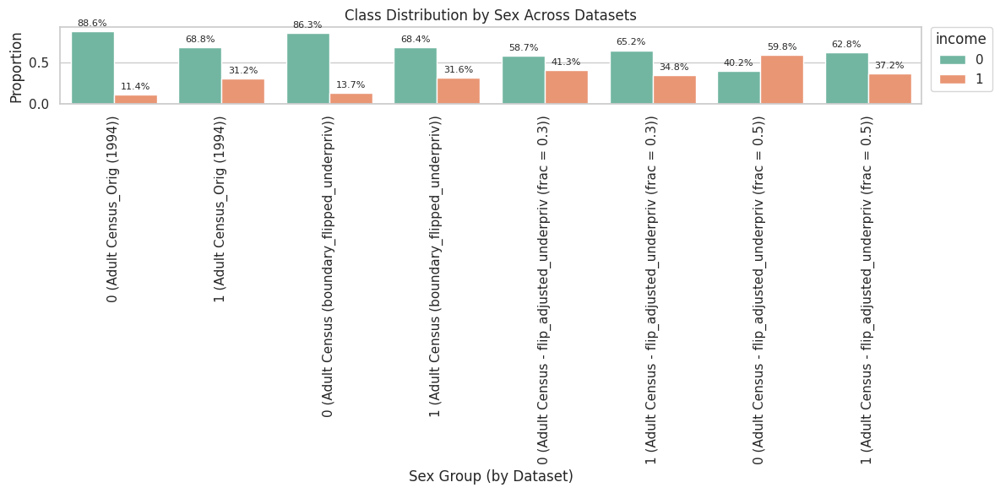

In [ ]:
# Transform X_flipped to be used in plot_biased_data_comparison, including y_flipped
X_flipped_UP.insert(0, target, y_flipped_UP)

# Show comparison of datasets (income labels for privileged and underprivileged groups)
plot_biased_data_comparison(
    datasets=[
        (data, "Adult Census_Orig (1994)"),
        (X_flipped_UP, "Adult Census (boundary_flipped_underpriv)"),
        (bias_adjust_flip_3, "Adult Census - flip_adjusted_underpriv (frac = 0.3)"),
        (bias_adjust_flip_4, "Adult Census - flip_adjusted_underpriv (frac = 0.5)")
    ],
    sensitive_feature=sensitive_feature,
    label_col=target
)

In [ ]:
datasets = [
    (data, "Adult Census_Orig (1994)"),
    (X_flipped_UP, "Adult Census (boundary_flipped_underpriv)"),
    (bias_adjust_flip_3, "Adult Census - flip_adjusted_underpriv (frac = 0.3)"),
    (bias_adjust_flip_4, "Adult Census - flip_adjusted_underpriv (frac = 0.5)")
]

features_to_compare = ['workclass', 'education-num', 'marital-status', 'hours-per-week',
                       'capital-gain', 'capital-loss', 'occupation', 'age']

# Generate table
ks_table = ks_feature_shift_table(data, datasets, features_to_compare)

# Define column name for significance
signif_col = [col for col in ks_table.columns if col.startswith("Significant")][0]

# Define highlighter
def highlight_significant(row):
    if pd.isnull(row['KS Stat']) or pd.isnull(row['p-value']):
        return [''] * len(row)
    color = 'background-color: lightgreen' if row[signif_col] and row['KS Stat'] > 0.01 else ''
    return [color if col in ['KS Stat', 'p-value'] else '' for col in ks_table.columns]

# Apply styling
ks_table_sorted = ks_table.sort_values(by=['Feature', 'Dataset'])
ks_table_sorted.style \
    .apply(highlight_significant, axis=1) \
    .format({
        "KS Stat": "{:.3f}",
        "p-value": "{:.4f}"
    })

,Dataset,Feature,KS Stat,p-value,Significant (p < 0.05)
15,Adult Census (boundary_flipped_underpriv),age,0.000,1.0000,False
23,Adult Census - flip_adjusted_underpriv (frac = 0.3),age,0.000,1.0000,False
31,Adult Census - flip_adjusted_underpriv (frac = 0.5),age,0.000,1.0000,False
7,Adult Census_Orig (1994),age,0.000,1.0000,False
12,Adult Census (boundary_flipped_underpriv),capital-gain,0.000,1.0000,False
20,Adult Census - flip_adjusted_underpriv (frac = 0.3),capital-gain,0.015,0.0001,True
28,Adult Census - flip_adjusted_underpriv (frac = 0.5),capital-gain,0.020,0.0000,True
4,Adult Census_Orig (1994),capital-gain,0.000,1.0000,False
13,Adult Census (boundary_flipped_underpriv),capital-loss,0.000,1.0000,False
21,Adult Census - flip_adjusted_underpriv (frac = 0.3),capital-loss,0.007,0.2860,False


### Genetic Algorithm Modification

In [ ]:
df_unfair = pd.read_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/Adult_Census_GenAlgo.csv')

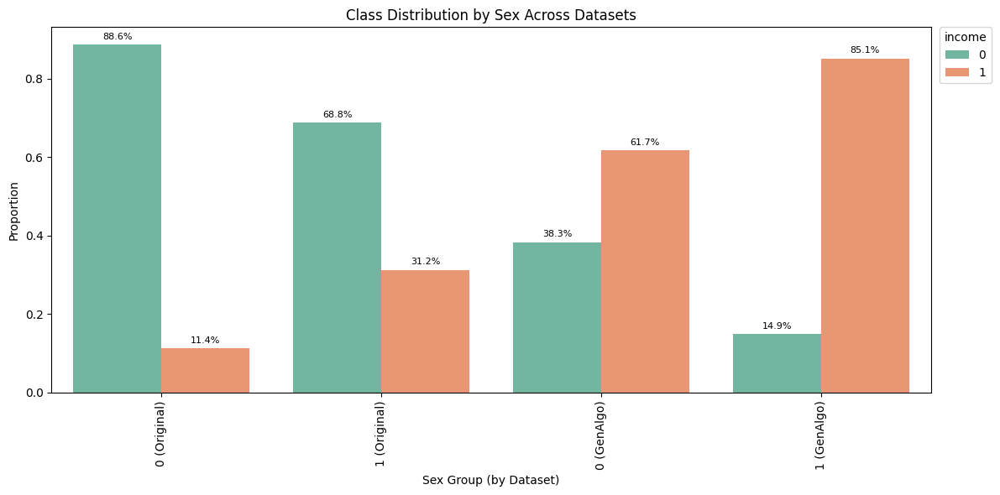

In [ ]:
plot_biased_data_comparison(
    datasets=[
        (data, "Original"),
        (df_unfair, "GenAlgo")
    ],
    sensitive_feature=sensitive_feature,
    label_col=target
)

### Compare all modifications for Adult

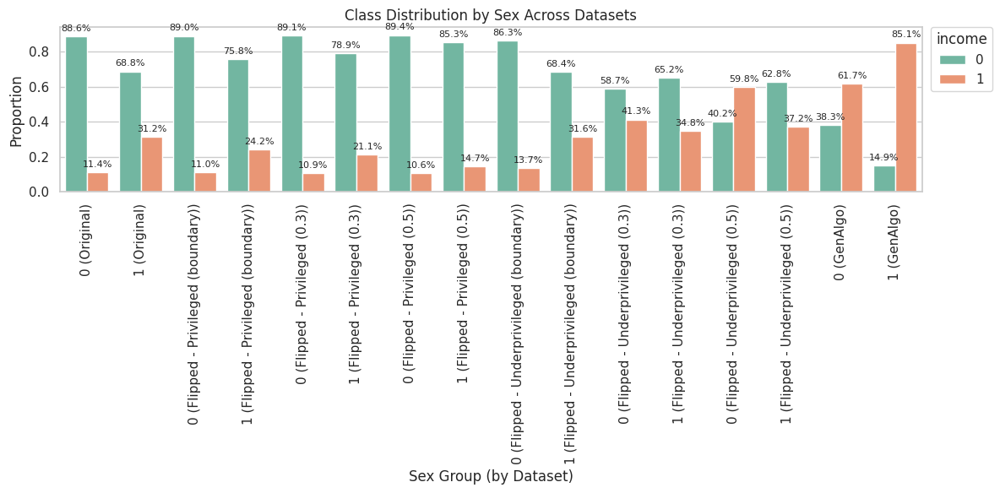

In [ ]:
plot_biased_data_comparison(
    datasets=[
        (data, "Original"),
        (X_flipped, "Flipped - Privileged (boundary)"),
        (bias_adjust_flip_1, "Flipped - Privileged (0.3)"),
        (bias_adjust_flip_2, "Flipped - Privileged (0.5)"),
        (X_flipped_UP, "Flipped - Underprivileged (boundary)"),
        (bias_adjust_flip_3, "Flipped - Underprivileged (0.3)"),
        (bias_adjust_flip_4, "Flipped - Underprivileged (0.5)"),
        (df_unfair, "GenAlgo")
    ],
    sensitive_feature=sensitive_feature,
    label_col=target
)

In [ ]:
# Create a list of the dataframes
dfs = {
    "Original": data,
    "Biased (Flip 0.3)": biased_df_flip,
    "Biased (Flip 0.5)": biased_df_flip_2,
    "Biased (Flip 0.3 Unprivileged)": biased_df_flip_3,
}

# Initialize an empty list to store the results
income_distribution_data = []

# Iterate through each dataframe
for name, df in dfs.items():
    # Group by 'sex' and 'income', then count occurrences
    grouped = df.groupby('sex')[target].value_counts(normalize=True).rename('percentage').reset_index()
    grouped['Source'] = name
    income_distribution_data.append(grouped)

# Concatenate the results into a single dataframe
income_distribution_df = pd.concat(income_distribution_data, ignore_index=True)

# Pivot the table for better readability
income_distribution_pivot = income_distribution_df.pivot_table(
    index=['Source', 'sex'],
    columns=target,
    values='percentage'
).reset_index()

# Rename columns for clarity (0: income <=50K, 1: income >50K)
income_distribution_pivot.rename(columns={0: 'Income <=50K (%)', 1: 'Income >50K (%)', 'sex': 'Sex'}, inplace=True)

# Map sex values (0: Female, 1: Male)
income_distribution_pivot['Sex'] = income_distribution_pivot['Sex'].map({0: 'Female', 1: 'Male'})

# Display the table
income_distribution_pivot

income,Source,Sex,Income <=50K (%),Income >50K (%)
0,Biased (Flip 0.3 Unprivileged),Female,0.586866,0.413134
1,Biased (Flip 0.3 Unprivileged),Male,0.651587,0.348413
2,Biased (Flip 0.3),Female,0.890167,0.109833
3,Biased (Flip 0.3),Male,0.789137,0.210863
4,Biased (Flip 0.5),Female,0.893909,0.106091
5,Biased (Flip 0.5),Male,0.852852,0.147148
6,Original,Female,0.886424,0.113576
7,Original,Male,0.687523,0.312477


### Final Runs for all biased_df (individual model selection)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:46:09] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

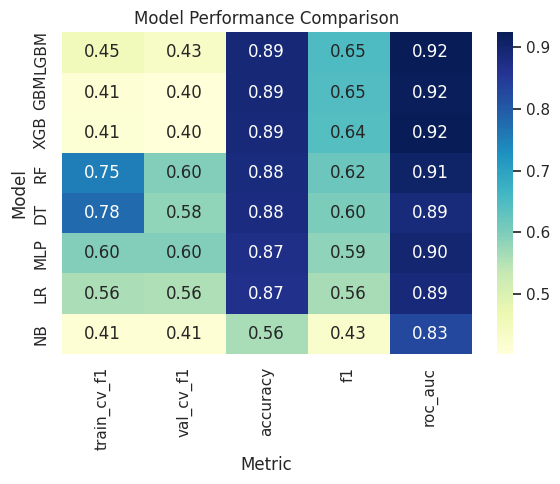

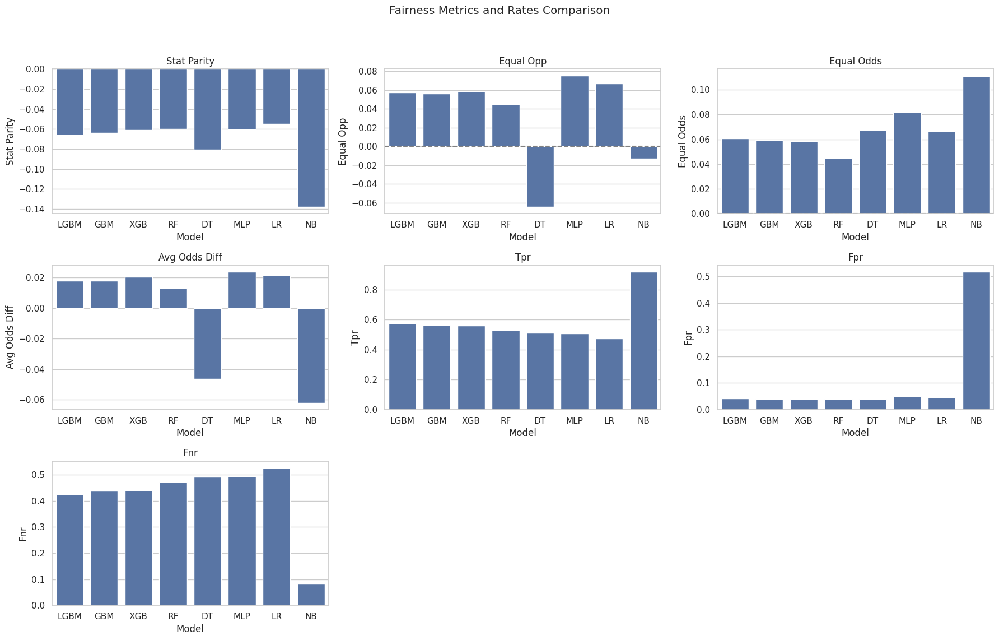

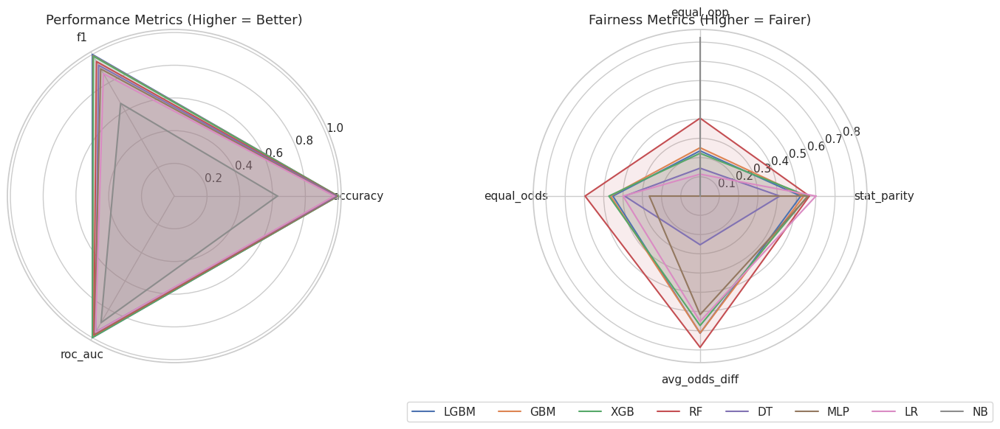

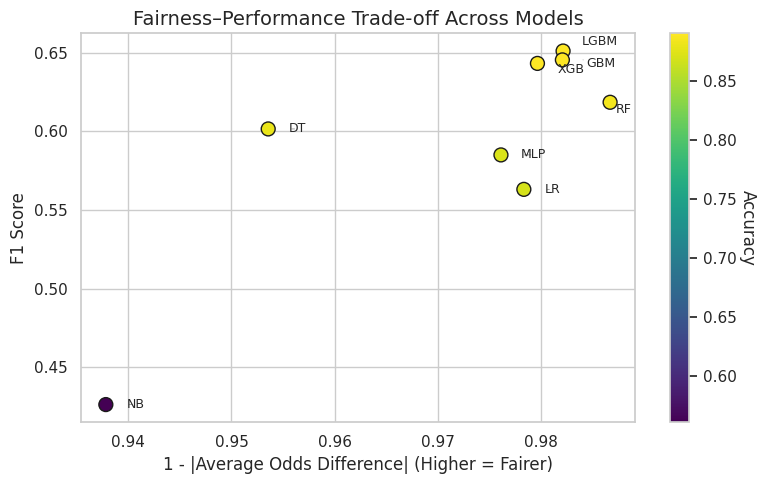

Balanced Best Model: LGBM
Model parameters:
{'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': 20, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 57, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}
[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from sc

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 758
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 747
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 733
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


epoch 0; iter: 0; batch classifier loss: 0.689114; batch adversarial loss: 0.718469
epoch 0; iter: 200; batch classifier loss: 0.450985; batch adversarial loss: 0.663929
epoch 0; iter: 400; batch classifier loss: 0.358254; batch adversarial loss: 0.627765
epoch 0; iter: 600; batch classifier loss: 0.344752; batch adversarial loss: 0.664614
epoch 0; iter: 800; batch classifier loss: 0.417932; batch adversarial loss: 0.605922
epoch 0; iter: 1000; batch classifier loss: 0.246307; batch adversarial loss: 0.644650
epoch 1; iter: 0; batch classifier loss: 0.455076; batch adversarial loss: 0.571050
epoch 1; iter: 200; batch classifier loss: 0.451332; batch adversarial loss: 0.667434
epoch 1; iter: 400; batch classifier loss: 0.265778; batch adversarial loss: 0.658644
epoch 1; iter: 600; batch classifier loss: 0.335882; batch adversarial loss: 0.608254
epoch 1; iter: 800; batch classifier loss: 0.232461; batch adversarial loss: 0.606339
epoch 1; iter: 1000; batch classifier loss: 0.390867; bat

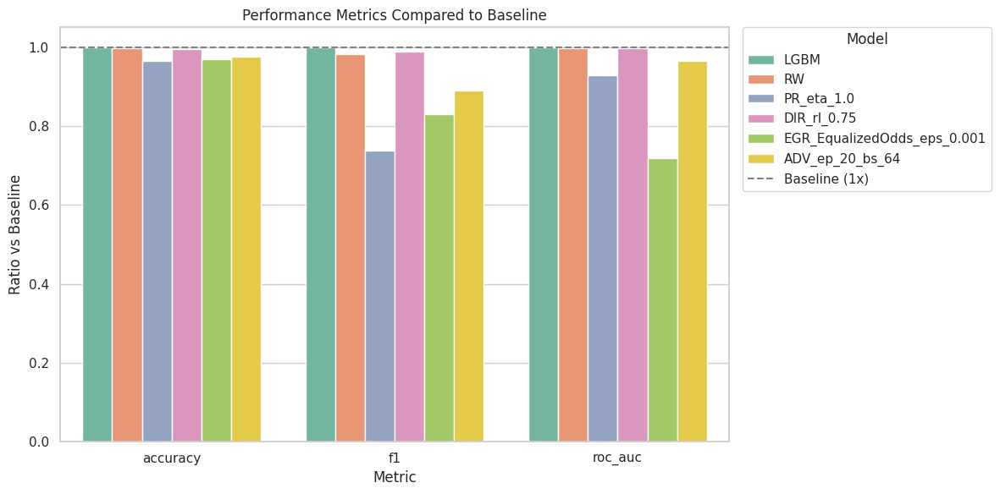

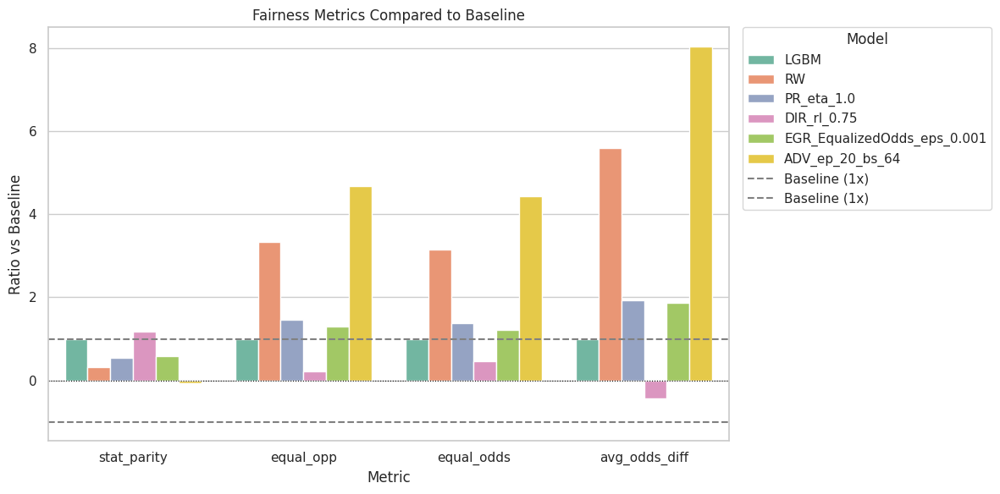

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav


[LightGBM] [Info] Number of positive: 6437, number of negative: 29740
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 759
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.177931 -> initscore=-1.530430
[LightGBM] [Info] Start training from score -1.530430


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


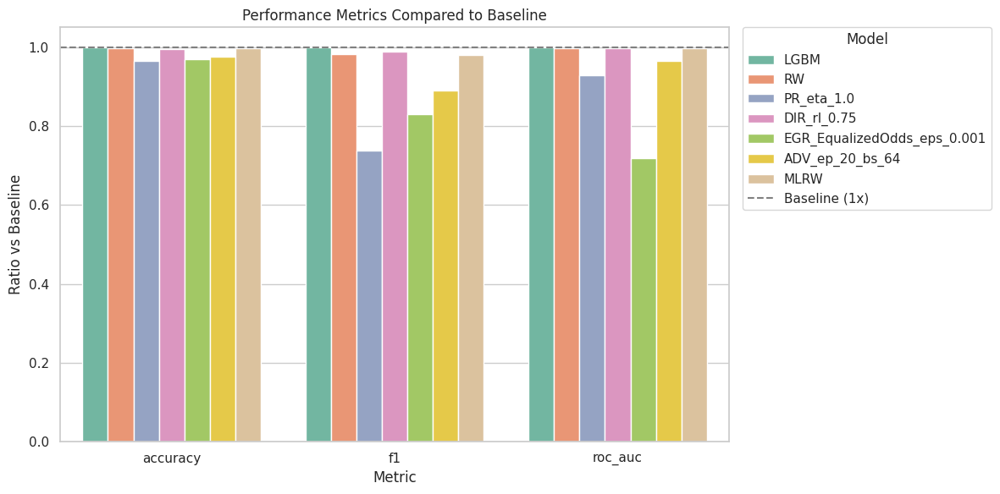

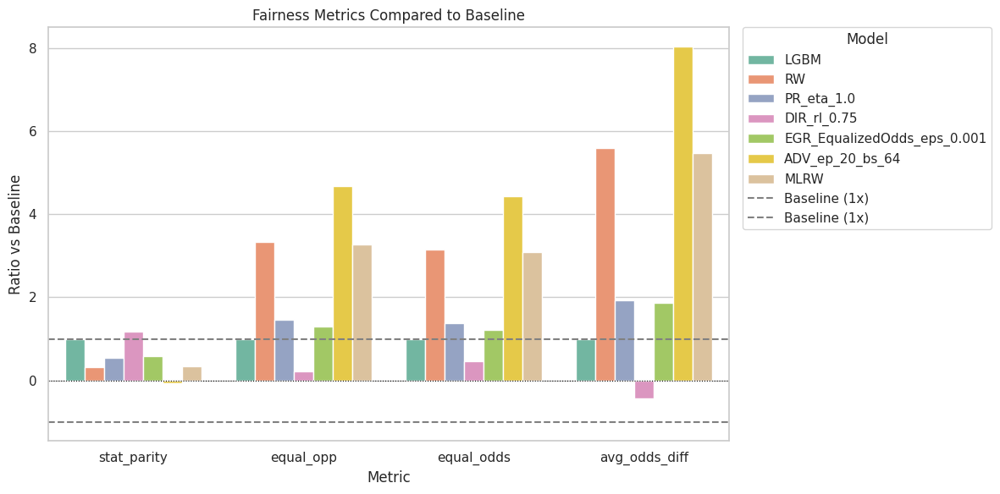

In [ ]:
combined_results_flip_1, combined_final_flip_1 = run_fair_ml_pipeline(
    data=bias_adjust_flip_1,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_flip_1.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
LGBM,0.452677,0.434180,0.890547,0.651166,0.924564,-0.065679,0.057586,0.060852,0.017841,0.575561,0.041285,0.424439,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.888778,0.640200,0.920953,-0.021169,0.192281,0.192281,0.099911,0.556246,0.039268,0.443754,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_1.0,nan,nan,0.859038,0.480652,0.858275,-0.035953,0.083842,0.083842,0.034295,0.366687,0.034427,0.633313,,1.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.75,nan,nan,0.886125,0.643599,0.921916,-0.076595,0.012429,0.028205,-0.007888,0.577999,0.047203,0.422001,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",0.750000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.001,nan,nan,0.863129,0.540801,0.664602,-0.037993,0.074279,0.074279,0.033394,0.366687,0.034427,0.633313,"ExponentiatedGradient(constraints=, eps=0.001, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0008802254211770699))",0.001000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_20_bs_64,nan,nan,0.868214,0.579393,0.892180,0.003929,0.269199,0.269199,0.143535,0.366687,0.034427,0.633313,,20,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.888668,0.638680,0.921186,-0.022170,0.188566,0.188566,0.097598,0.553139,0.038731,0.446861,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",nan,-0.044804,0.027857,0.027857,0.009440,0.553139,0.038731,0.446861


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_flip_1.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Flip1.csv')

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [18:52:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 13359, number of negative: 22818
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 753
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.369268 -> initscore=-0.535359
[LightGBM] [Info] Start training from score -0.535359


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

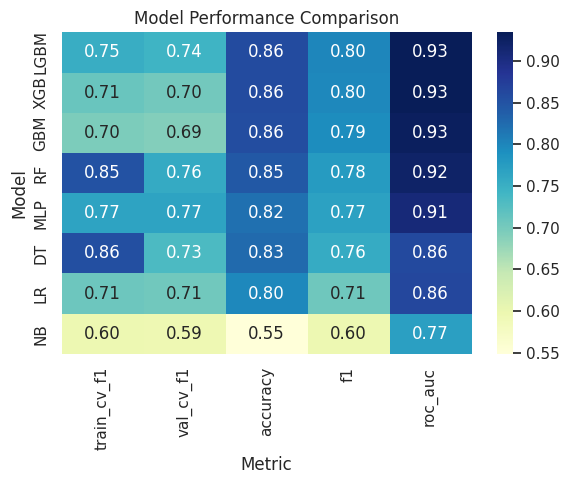

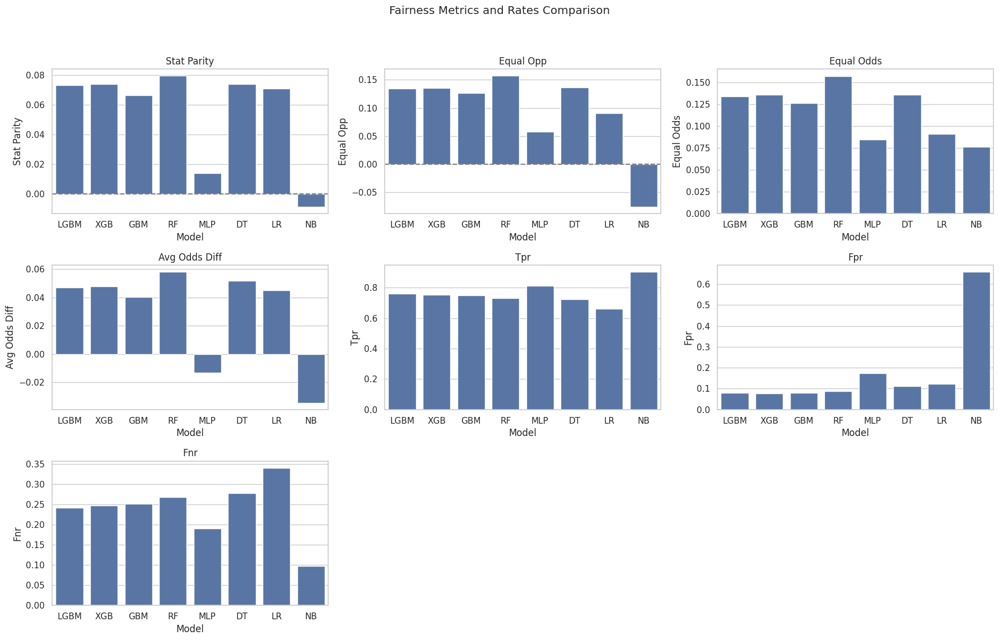

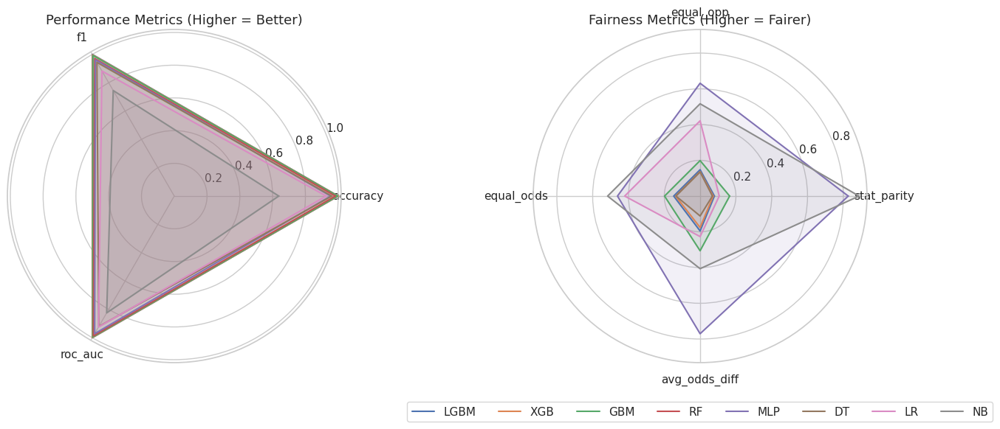

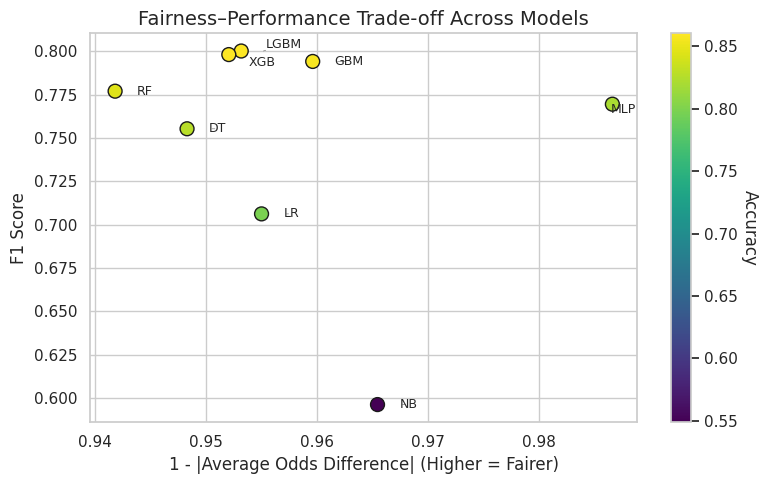

Balanced Best Model: MLP
Model parameters:
{'batch_size': 64, 'epochs': 20, 'hidden_dim': 32, 'input_dim': 93, 'lr': 0.01, 'random_state': 42}
epoch 0; iter: 0; batch classifier loss: 0.676603; batch adversarial loss: 0.756874
epoch 0; iter: 200; batch classifier loss: 0.408904; batch adversarial loss: 0.680412
epoch 0; iter: 400; batch classifier loss: 0.525024; batch adversarial loss: 0.653050
epoch 0; iter: 600; batch classifier loss: 0.355461; batch adversarial loss: 0.643360
epoch 0; iter: 800; batch classifier loss: 0.559895; batch adversarial loss: 0.621756
epoch 0; iter: 1000; batch classifier loss: 0.405369; batch adversarial loss: 0.651295
epoch 1; iter: 0; batch classifier loss: 0.377439; batch adversarial loss: 0.619863
epoch 1; iter: 200; batch classifier loss: 0.643864; batch adversarial loss: 0.581188
epoch 1; iter: 400; batch classifier loss: 0.449925; batch adversarial loss: 0.588727
epoch 1; iter: 600; batch classifier loss: 0.437947; batch adversarial loss: 0.640303


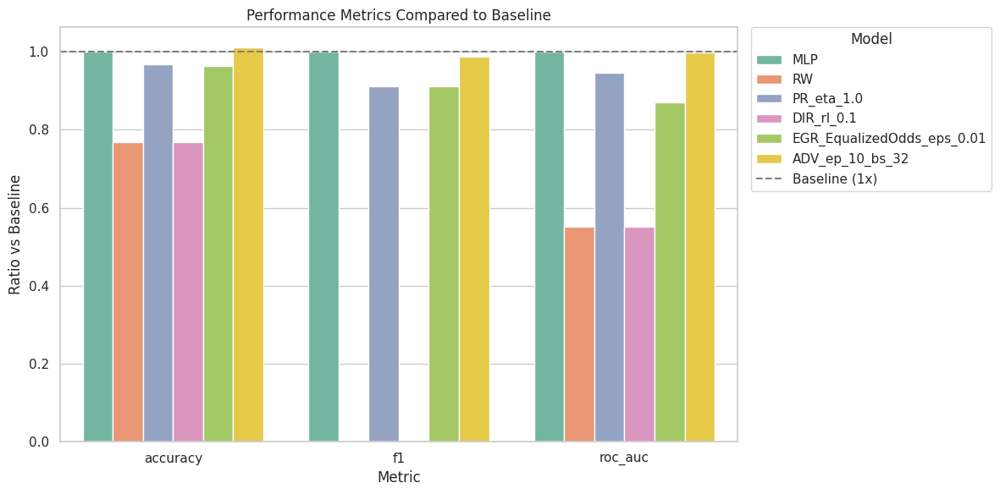

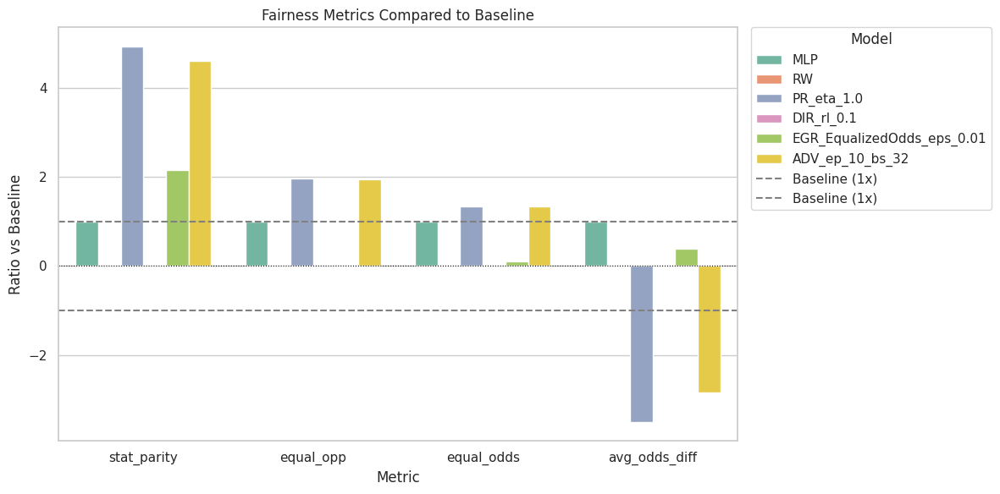

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav


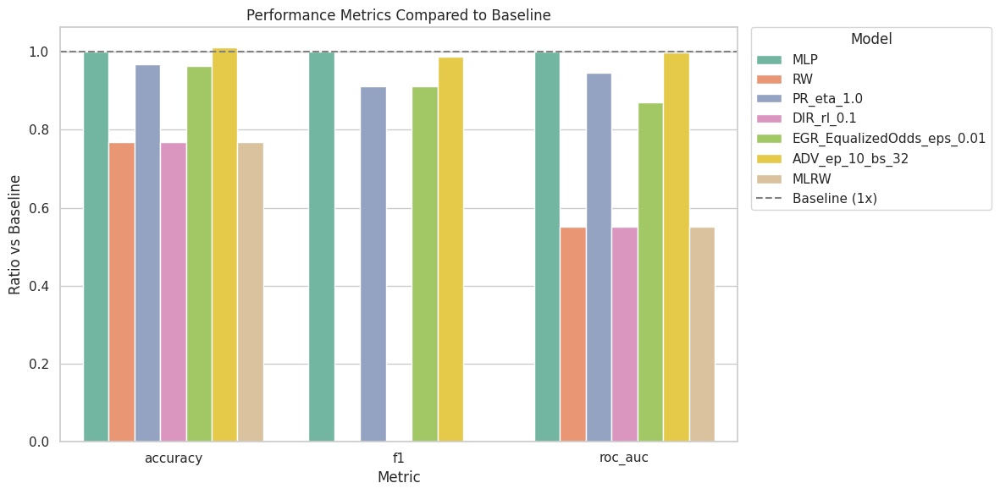

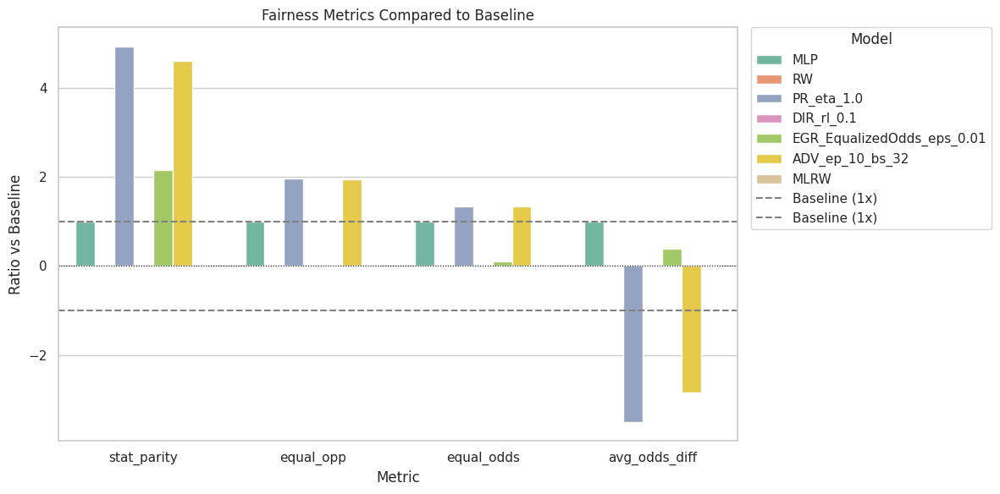

In [ ]:
combined_results_flip_3, combined_final_flip_3 = run_fair_ml_pipeline(
    data=bias_adjust_flip_3,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_flip_3.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
MLP,0.766732,0.766732,0.821006,0.769540,0.907764,0.013742,0.057957,0.084688,-0.013366,0.810000,0.172738,0.190000,"PyTorchMLPWrapper(hidden_dim=32, input_dim=93, lr=0.01)",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.630735,0.000000,0.499912,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,"PyTorchMLPWrapper(hidden_dim=32, input_dim=93, lr=0.01)",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_1.0,nan,nan,0.793919,0.701282,0.859213,0.067872,0.113672,0.113672,0.046886,0.655090,0.124803,0.344910,,1.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.1,nan,nan,0.630735,0.000000,0.499912,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,"PyTorchMLPWrapper(hidden_dim=32, input_dim=93, lr=0.01)",0.100000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.01,nan,nan,0.791155,0.701533,0.790373,0.029558,-0.001196,0.009054,-0.005125,0.655090,0.124803,0.344910,"ExponentiatedGradient(constraints=, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0010484939729494425))",0.010000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_32,nan,nan,0.830514,0.759152,0.904887,0.063184,0.113072,0.113072,0.038130,0.655090,0.124803,0.344910,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.630735,0.000000,0.499912,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,"PyTorchMLPWrapper(hidden_dim=32, input_dim=93, lr=0.01)",nan,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_flip_3.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Flip3.csv')

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [19:32:31] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 752
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

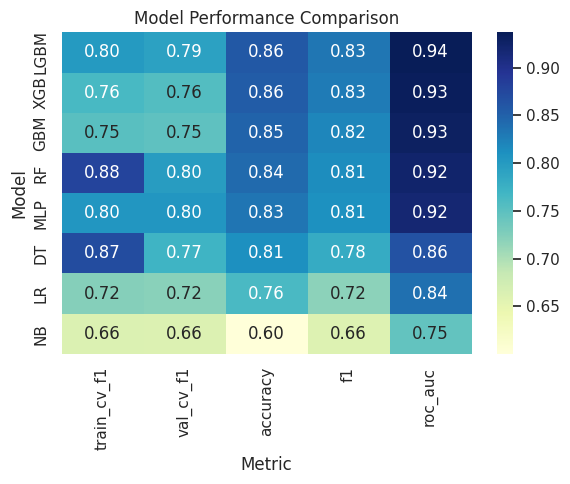

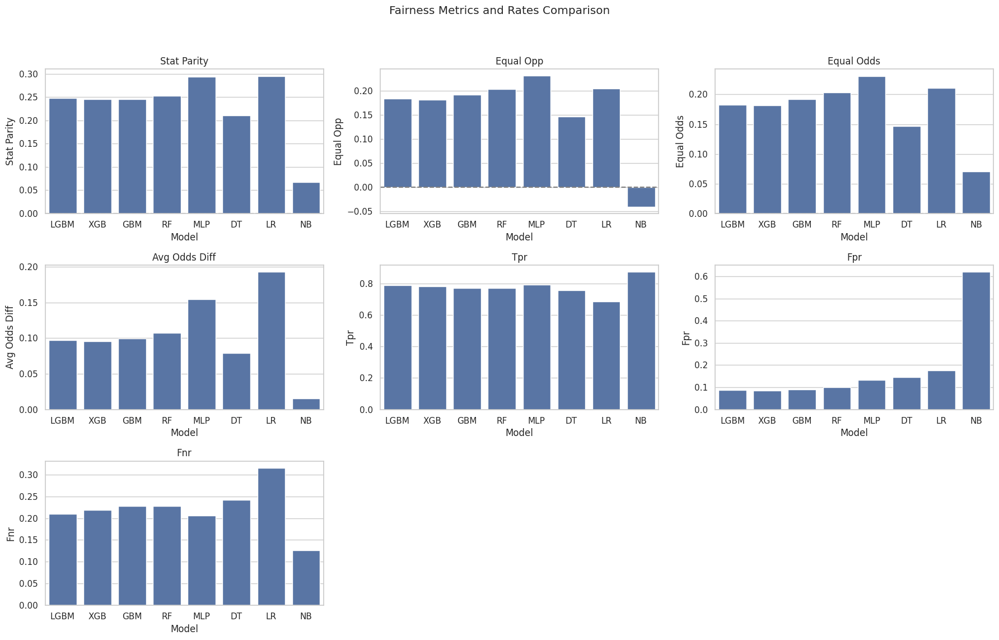

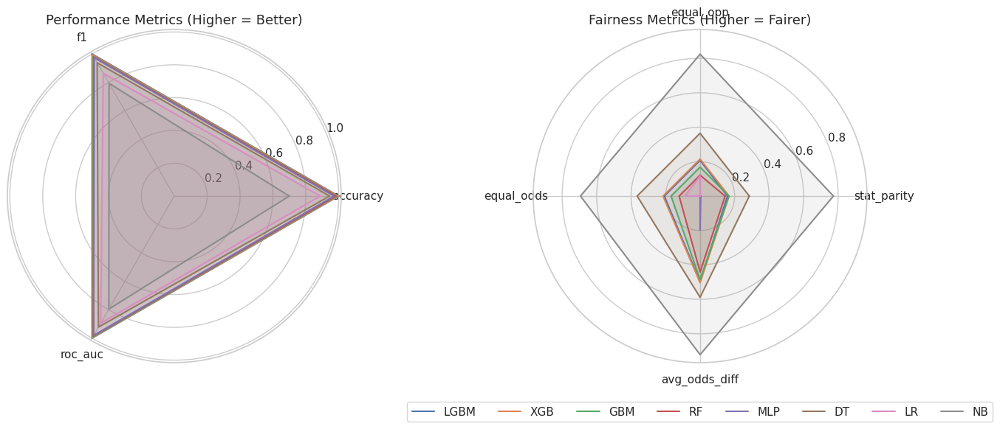

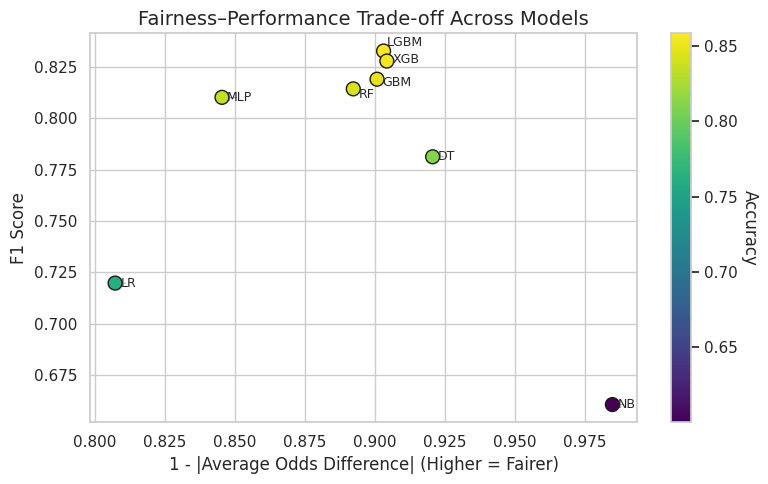

Balanced Best Model: LGBM
Model parameters:
{'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': 20, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 57, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}
[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 752
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from s

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 754
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 759
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 762
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 736
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


epoch 0; iter: 0; batch classifier loss: 0.694451; batch adversarial loss: 0.710789
epoch 0; iter: 200; batch classifier loss: 0.458319; batch adversarial loss: 0.650556
epoch 0; iter: 400; batch classifier loss: 0.485856; batch adversarial loss: 0.644301
epoch 0; iter: 600; batch classifier loss: 0.487591; batch adversarial loss: 0.648389
epoch 0; iter: 800; batch classifier loss: 0.593384; batch adversarial loss: 0.607866
epoch 0; iter: 1000; batch classifier loss: 0.514772; batch adversarial loss: 0.647609
epoch 1; iter: 0; batch classifier loss: 0.384580; batch adversarial loss: 0.542871
epoch 1; iter: 200; batch classifier loss: 0.450803; batch adversarial loss: 0.538862
epoch 1; iter: 400; batch classifier loss: 0.519449; batch adversarial loss: 0.587930
epoch 1; iter: 600; batch classifier loss: 0.472155; batch adversarial loss: 0.732291
epoch 1; iter: 800; batch classifier loss: 0.396396; batch adversarial loss: 0.651271
epoch 1; iter: 1000; batch classifier loss: 0.382048; bat

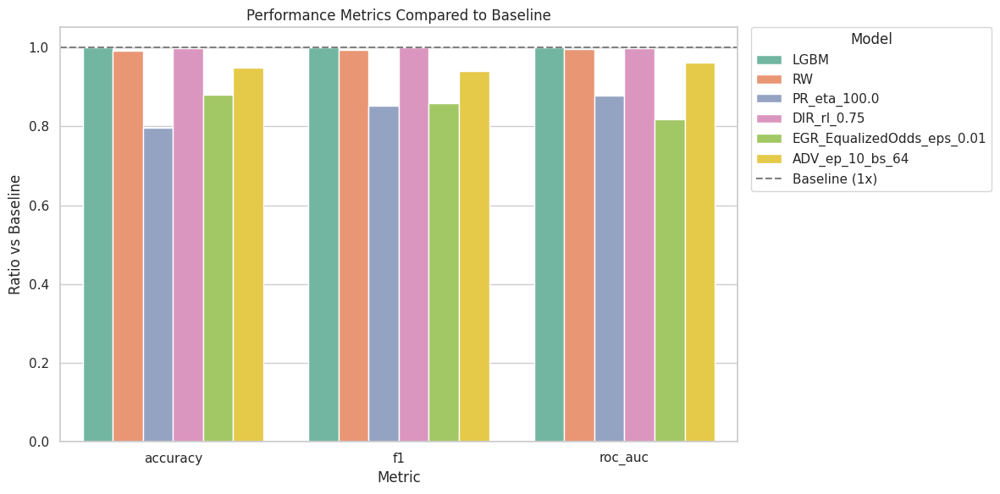

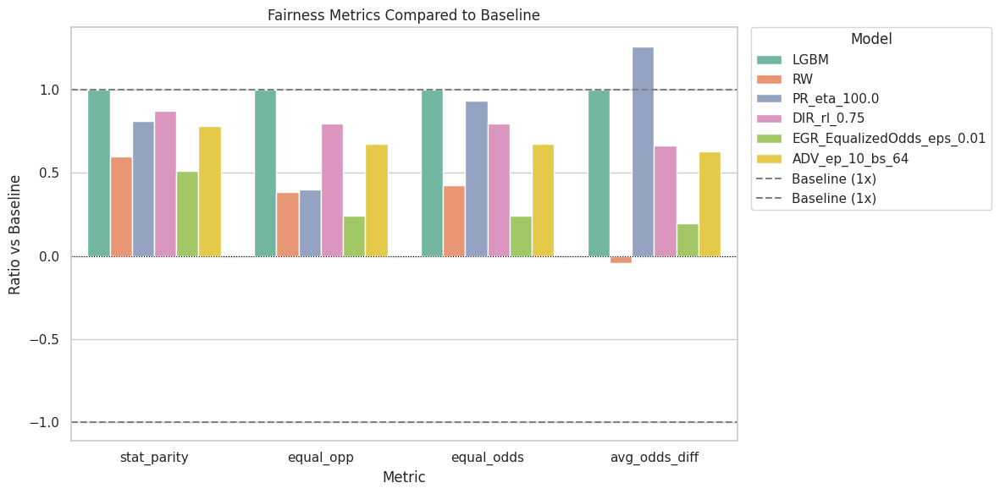

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav


[LightGBM] [Info] Number of positive: 16115, number of negative: 20062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 752
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 84
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.445449 -> initscore=-0.219077
[LightGBM] [Info] Start training from score -0.219077


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


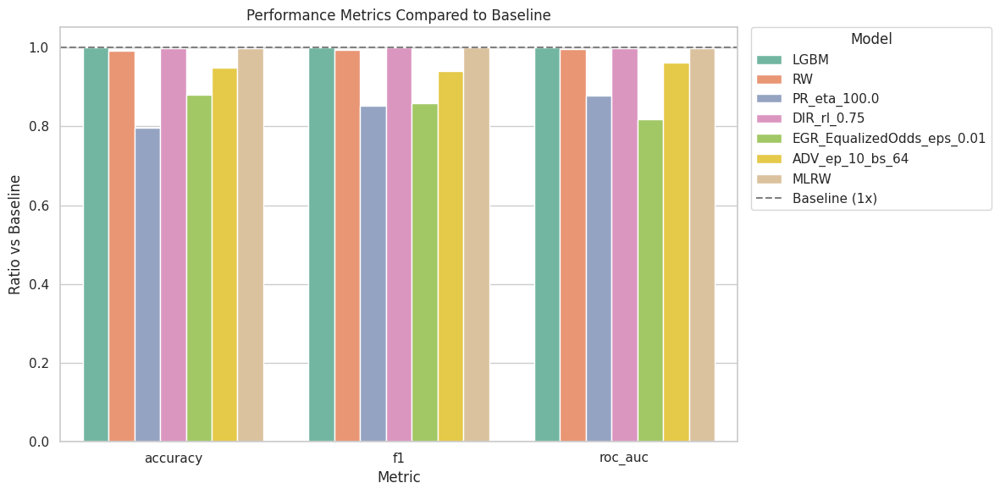

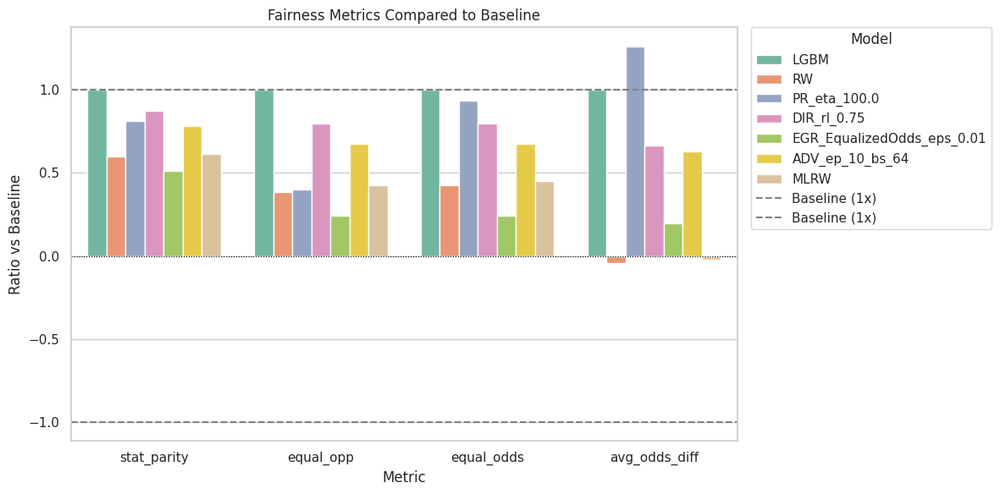

In [ ]:
combined_results_flip_4, combined_final_flip_4 = run_fair_ml_pipeline(
    data=bias_adjust_flip_4,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_flip_4.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
LGBM,0.800818,0.792861,0.858485,0.832712,0.936861,0.248433,0.182875,0.182875,0.096795,0.790802,0.087113,0.209198,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.852073,0.828285,0.933264,0.149130,0.069943,0.078181,-0.004119,0.800943,0.106858,0.199057,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_100.0,nan,nan,0.683250,0.710108,0.821917,0.202466,0.073394,0.171142,0.122268,0.870936,0.467504,0.129064,,100.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.75,nan,nan,0.857380,0.833376,0.934980,0.217064,0.145415,0.145415,0.064295,0.800695,0.097089,0.199305,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",0.750000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.01,nan,nan,0.756219,0.715227,0.766258,0.127225,0.044454,0.044454,0.019122,0.870936,0.467504,0.129064,"ExponentiatedGradient(constraints=, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0011135402847683132))",0.010000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_64,nan,nan,0.815257,0.782902,0.900435,0.194507,0.123197,0.123197,0.061046,0.870936,0.467504,0.129064,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.855943,0.832368,0.934072,0.152734,0.077628,0.082166,-0.002269,0.802929,0.101475,0.197071,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=20, random_state=57))])",nan,-0.013419,0.039027,0.039027,0.005613,0.802929,0.101475,0.197071


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_flip_4.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Flip4.csv', index=False)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [10:02:24] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 361
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

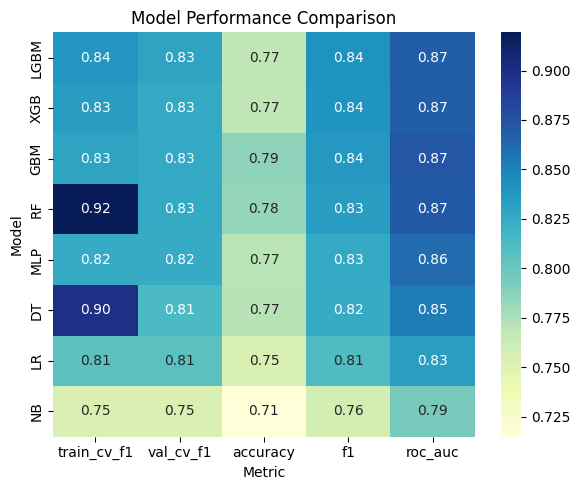

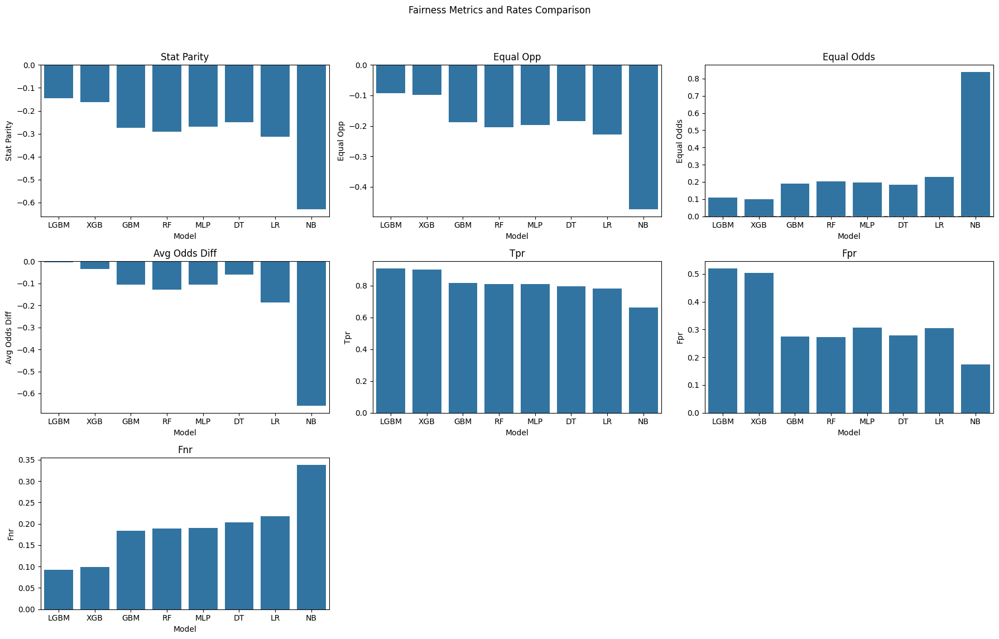

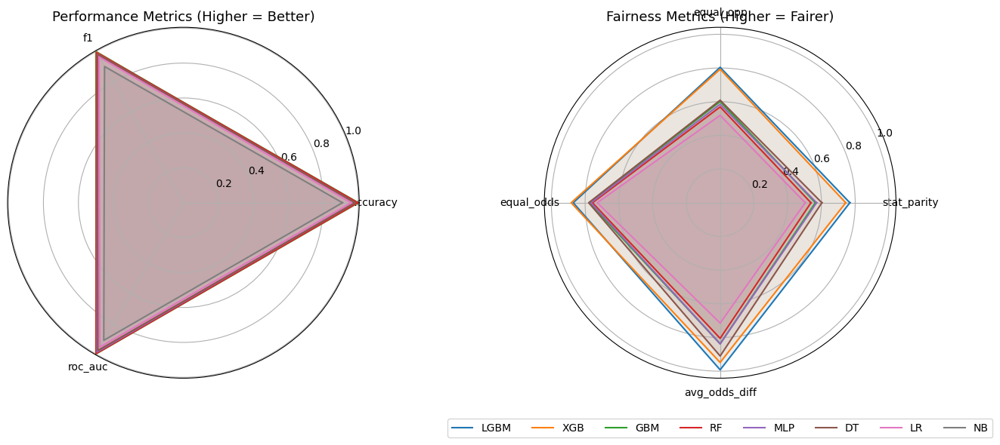

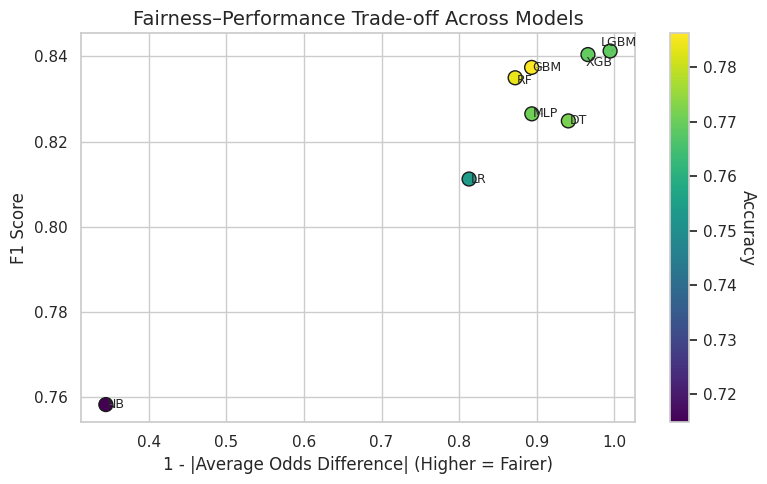

Balanced Best Model: LGBM
Model parameters:
{'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.01, 'max_depth': 10, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 57, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}
[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 361
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from s

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 356
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 360
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 350
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 297
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 276
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


epoch 0; iter: 0; batch classifier loss: 0.686840; batch adversarial loss: 0.644354
epoch 0; iter: 200; batch classifier loss: 0.338007; batch adversarial loss: 0.652858
epoch 0; iter: 400; batch classifier loss: 0.486983; batch adversarial loss: 0.605148
epoch 0; iter: 600; batch classifier loss: 0.412667; batch adversarial loss: 0.538421
epoch 0; iter: 800; batch classifier loss: 0.411255; batch adversarial loss: 0.566663
epoch 0; iter: 1000; batch classifier loss: 0.404538; batch adversarial loss: 0.539377
epoch 1; iter: 0; batch classifier loss: 0.369002; batch adversarial loss: 0.676796
epoch 1; iter: 200; batch classifier loss: 0.456905; batch adversarial loss: 0.479163
epoch 1; iter: 400; batch classifier loss: 0.344419; batch adversarial loss: 0.576663
epoch 1; iter: 600; batch classifier loss: 0.385547; batch adversarial loss: 0.612403
epoch 1; iter: 800; batch classifier loss: 0.432681; batch adversarial loss: 0.527512
epoch 1; iter: 1000; batch classifier loss: 0.529947; bat

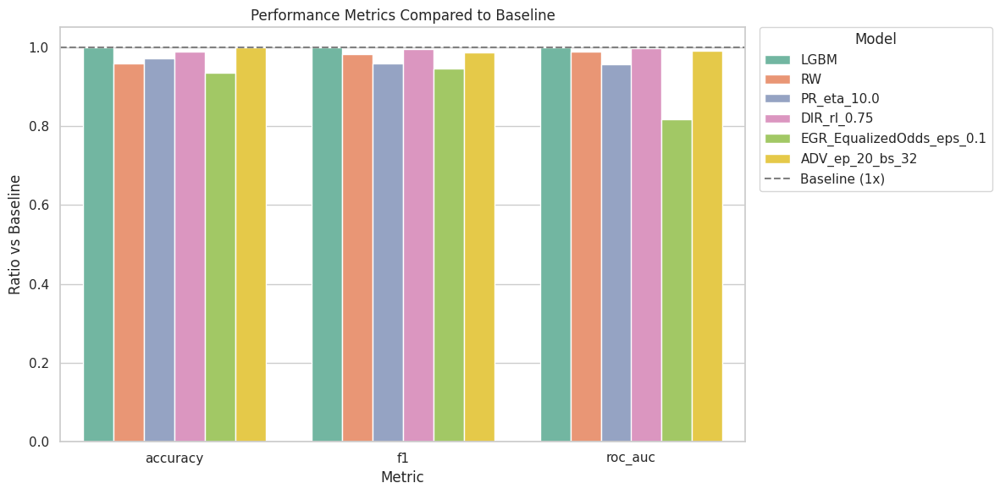

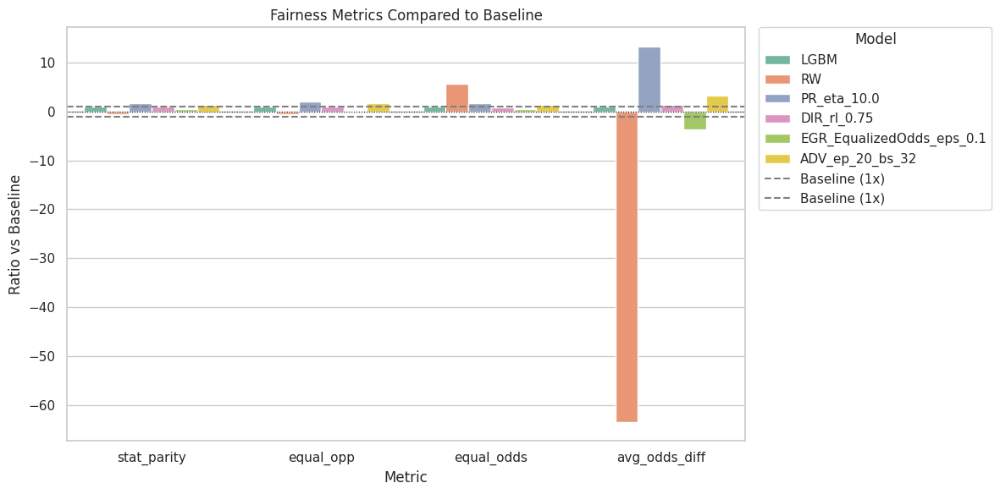

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav


[LightGBM] [Info] Number of positive: 24421, number of negative: 11756
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 361
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.675042 -> initscore=0.731080
[LightGBM] [Info] Start training from score 0.731080


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


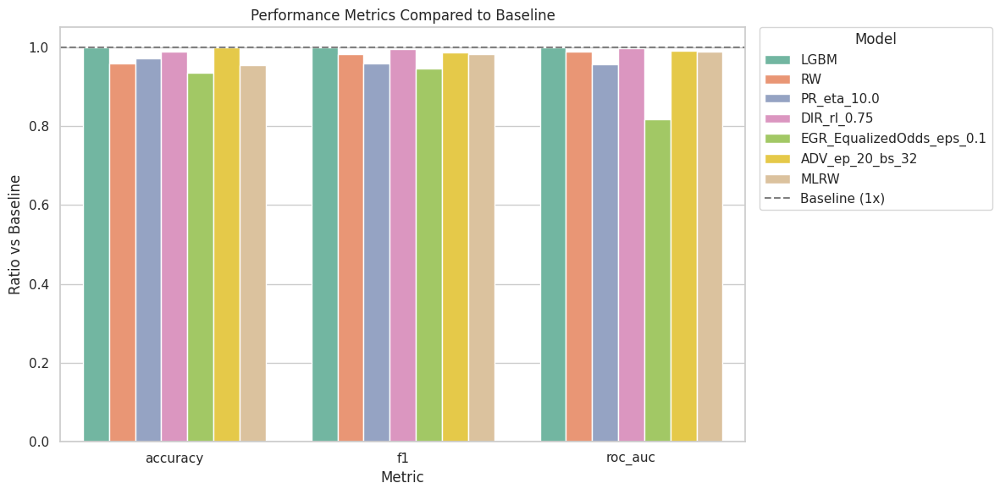

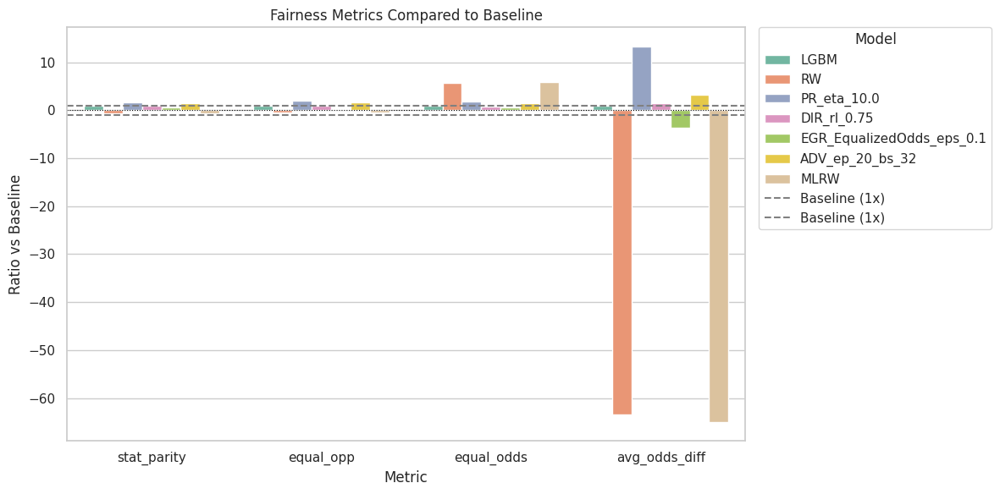

In [ ]:
combined_results_genalgo, combined_final_genalgo = run_fair_ml_pipeline(
    data=df_unfair,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_genalgo.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
LGBM,0.839083,0.829260,0.768823,0.841282,0.867475,-0.145741,-0.092670,0.108582,-0.005283,0.907810,0.519575,0.092190,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(learning_rate=0.01, max_depth=10, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.737756,0.826785,0.857405,0.086492,0.047784,0.622687,0.335235,0.927121,0.655665,0.072879,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(learning_rate=0.01, max_depth=10, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_10.0,nan,nan,0.746600,0.806091,0.829641,-0.243212,-0.190054,0.190054,-0.070482,0.780216,0.323239,0.219784,,10.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.75,nan,nan,0.760973,0.838343,0.865111,-0.136102,-0.088634,0.088634,-0.007341,0.918113,0.565498,0.081887,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(learning_rate=0.01, max_depth=10, random_state=57))])",0.750000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.1,nan,nan,0.720066,0.795675,0.709479,-0.080400,-0.014334,0.053847,0.019756,0.791189,0.333787,0.208811,"ExponentiatedGradient(constraints=, eps=0.1, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.001141594222615234))",0.100000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_20_bs_32,nan,nan,0.769265,0.830229,0.859010,-0.201684,-0.148659,0.148659,-0.017324,0.791189,0.333787,0.208811,,20,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.734771,0.825920,0.857198,0.095007,0.051775,0.634504,0.343139,0.932034,0.675060,0.067966,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(learning_rate=0.01, max_depth=10, random_state=57))])",nan,-0.026176,-0.009195,0.031972,0.011389,0.932034,0.675060,0.067966


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_genalgo.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_GenAlgo.csv')

## Run the Boundary Flip datasets

In [ ]:
X_train_flipped, X_test_flipped, y_train_flipped, y_test_flipped = train_test_split(X_flipped, y_flipped, test_size=0.2, random_state=random_seed, stratify=y_flipped)

In [ ]:
boundary_data = pd.concat([X_train_flipped, y_train_flipped], axis=1)

/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:10:59] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Number of positive: 7199, number of negative: 28978
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 753
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.198994 -> initscore=-1.392595
[LightGBM] [Info] Start training from score -1.392595


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

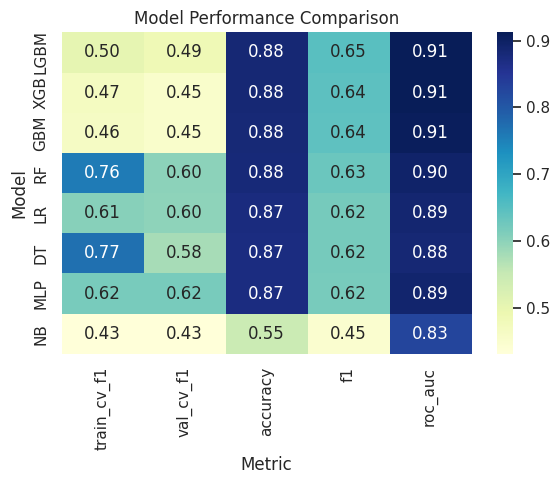

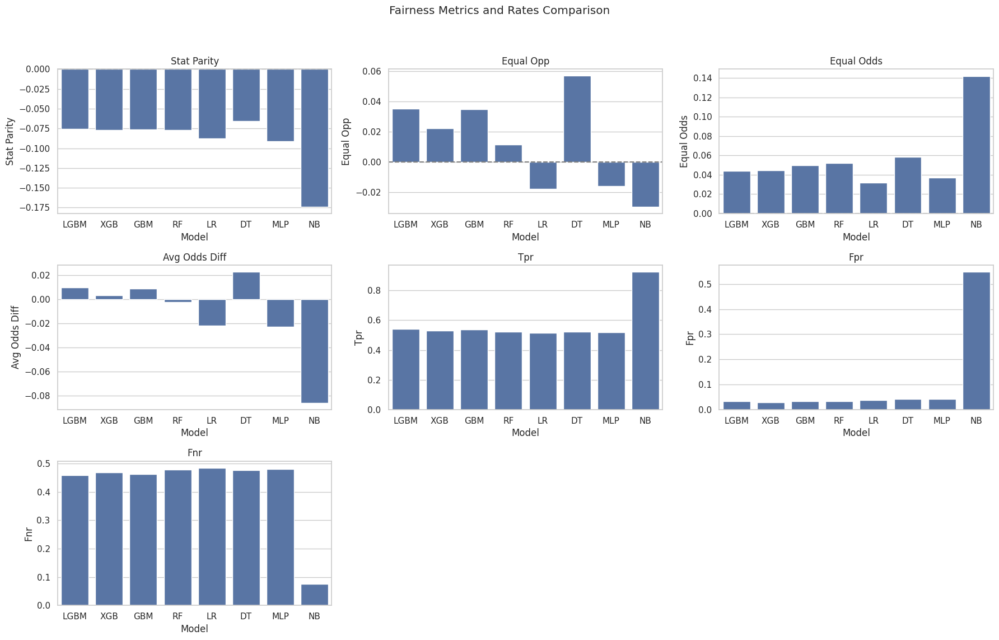

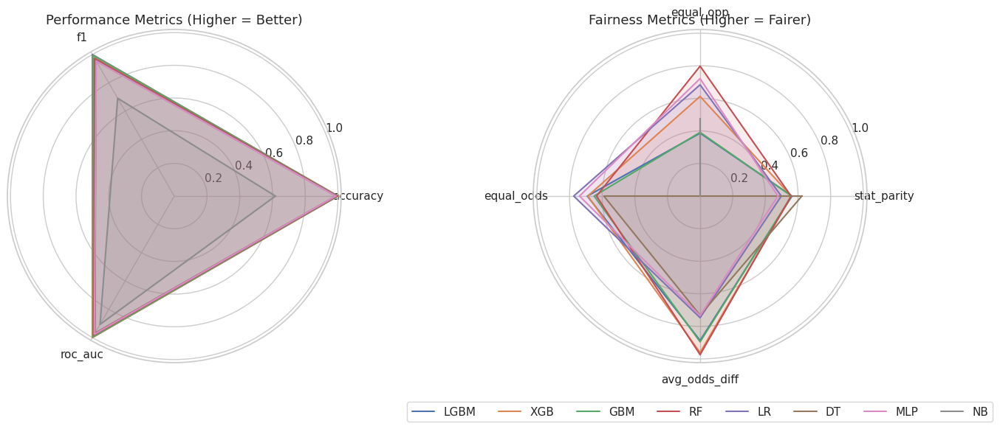

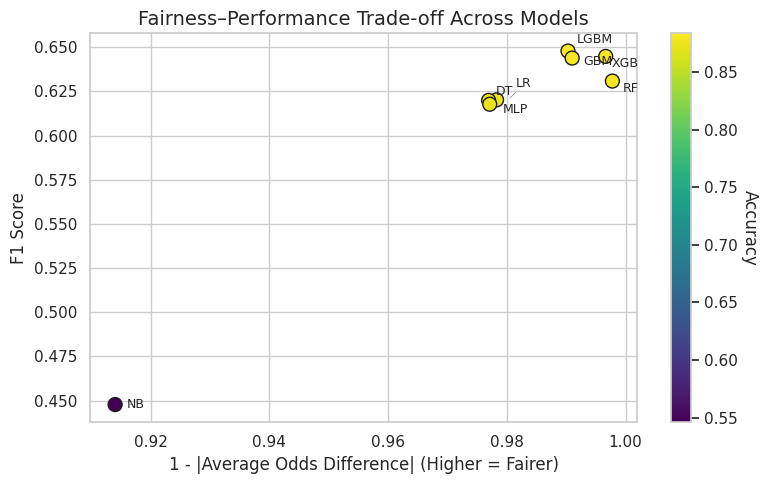

Balanced Best Model: XGB
Model parameters:
{'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': 'logloss', 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 57, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None, 'use_label_encoder': False}


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:21:28] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:31:27] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11

epoch 0; iter: 0; batch classifier loss: 0.703284; batch adversarial loss: 0.742631
epoch 0; iter: 200; batch classifier loss: 0.409514; batch adversarial loss: 0.683539
epoch 0; iter: 400; batch classifier loss: 0.453565; batch adversarial loss: 0.635420
epoch 0; iter: 600; batch classifier loss: 0.357758; batch adversarial loss: 0.531426
epoch 0; iter: 800; batch classifier loss: 0.155692; batch adversarial loss: 0.621320
epoch 0; iter: 1000; batch classifier loss: 0.525905; batch adversarial loss: 0.543865
epoch 1; iter: 0; batch classifier loss: 0.208581; batch adversarial loss: 0.762266
epoch 1; iter: 200; batch classifier loss: 0.348925; batch adversarial loss: 0.577189
epoch 1; iter: 400; batch classifier loss: 0.202599; batch adversarial loss: 0.629934
epoch 1; iter: 600; batch classifier loss: 0.410165; batch adversarial loss: 0.700787
epoch 1; iter: 800; batch classifier loss: 0.311291; batch adversarial loss: 0.672914
epoch 1; iter: 1000; batch classifier loss: 0.382542; bat

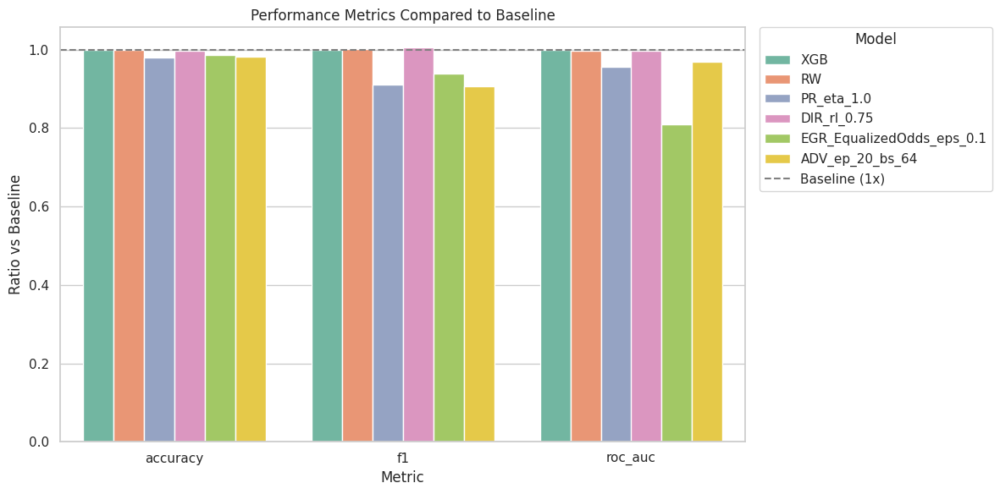

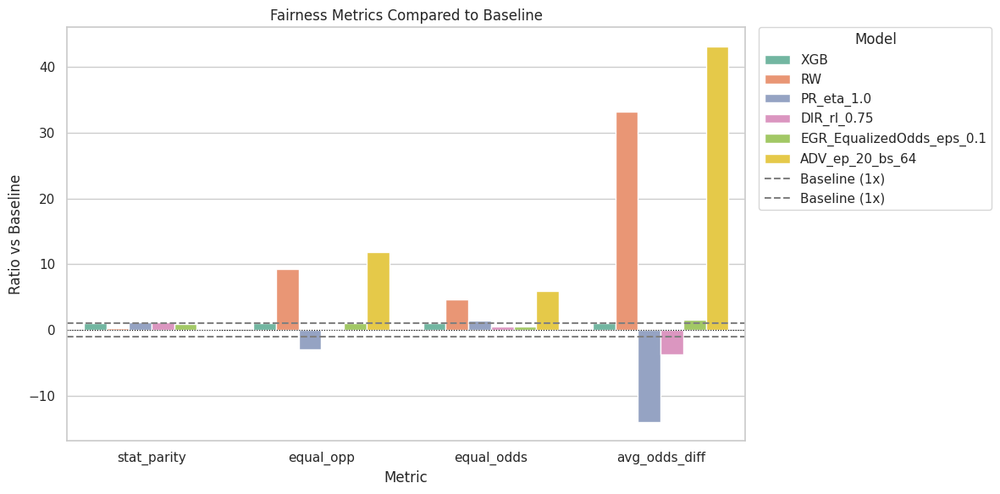

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:41:24] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


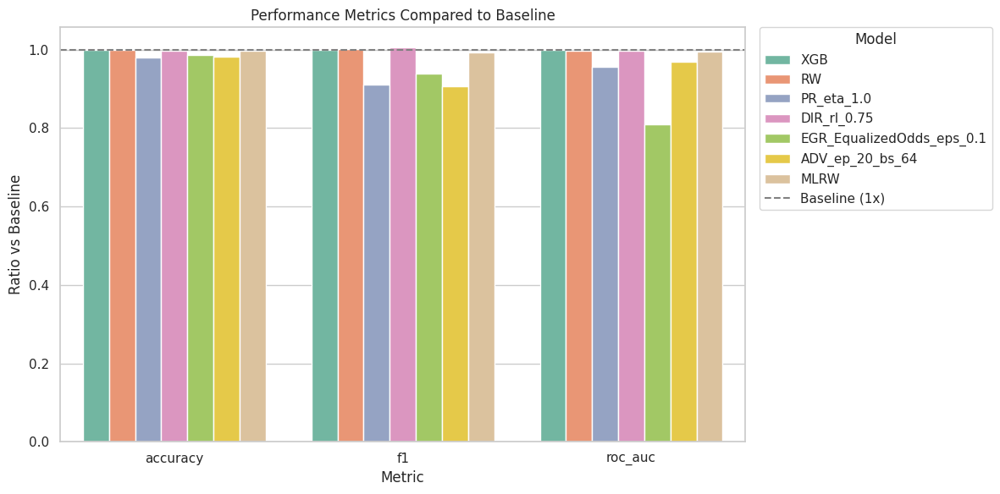

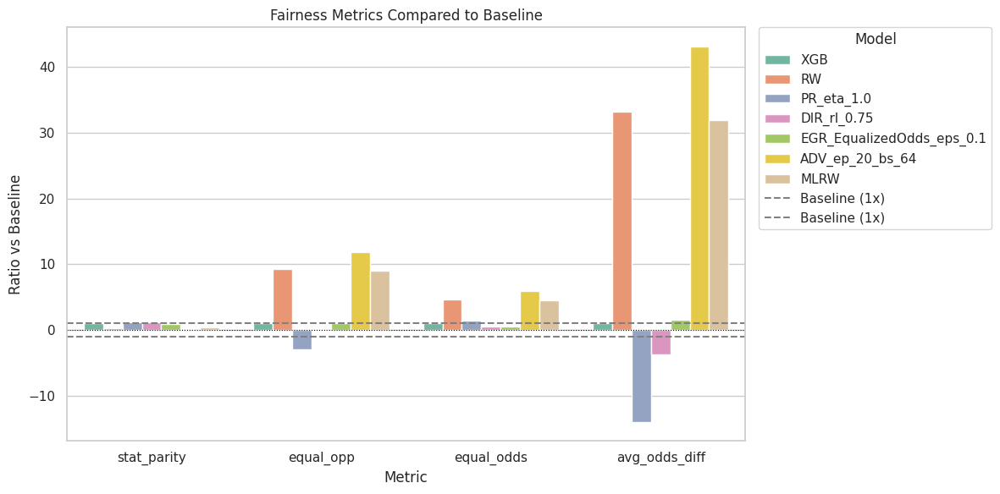

In [ ]:
boundary_results_dict, boundary_result_df = train_evaluate_plot(models, param_grid, X_train_flipped, y_train_flipped, X_test_flipped, y_test_flipped, target, sensitive_feature)

# --- Step 4: Plot Pareto Front ---
pareto_plot(boundary_result_df)

# --- Step 5: Select Best Model by Composite Score ---
best_name_boundary = max(boundary_results_dict, key=lambda x: composite_score(boundary_results_dict[x]))
best_model_boundary = boundary_results_dict[best_name_boundary]['best_model']
print(f"Balanced Best Model: {best_name_boundary}")

# Check if it's a pipeline
if isinstance(best_model_boundary, Pipeline):
    print("Model parameters:")
    print(best_model_boundary.named_steps['clf'].get_params())
else:
    print("Model parameters:")
    print(best_model_boundary.get_params())

# --- Step 6: Run Fairness Mitigation Methods ---
tf.compat.v1.reset_default_graph()
sess = tf.compat.v1.Session()
combined_results = run_all_fairness_methods(best_name_boundary, boundary_data, X_train_flipped, y_train_flipped, X_test_flipped, y_test_flipped, target, sensitive_feature, boundary_result_df, boundary_results_dict)

# --- Step 7: Visualise Comparison ---
combined_results.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
plot_comparison(combined_results)

# --- Step 8: Apply MultiLevel Reweighing ---
mlrw_results = mlrw(best_name_boundary, boundary_data, X_train_flipped, y_train_flipped, X_test_flipped, y_test_flipped, boundary_results_dict)

# --- Step 9: Visualise Comparison with MRLW ---
combined_final = pd.concat([combined_results, mlrw_results], axis=0)
combined_final.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
plot_comparison(combined_final)


In [ ]:
# Export the results DataFrame to a CSV file
combined_final.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Boundary_Priv.csv')

In [ ]:
X_train_flippedUP, X_test_flippedUP, y_train_flippedUP, y_test_flippedUP = train_test_split(X_flipped_UP, y_flipped_UP, test_size=0.2, random_state=random_seed, stratify=y_flipped_UP)

In [ ]:
boundary_data_UP = pd.concat([X_train_flippedUP, y_train_flippedUP], axis=1)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [20:50:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 9320, number of negative: 26857
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 36177, number of used features: 85
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.257622 -> initscore=-1.058364
[LightGBM] [Info] Start training from score -1.058364


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

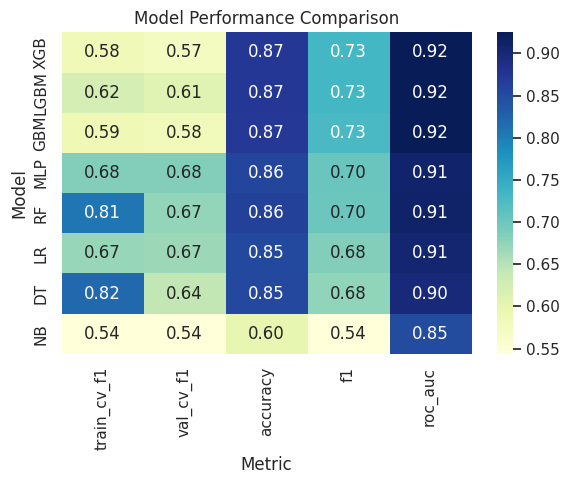

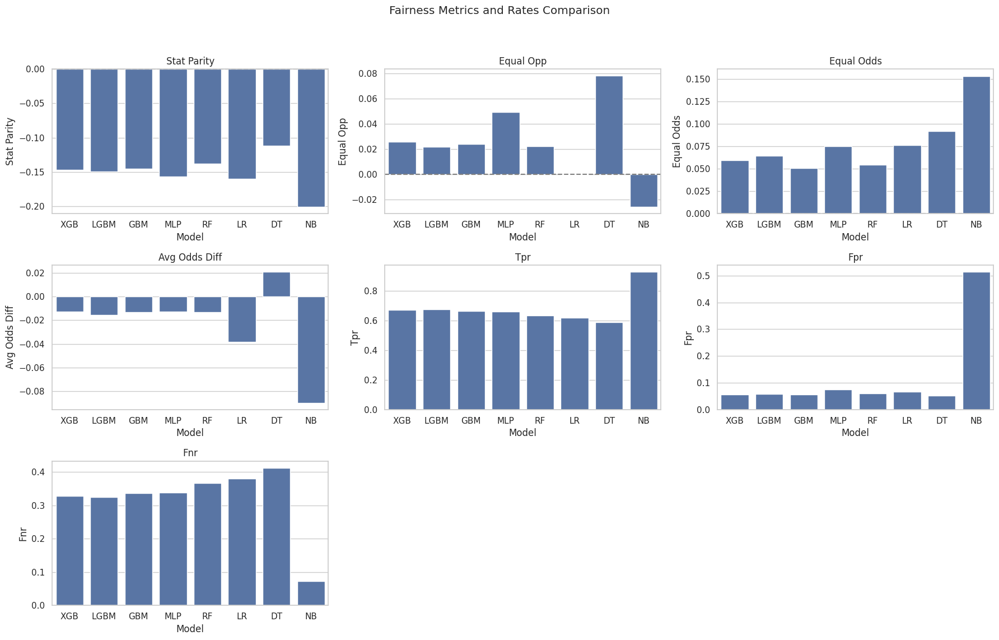

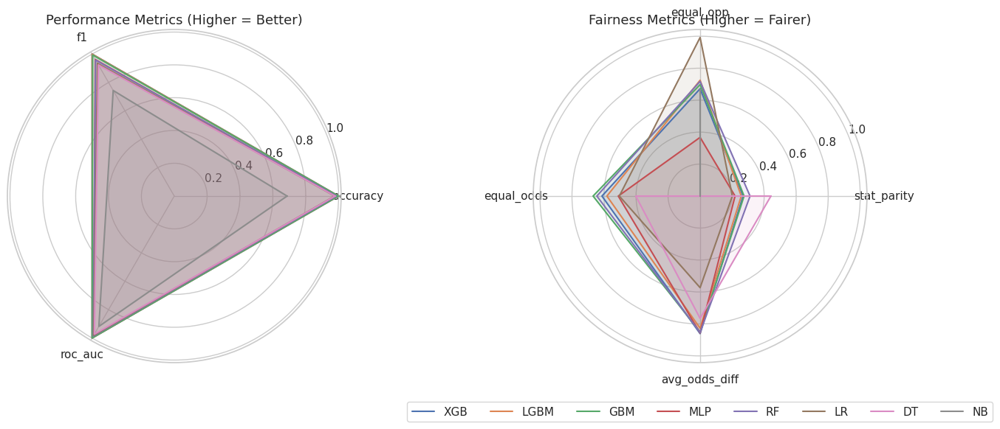

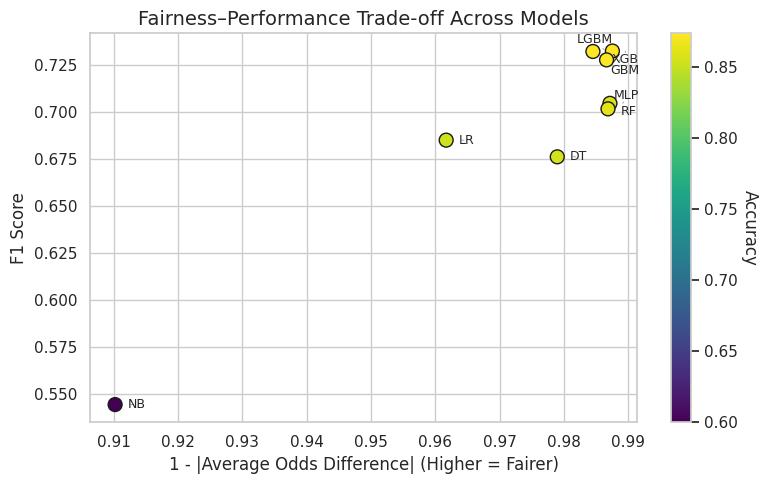

Balanced Best Model: XGB
Model parameters:
{'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': 'logloss', 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 57, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None, 'use_label_encoder': False}


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [21:00:37] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [21:10:28] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11

epoch 0; iter: 0; batch classifier loss: 0.682368; batch adversarial loss: 0.732347
epoch 0; iter: 200; batch classifier loss: 0.385878; batch adversarial loss: 0.672349
epoch 0; iter: 400; batch classifier loss: 0.391583; batch adversarial loss: 0.658898
epoch 0; iter: 600; batch classifier loss: 0.366515; batch adversarial loss: 0.584014
epoch 0; iter: 800; batch classifier loss: 0.567741; batch adversarial loss: 0.649428
epoch 0; iter: 1000; batch classifier loss: 0.473039; batch adversarial loss: 0.656106
epoch 1; iter: 0; batch classifier loss: 0.388371; batch adversarial loss: 0.611216
epoch 1; iter: 200; batch classifier loss: 0.271374; batch adversarial loss: 0.595703
epoch 1; iter: 400; batch classifier loss: 0.474942; batch adversarial loss: 0.542345
epoch 1; iter: 600; batch classifier loss: 0.364277; batch adversarial loss: 0.698691
epoch 1; iter: 800; batch classifier loss: 0.337903; batch adversarial loss: 0.674892
epoch 1; iter: 1000; batch classifier loss: 0.367942; bat

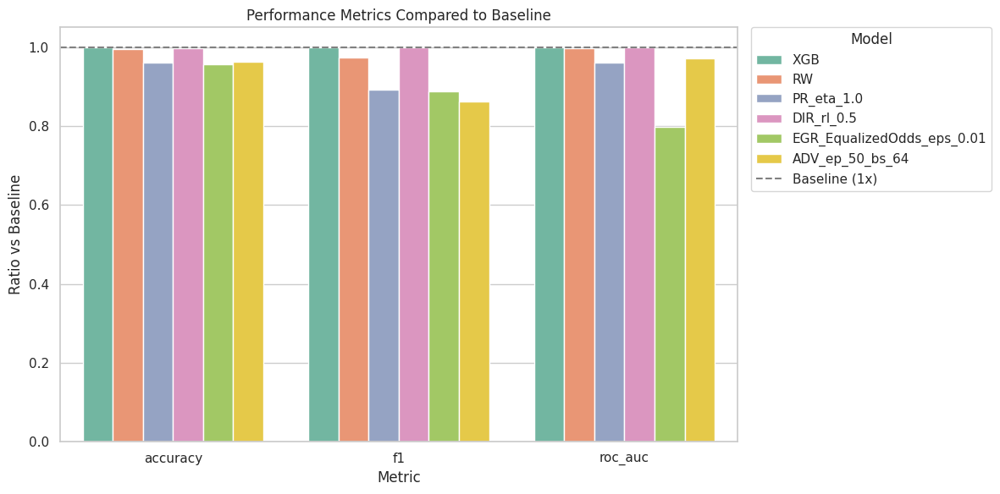

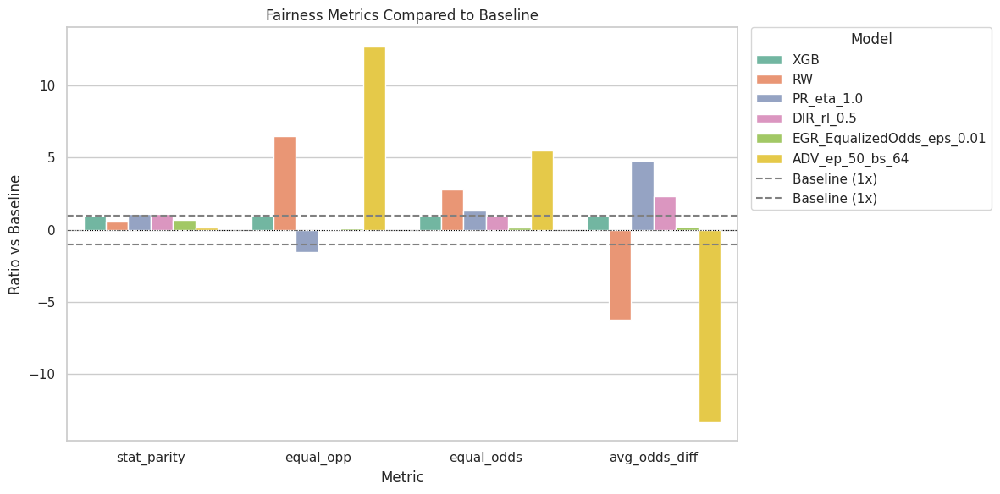

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [21:20:29] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


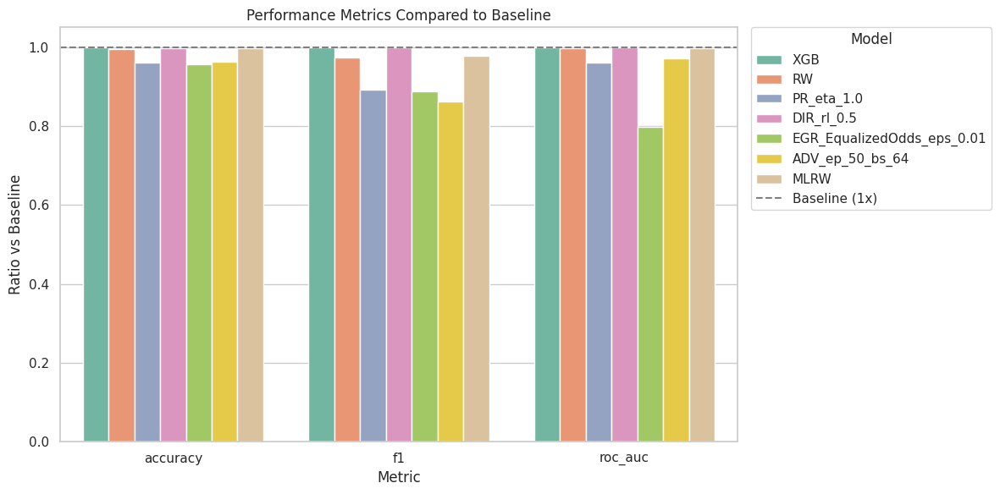

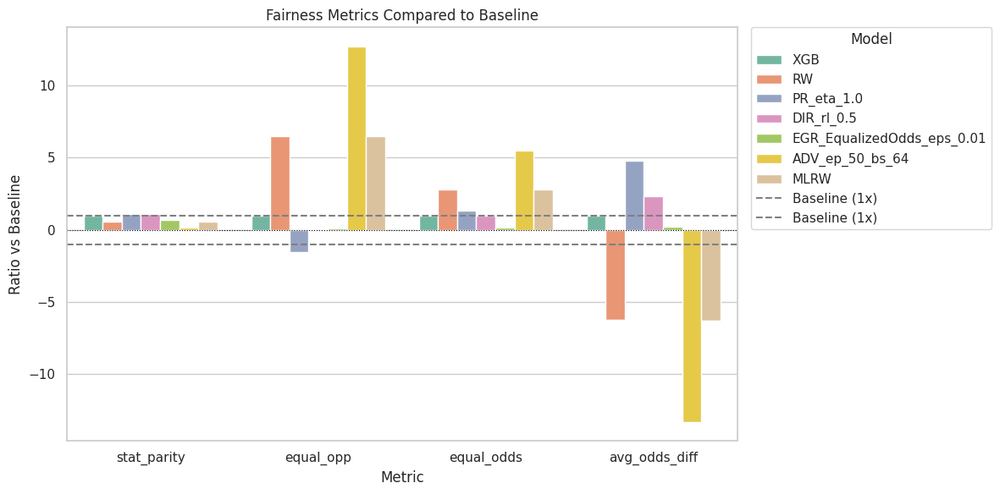

In [ ]:
boundaryUP_results_dict, boundaryUP_result_df = train_evaluate_plot(models, param_grid, X_train_flippedUP, y_train_flippedUP, X_test_flippedUP, y_test_flippedUP, target, sensitive_feature)

# --- Step 4: Plot Pareto Front ---
pareto_plot(boundaryUP_result_df)

# --- Step 5: Select Best Model by Composite Score ---
best_name_boundary = max(boundaryUP_results_dict, key=lambda x: composite_score(boundaryUP_results_dict[x]))
best_model_boundary = boundaryUP_results_dict[best_name_boundary]['best_model']
print(f"Balanced Best Model: {best_name_boundary}")

# Check if it's a pipeline
if isinstance(best_model_boundary, Pipeline):
    print("Model parameters:")
    print(best_model_boundary.named_steps['clf'].get_params())
else:
    print("Model parameters:")
    print(best_model_boundary.get_params())

# --- Step 6: Run Fairness Mitigation Methods ---
tf.compat.v1.reset_default_graph()
sess = tf.compat.v1.Session()
combined_results = run_all_fairness_methods(best_name_boundary, boundary_data_UP, X_train_flippedUP, y_train_flippedUP, X_test_flippedUP, y_test_flippedUP, target, sensitive_feature, boundaryUP_result_df, boundaryUP_results_dict)

# --- Step 7: Visualise Comparison ---
combined_results.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
plot_comparison(combined_results)

# --- Step 8: Apply MultiLevel Reweighing ---
mlrw_results = mlrw(best_name_boundary, boundary_data_UP, X_train_flippedUP, y_train_flippedUP, X_test_flippedUP, y_test_flippedUP, boundaryUP_results_dict)

# --- Step 9: Visualise Comparison with MRLW ---
combined_final = pd.concat([combined_results, mlrw_results], axis=0)
combined_final.style.apply(highlight_max, subset=['accuracy', 'f1', 'roc_auc']).apply(highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff'])
plot_comparison(combined_final)


In [ ]:
# Export the results DataFrame to a CSV file
combined_final.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_Boundary_UnderPriv.csv')

#### Final Runs for all biased_df (fixed model)

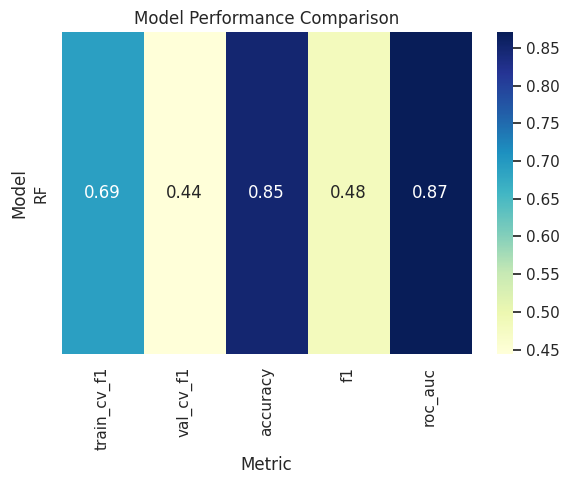

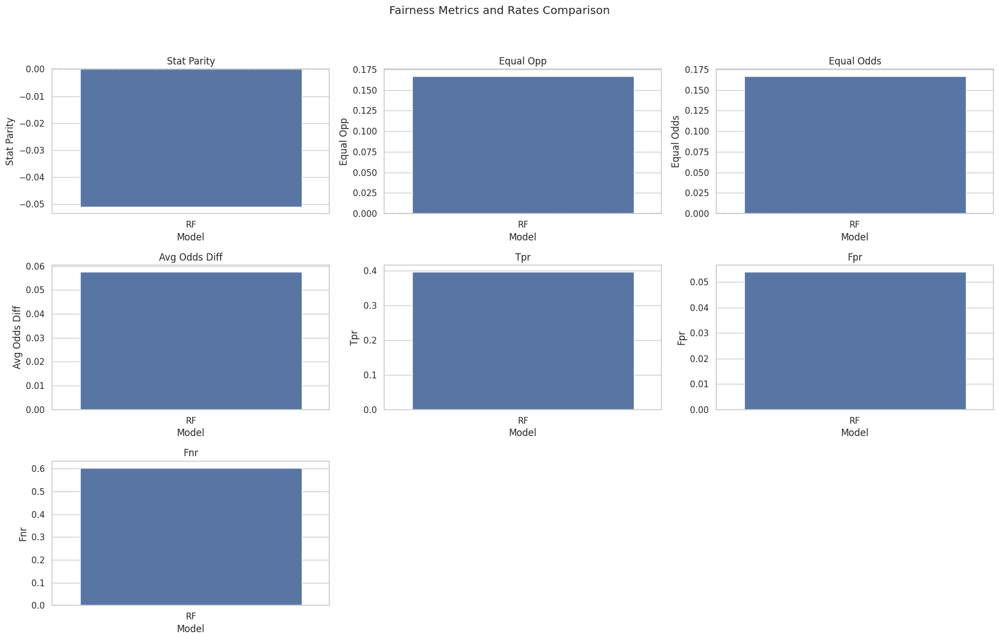

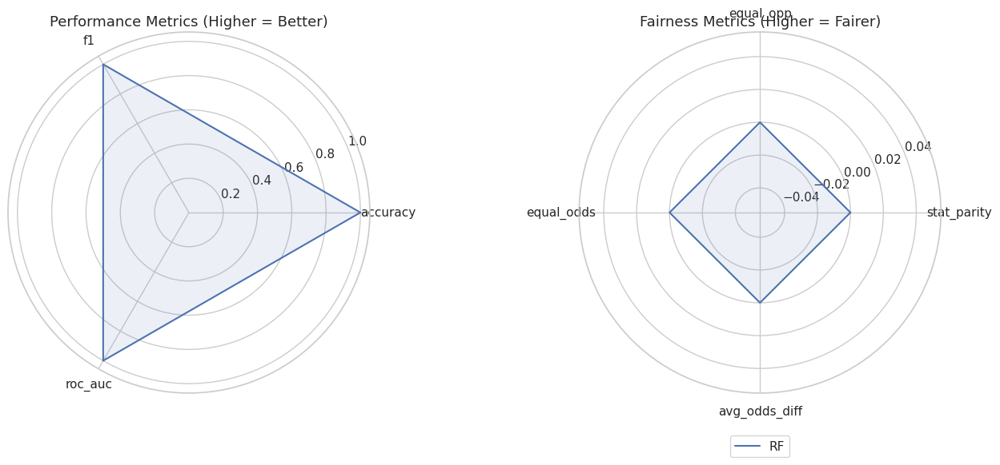

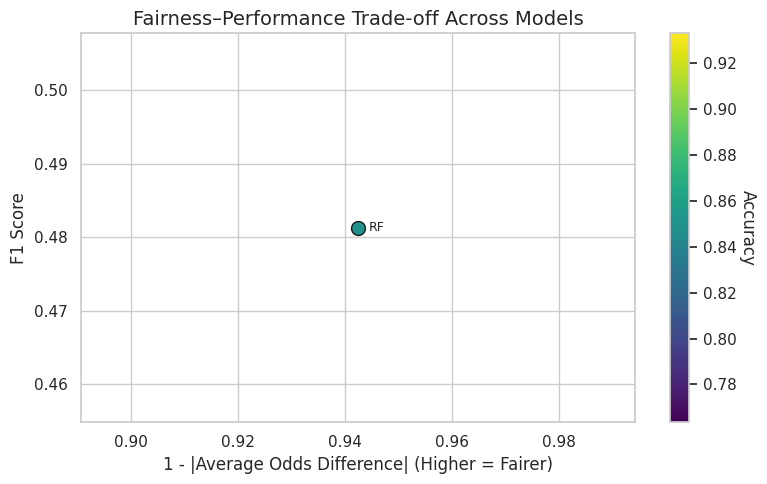

Balanced Best Model: RF
Model parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 30, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 200, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
epoch 0; iter: 0; batch classifier loss: 0.600666; batch adversarial loss: 0.785037
epoch 0; iter: 200; batch classifier loss: 1.106978; batch adversarial loss: 0.983481
epoch 1; iter: 0; batch classifier loss: 1.206052; batch adversarial loss: 0.883285
epoch 1; iter: 200; batch classifier loss: 1.094018; batch adversarial loss: 0.721722
epoch 2; iter: 0; batch classifier loss: 0.849460; batch adversarial loss: 0.663978
epoch 2; iter: 200; batch classifier loss: 0.427196; batch adversarial loss: 0.648298
epoch 3; iter: 0; batch classifier

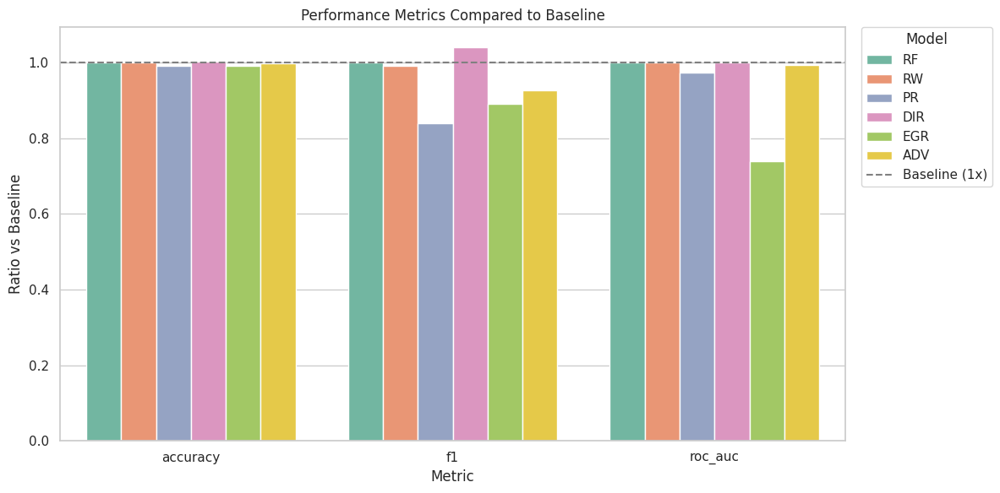

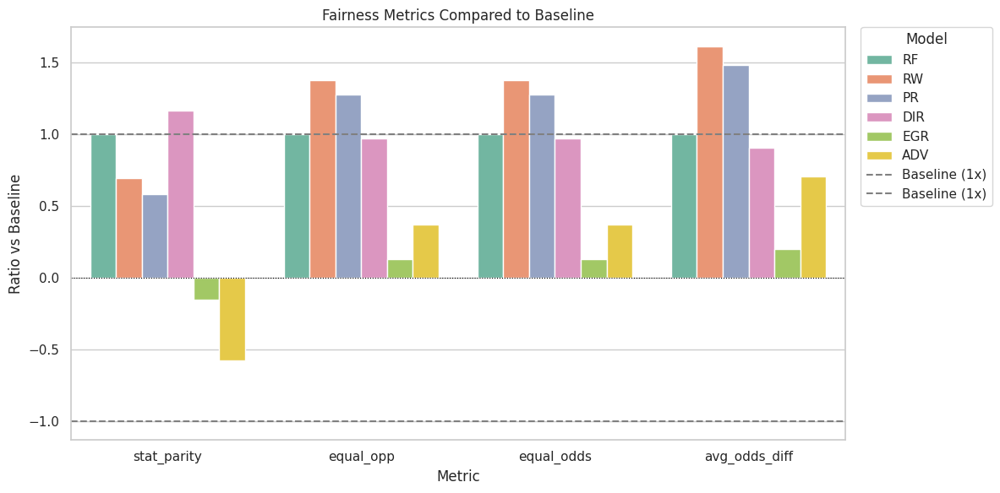

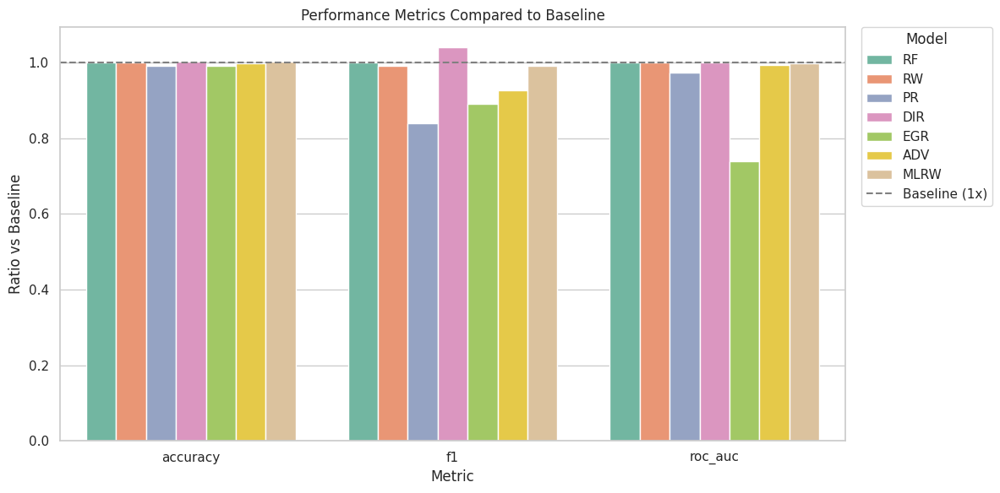

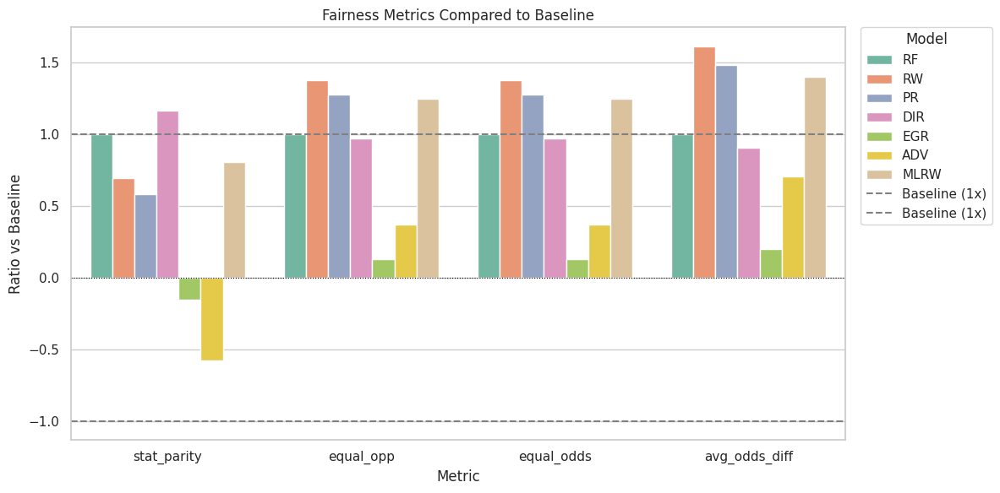

In [ ]:
combined_results2_df_flip, combined_results2_df_flip_mrlw = run_fair_ml_pipeline_fixedmodel(
    data=biased_df_flip,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_df_flip_2, combined_results2_df_flip_2_mrlw = run_fair_ml_pipeline_fixedmodel(
    data=biased_df_flip_2,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_df_flip_3, combined_results2_df_flip_3_mrlw = run_fair_ml_pipeline_fixedmodel(
    data=biased_df_flip_3,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_df_flip_4, combined_results2_df_flip_4_mrlw = run_fair_ml_pipeline_fixedmodel(
    data=biased_df_flip_4,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_genalgo, combined_results2_genalgo_mrlw = run_fair_ml_pipeline_fixedmodel(
    data=df_unfair,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

## Adult Data Over the Years

https://github.com/socialfoundations/folktables/blob/main/README.md

In [ ]:
folder_path = '/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/datasets/Adult/Raw/'

In [ ]:
Adult_2000 = pd.read_csv(folder_path + 'Adult_Census_2000.csv')
Adult_2005 = pd.read_csv(folder_path + 'Adult_Census_2005.csv')
Adult_2010 = pd.read_csv(folder_path + 'Adult_Census_2010.csv')
Adult_2015 = pd.read_csv(folder_path + 'Adult_Census_2015.csv')

In [ ]:
Adult_2000

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,35,Private,1140.13,HS-grad,9,Never-married,Other-service,Husband,1,0,0.0,0.0,40,Other,0
1,26,Private,2430.50,Bachelors,13,Married-civ-spouse,Sales,Wife,1,0,0.0,0.0,40,United-States,0
2,27,Private,2390.94,Some-college,10,Married-civ-spouse,Transport-moving,Own-child,1,1,0.0,0.0,40,United-States,0
3,38,Private,4863.76,Bachelors,13,Married-civ-spouse,Exec-managerial,Wife,1,1,0.0,0.0,40,United-States,0
4,46,Self-emp-inc,1798.53,Doctorate,16,Married-civ-spouse,Prof-specialty,Wife,0,1,0.0,0.0,80,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,35,Local-gov,388.82,Assoc-acdm,12,Never-married,Craft-repair,Husband,0,1,0.0,0.0,40,United-States,0
49996,58,Local-gov,3062.90,Bachelors,13,Widowed,Prof-specialty,Husband,1,0,9424.0,0.0,75,United-States,1
49997,37,Private,502.67,HS-grad,9,Married-civ-spouse,Adm-clerical,Wife,1,0,0.0,0.0,40,United-States,0
49998,50,Private,404.15,Some-college,10,Married-civ-spouse,Craft-repair,Parent,1,1,0.0,0.0,40,United-States,0


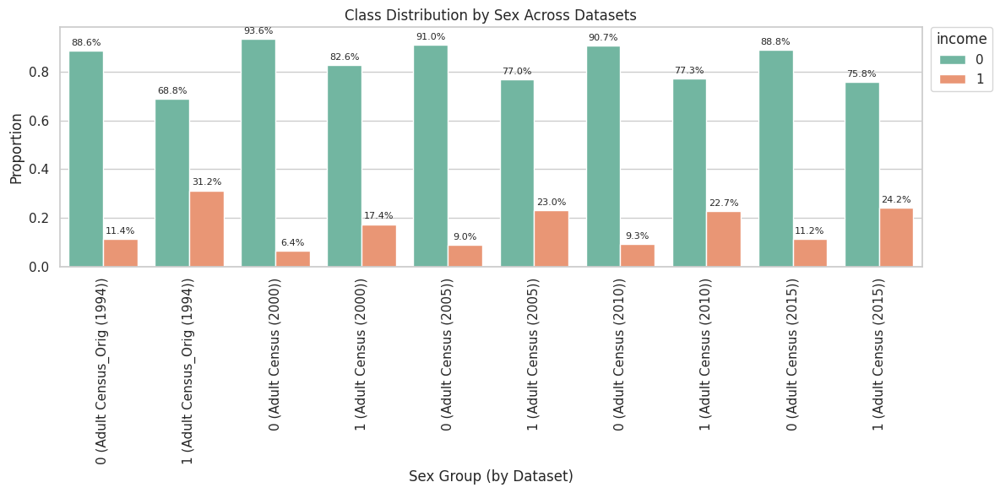

In [ ]:
plot_biased_data_comparison(
    datasets=[
        (data, "Adult Census_Orig (1994)"),
        (Adult_2000, "Adult Census (2000)"),
        (Adult_2005, "Adult Census (2005)"),
        (Adult_2010, "Adult Census (2010)"),
        (Adult_2015, "Adult Census (2015)")
    ],
    sensitive_feature=sensitive_feature,
    label_col=target
)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [10:32:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 4832, number of negative: 35168
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.120800 -> initscore=-1.984876
[LightGBM] [Info] Start training from score -1.984876


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

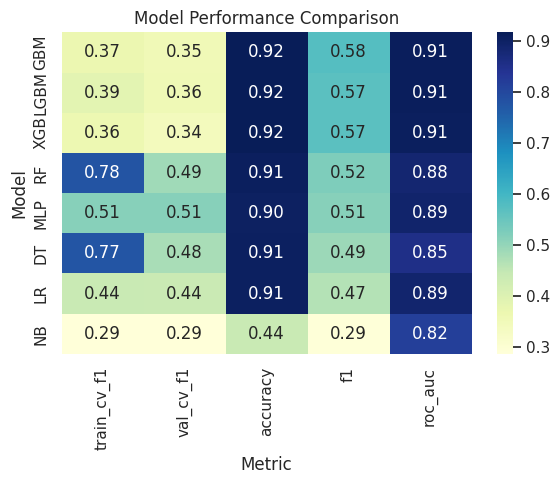

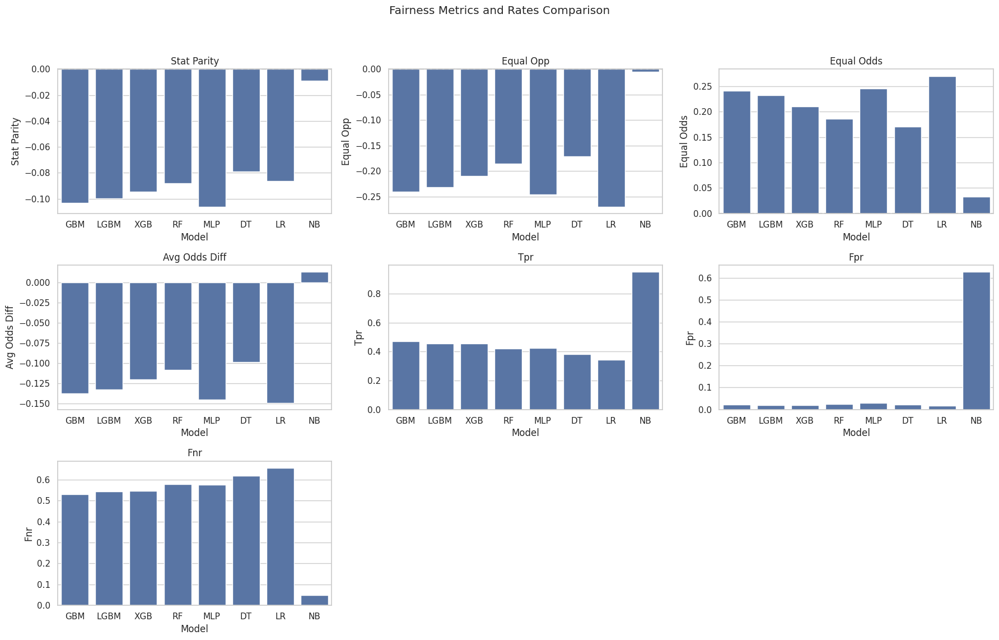

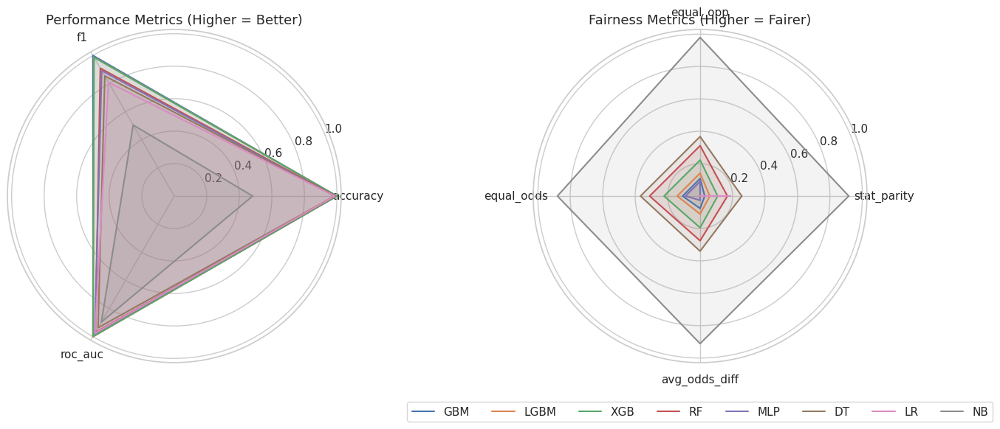

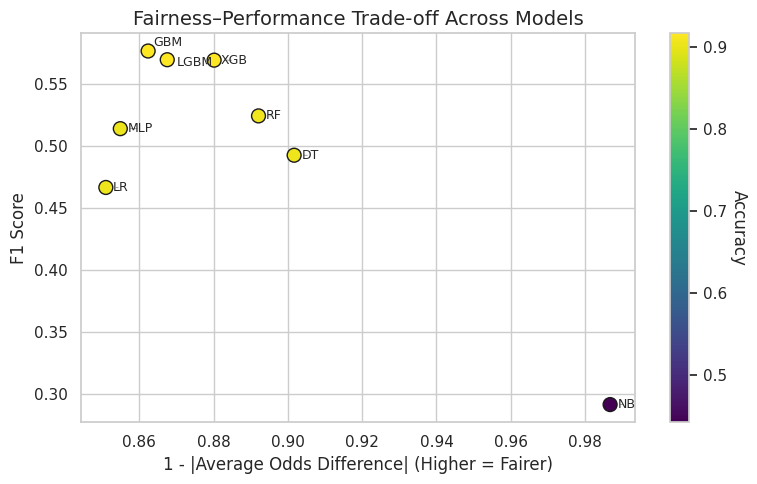

Balanced Best Model: XGB
Model parameters:
{'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': 'logloss', 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 7, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 57, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None, 'use_label_encoder': False}


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [10:42:59] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [10:50:12] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11

epoch 0; iter: 0; batch classifier loss: 0.699184; batch adversarial loss: 0.705902
epoch 0; iter: 200; batch classifier loss: 0.430417; batch adversarial loss: 0.687966
epoch 0; iter: 400; batch classifier loss: 0.262438; batch adversarial loss: 0.688601
epoch 0; iter: 600; batch classifier loss: 0.185288; batch adversarial loss: 0.687351
epoch 0; iter: 800; batch classifier loss: 0.205976; batch adversarial loss: 0.682169
epoch 0; iter: 1000; batch classifier loss: 0.295548; batch adversarial loss: 0.654177
epoch 0; iter: 1200; batch classifier loss: 0.210211; batch adversarial loss: 0.680976
epoch 1; iter: 0; batch classifier loss: 0.235088; batch adversarial loss: 0.658853
epoch 1; iter: 200; batch classifier loss: 0.341980; batch adversarial loss: 0.675519
epoch 1; iter: 400; batch classifier loss: 0.253963; batch adversarial loss: 0.699442
epoch 1; iter: 600; batch classifier loss: 0.206057; batch adversarial loss: 0.754121
epoch 1; iter: 800; batch classifier loss: 0.184724; bat

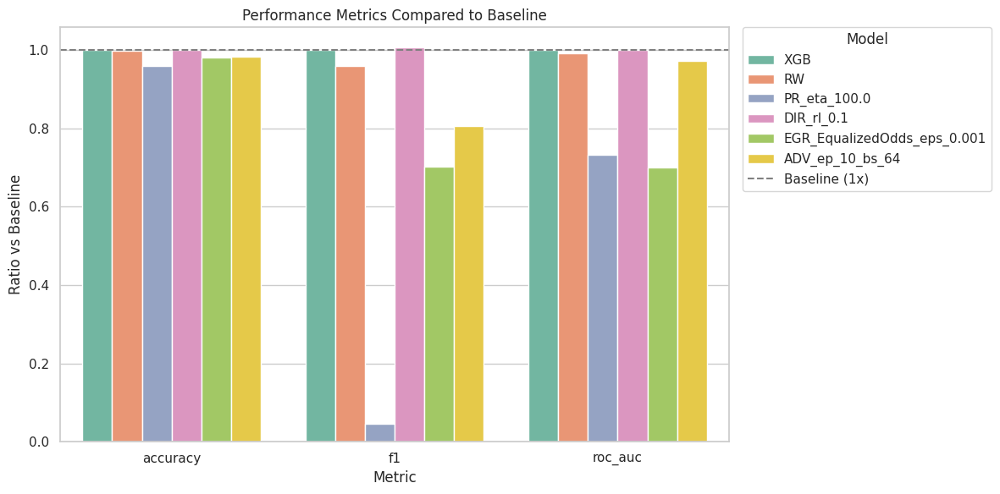

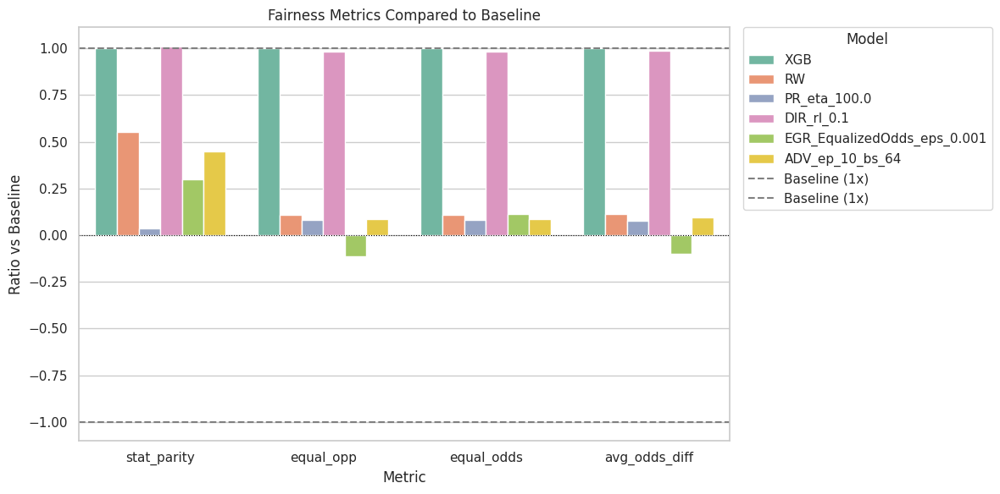

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [11:00:23] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


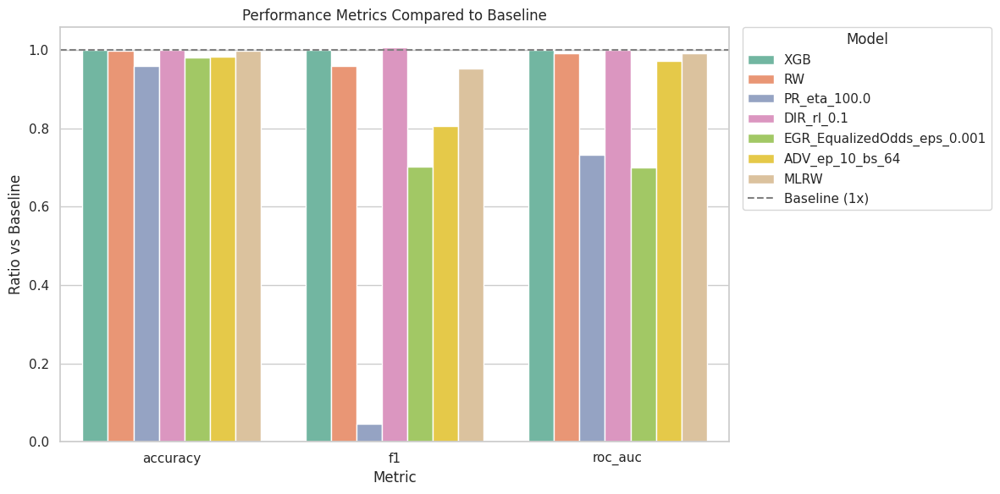

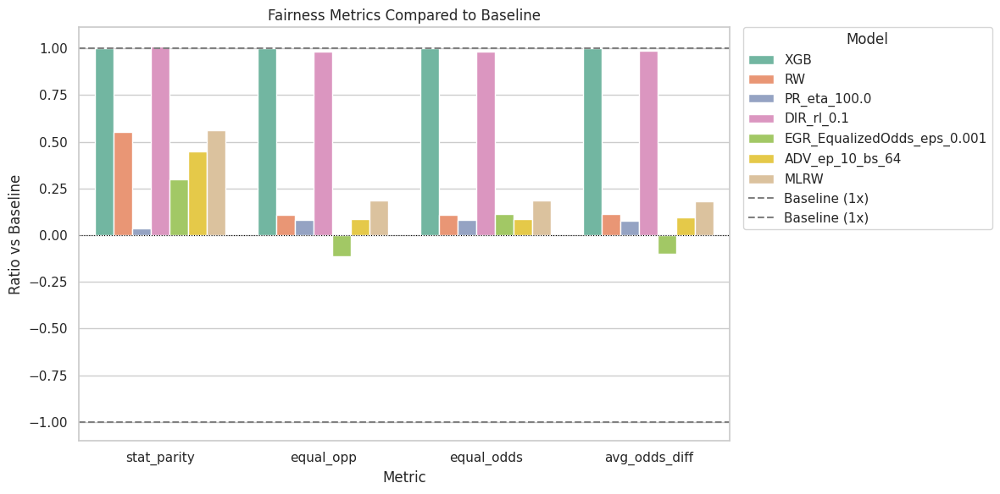

In [ ]:
combined_results_Adult2000, combined_final_Adult2000 = run_fair_ml_pipeline(
    data=Adult_2000,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_Adult2000.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
XGB,0.364827,0.341770,0.917300,0.569592,0.909838,-0.094575,-0.209858,0.209858,-0.119845,0.454308,0.019219,0.545692,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, ...))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.914700,0.546035,0.901260,-0.052141,-0.022889,0.022889,-0.013707,0.424669,0.017971,0.575331,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, ...))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_100.0,nan,nan,0.880400,0.026059,0.666639,-0.003446,-0.017563,0.017563,-0.009020,0.013245,0.000455,0.986755,,100.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.1,nan,nan,0.917100,0.573779,0.909272,-0.095685,-0.206226,0.206226,-0.118522,0.461921,0.020359,0.538079,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=100, n_jobs=None, num_parallel_tree=None, ...))])",0.100000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.001,nan,nan,0.899300,0.400238,0.637550,-0.028095,0.024068,0.024068,0.011770,0.013245,0.000455,0.986755,"ExponentiatedGradient(constraints=, eps=0.001, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0007424500927193229))",0.001000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_64,nan,nan,0.902400,0.459579,0.884989,-0.042507,-0.018003,0.018003,-0.011448,0.013245,0.000455,0.986755,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.914500,0.542536,0.901176,-0.053022,-0.038626,0.038626,-0.021565,0.419702,0.017516,0.580298,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric='logloss', feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.1, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=7, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraint

In [ ]:
# Export the results DataFrame to a CSV file
combined_final_Adult2000.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_2000.csv')

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [18:16:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 6475, number of negative: 33525
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1010
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 55
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.161875 -> initscore=-1.644343
[LightGBM] [Info] Start training from score -1.644343


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

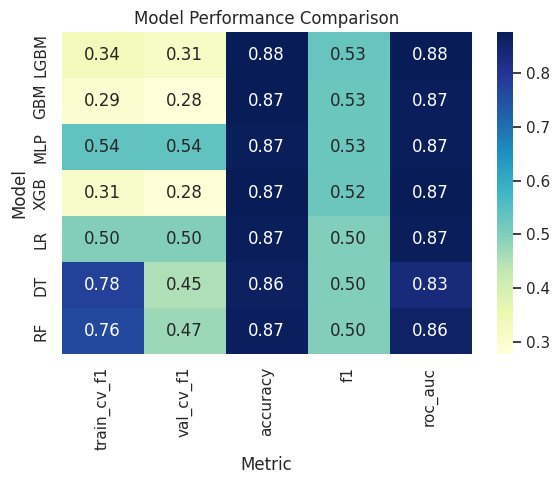

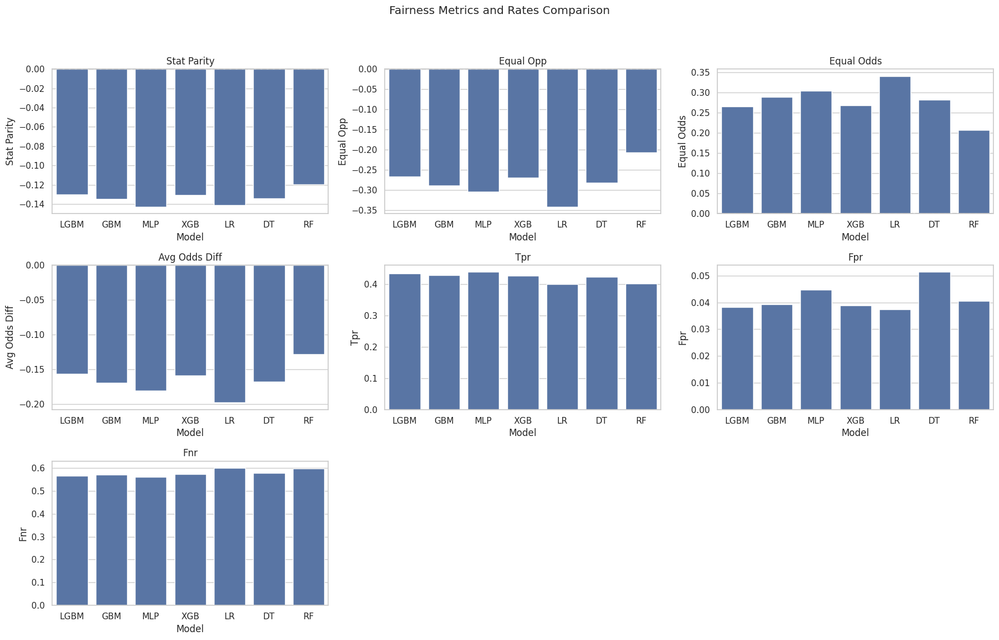

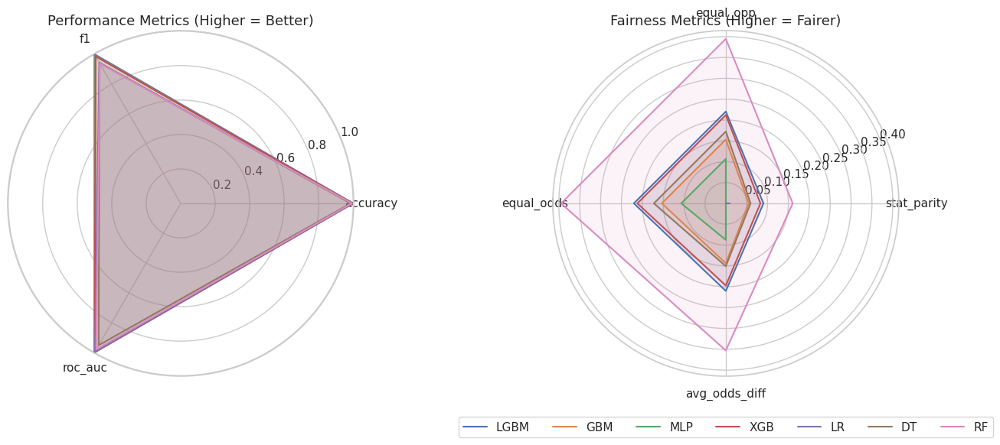

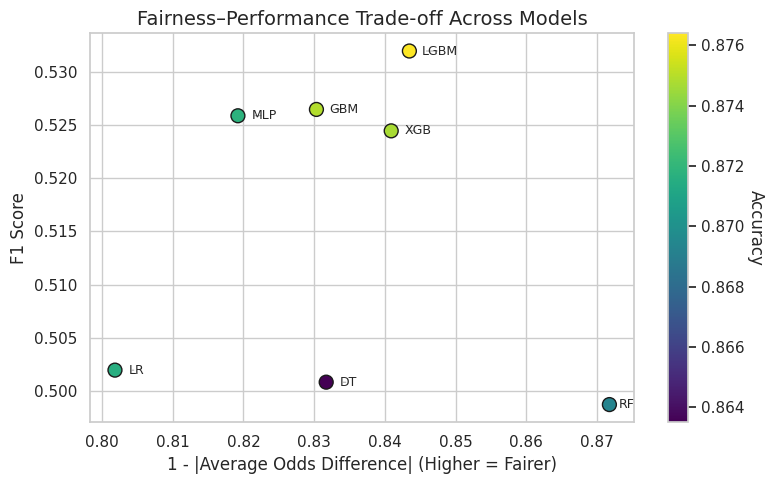

Balanced Best Model: RF
Model parameters:
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 30, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 57, 'verbose': 0, 'warm_start': False}


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler 

epoch 0; iter: 0; batch classifier loss: 0.741463; batch adversarial loss: 0.702439
epoch 0; iter: 200; batch classifier loss: 0.361874; batch adversarial loss: 0.696772
epoch 0; iter: 400; batch classifier loss: 0.383967; batch adversarial loss: 0.695300
epoch 0; iter: 600; batch classifier loss: 0.227598; batch adversarial loss: 0.685341
epoch 0; iter: 800; batch classifier loss: 0.308363; batch adversarial loss: 0.642648
epoch 0; iter: 1000; batch classifier loss: 0.328623; batch adversarial loss: 0.681674
epoch 0; iter: 1200; batch classifier loss: 0.424073; batch adversarial loss: 0.668731
epoch 1; iter: 0; batch classifier loss: 0.229495; batch adversarial loss: 0.681136
epoch 1; iter: 200; batch classifier loss: 0.242464; batch adversarial loss: 0.680405
epoch 1; iter: 400; batch classifier loss: 0.369368; batch adversarial loss: 0.667968
epoch 1; iter: 600; batch classifier loss: 0.195056; batch adversarial loss: 0.697512
epoch 1; iter: 800; batch classifier loss: 0.244660; bat

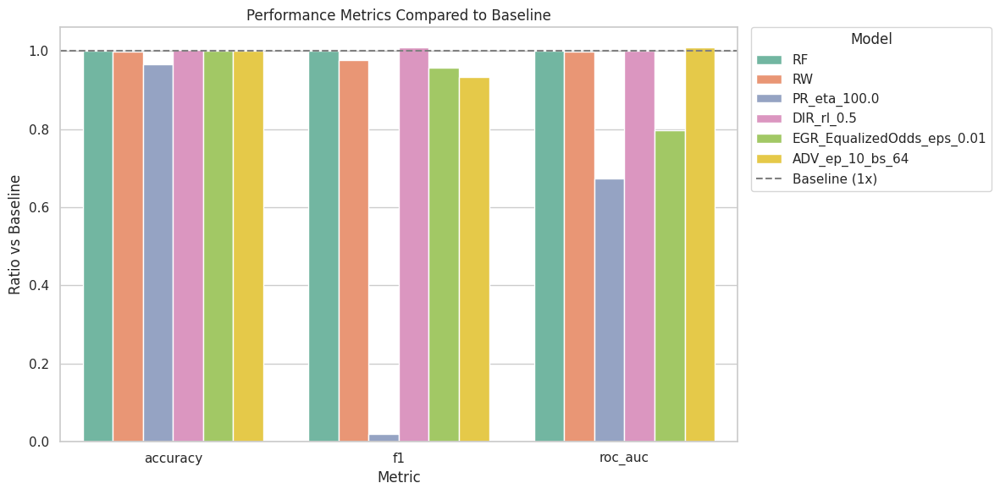

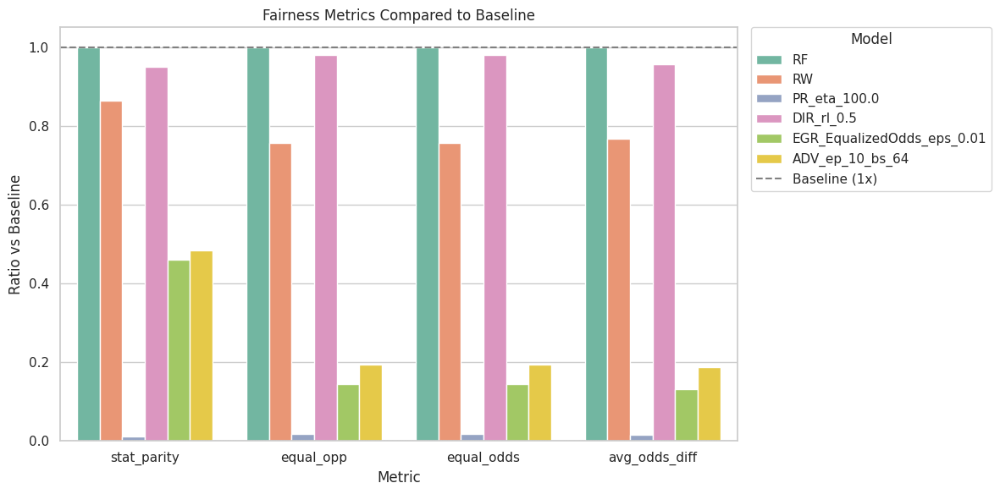

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


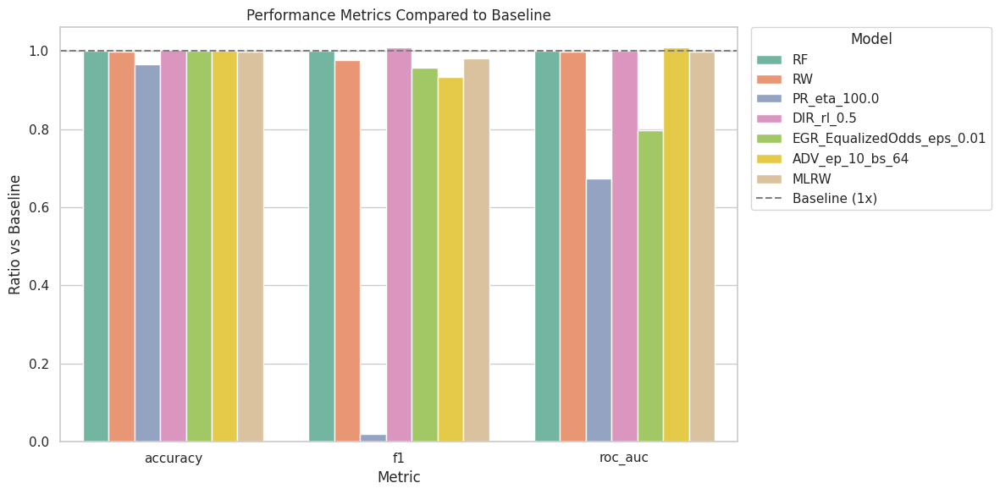

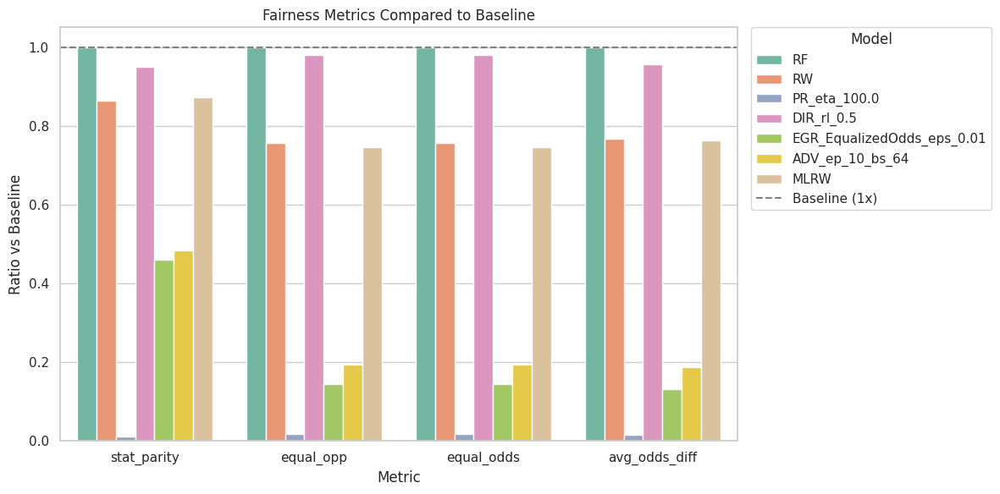

In [ ]:
combined_results_2005, combined_final_2005 = run_fair_ml_pipeline(
    data=Adult_2005,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_2005.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
RF,0.763443,0.473658,0.869300,0.498714,0.857970,-0.119845,-0.206501,0.206501,-0.128229,0.402149,0.040585,0.597851,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', RandomForestClassifier(max_depth=30, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.868100,0.486970,0.856932,-0.103613,-0.156389,0.156389,-0.098482,0.386658,0.038898,0.613342,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', RandomForestClassifier(max_depth=30, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_100.0,nan,nan,0.838800,0.009828,0.577599,-0.001344,-0.003499,0.003499,-0.001876,0.004941,0.000119,0.995059,,100.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.5,nan,nan,0.871100,0.503658,0.859291,-0.113857,-0.202187,0.202187,-0.122565,0.403953,0.038659,0.596047,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', RandomForestClassifier(max_depth=30, random_state=57))])",0.500000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.01,nan,nan,0.870200,0.477456,0.684169,-0.055120,-0.029719,0.029719,-0.016850,0.004941,0.000119,0.995059,"ExponentiatedGradient(constraints=, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0008340503654419395))",0.010000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_64,nan,nan,0.869700,0.465326,0.865566,-0.058024,-0.039915,0.039915,-0.024087,0.004941,0.000119,0.995059,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.868400,0.489527,0.856868,-0.104569,-0.154182,0.154182,-0.097871,0.389747,0.039136,0.610253,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', RandomForestClassifier(max_depth=30, random_state=57))])",nan,-0.035341,-0.077559,0.077559,-0.044588,0.389747,0.039136,0.610253


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_2005.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_2005.csv')

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [18:54:19] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 6428, number of negative: 33572
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 513
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160700 -> initscore=-1.653029
[LightGBM] [Info] Start training from score -1.653029


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

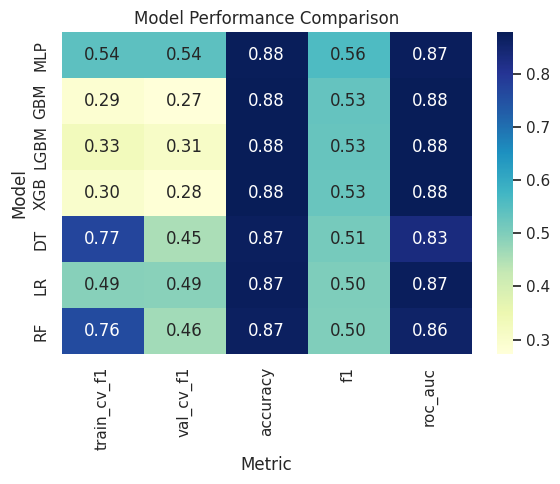

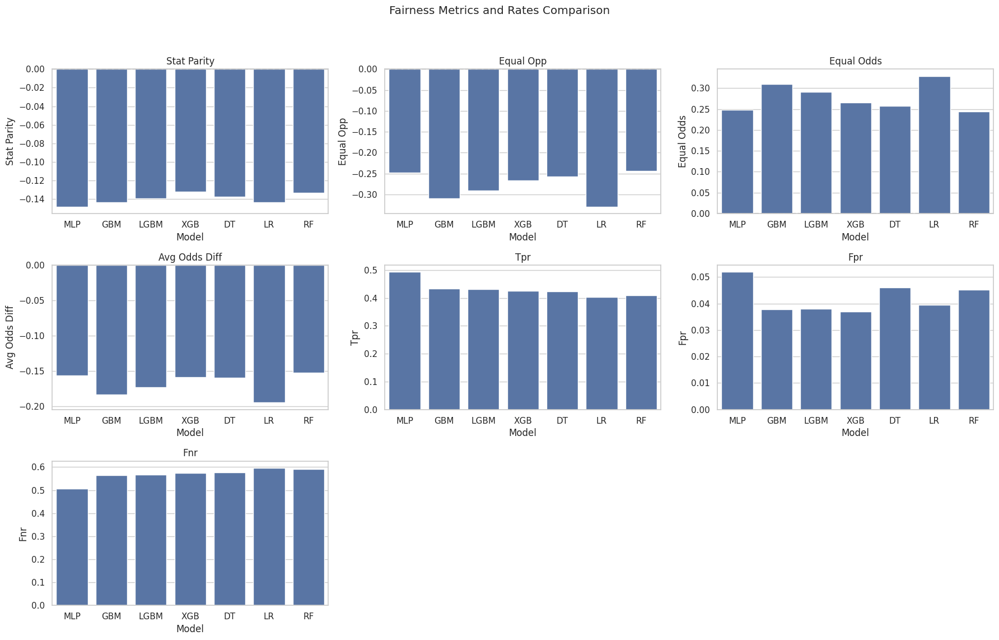

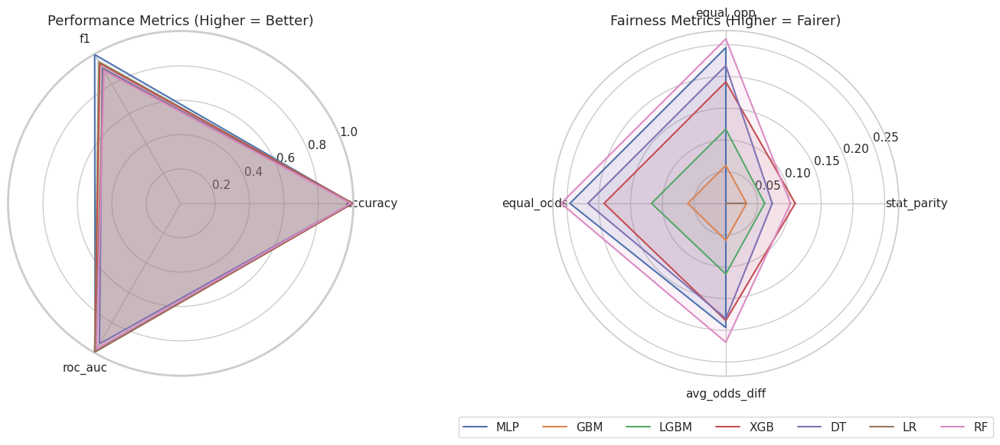

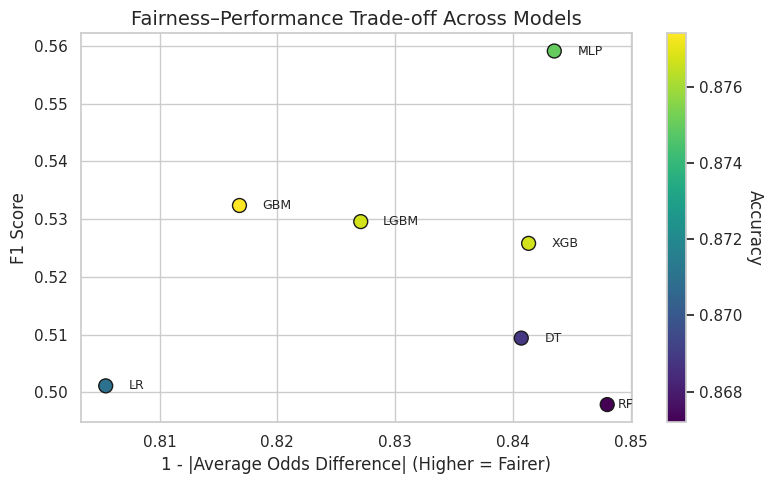

Balanced Best Model: MLP
Model parameters:
{'batch_size': 64, 'epochs': 20, 'hidden_dim': 64, 'input_dim': 56, 'lr': 0.001, 'random_state': 42}
epoch 0; iter: 0; batch classifier loss: 0.730222; batch adversarial loss: 0.696074
epoch 0; iter: 200; batch classifier loss: 0.255672; batch adversarial loss: 0.698889
epoch 0; iter: 400; batch classifier loss: 0.291697; batch adversarial loss: 0.697053
epoch 0; iter: 600; batch classifier loss: 0.308330; batch adversarial loss: 0.668509
epoch 0; iter: 800; batch classifier loss: 0.339997; batch adversarial loss: 0.685731
epoch 0; iter: 1000; batch classifier loss: 0.295193; batch adversarial loss: 0.684861
epoch 0; iter: 1200; batch classifier loss: 0.531196; batch adversarial loss: 0.668284
epoch 1; iter: 0; batch classifier loss: 0.291437; batch adversarial loss: 0.666916
epoch 1; iter: 200; batch classifier loss: 0.433275; batch adversarial loss: 0.682208
epoch 1; iter: 400; batch classifier loss: 0.298586; batch adversarial loss: 0.64046

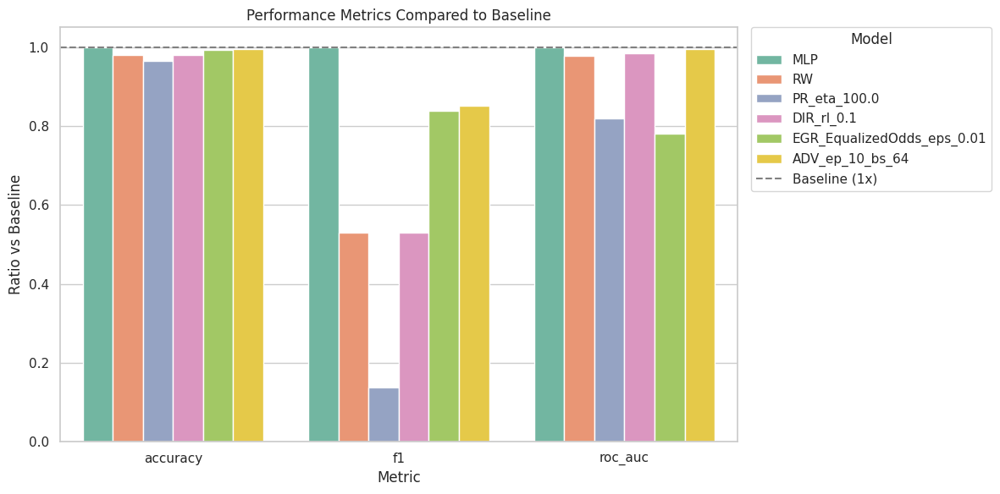

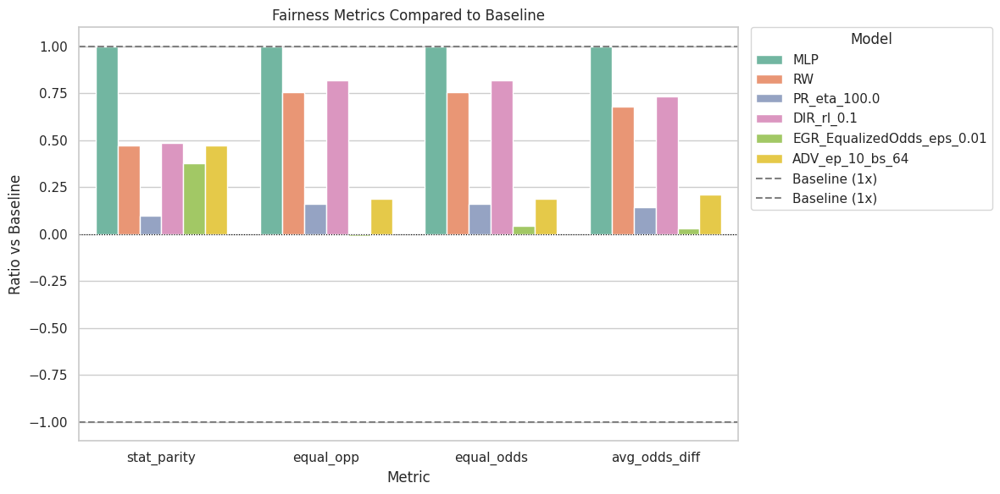

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav


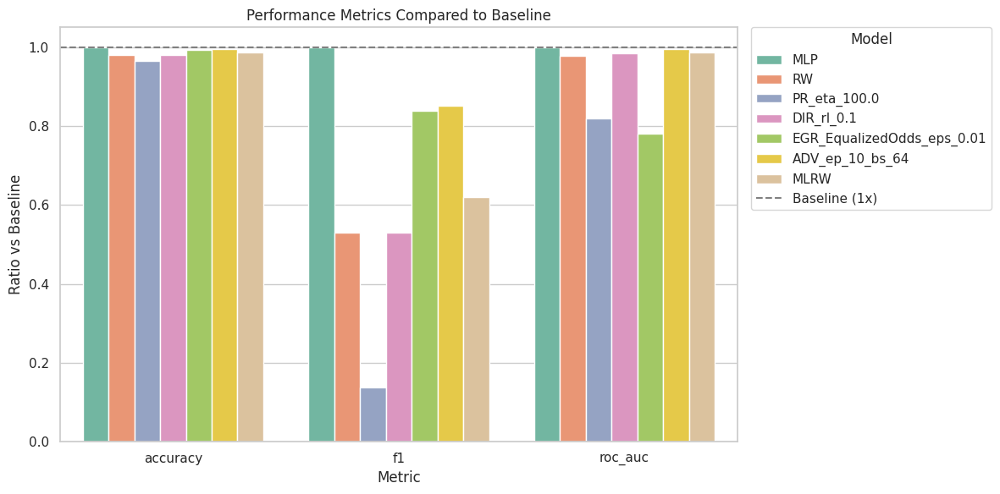

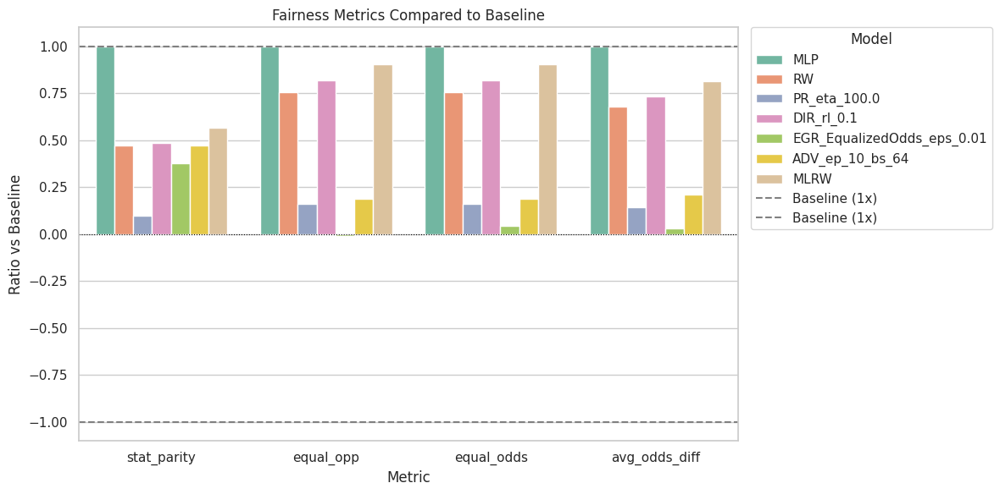

In [ ]:
combined_results_2010, combined_final_2010 = run_fair_ml_pipeline(
    data=Adult_2010,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_2010.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
MLP,0.540034,0.540034,0.875000,0.559149,0.871876,-0.148297,-0.248514,0.248514,-0.156476,0.493601,0.051934,0.506399,PyTorchMLPWrapper(input_dim=56),nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.857900,0.296186,0.853457,-0.069615,-0.187044,0.187044,-0.106166,0.186061,0.013464,0.813939,PyTorchMLPWrapper(input_dim=56),nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_100.0,nan,nan,0.843800,0.076832,0.713704,-0.014438,-0.039980,0.039980,-0.022328,0.040448,0.002383,0.959552,,100.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.1,nan,nan,0.857900,0.296883,0.857729,-0.072012,-0.203570,0.203570,-0.114559,0.186683,0.013583,0.813317,PyTorchMLPWrapper(input_dim=56),0.100000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.01,nan,nan,0.868200,0.469404,0.680531,-0.055721,0.002307,0.011066,-0.004379,0.040448,0.002383,0.959552,"ExponentiatedGradient(constraints=, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0008348868655369468))",0.010000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_10_bs_64,nan,nan,0.869700,0.476497,0.866772,-0.069913,-0.046997,0.046997,-0.033180,0.040448,0.002383,0.959552,,10,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.862400,0.346629,0.859352,-0.083650,-0.224746,0.224746,-0.127245,0.227131,0.015966,0.772869,PyTorchMLPWrapper(input_dim=56),nan,-0.012443,0.000380,0.004763,-0.002192,0.227131,0.015966,0.772869


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_2010.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_2010.csv')

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [19:35:38] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

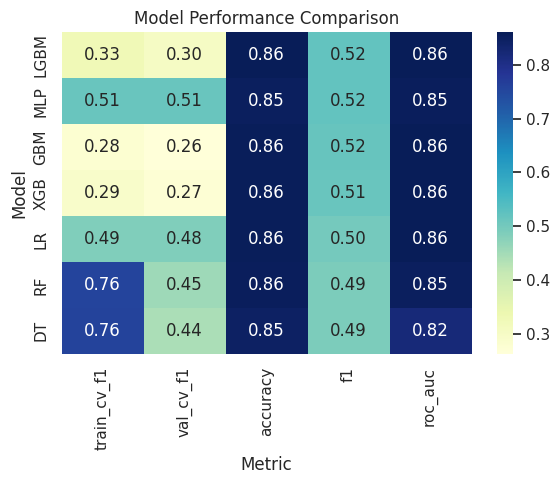

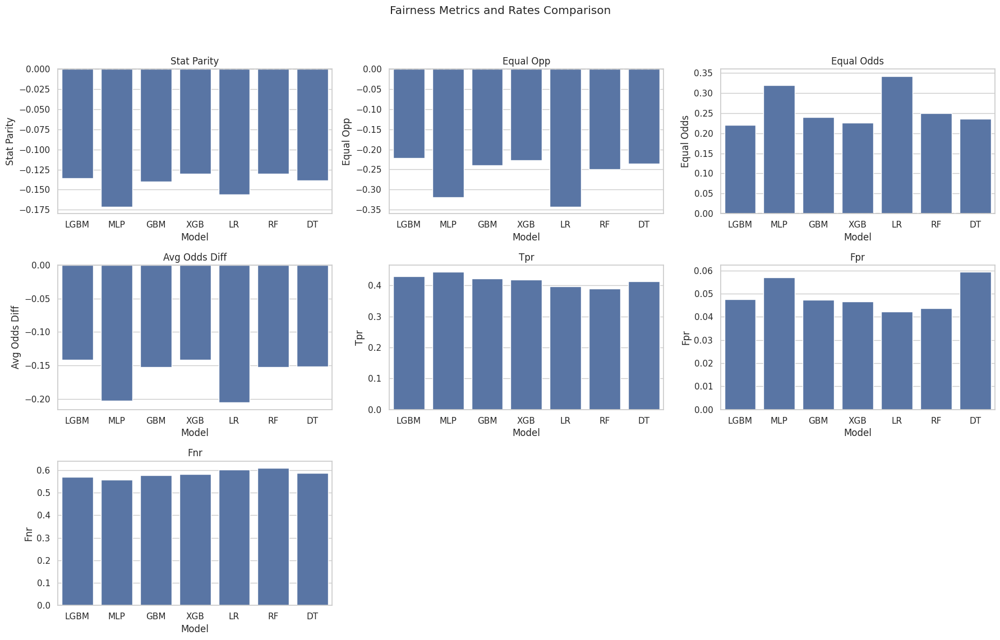

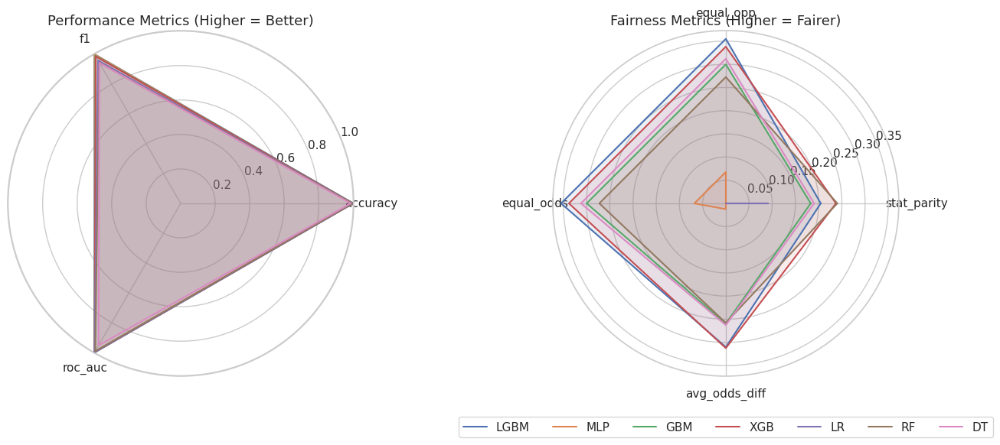

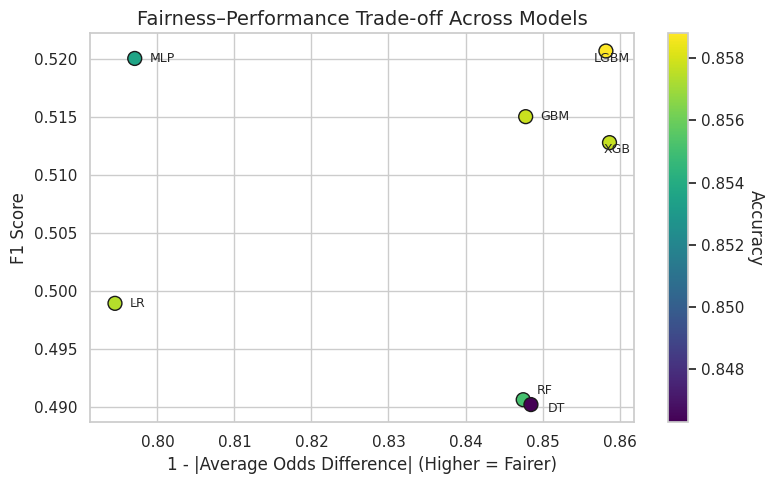

Balanced Best Model: LGBM
Model parameters:
{'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': 10, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 57, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}
[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from sc

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 513
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 512
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 511
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 505
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


epoch 0; iter: 0; batch classifier loss: 0.740069; batch adversarial loss: 0.689650
epoch 0; iter: 200; batch classifier loss: 0.355633; batch adversarial loss: 0.701864
epoch 0; iter: 400; batch classifier loss: 0.297400; batch adversarial loss: 0.687390
epoch 0; iter: 600; batch classifier loss: 0.298239; batch adversarial loss: 0.676081
epoch 0; iter: 800; batch classifier loss: 0.182507; batch adversarial loss: 0.686360
epoch 0; iter: 1000; batch classifier loss: 0.398815; batch adversarial loss: 0.672529
epoch 0; iter: 1200; batch classifier loss: 0.149179; batch adversarial loss: 0.687148
epoch 1; iter: 0; batch classifier loss: 0.606702; batch adversarial loss: 0.670601
epoch 1; iter: 200; batch classifier loss: 0.296676; batch adversarial loss: 0.693449
epoch 1; iter: 400; batch classifier loss: 0.302983; batch adversarial loss: 0.669028
epoch 1; iter: 600; batch classifier loss: 0.405807; batch adversarial loss: 0.714493
epoch 1; iter: 800; batch classifier loss: 0.282236; bat

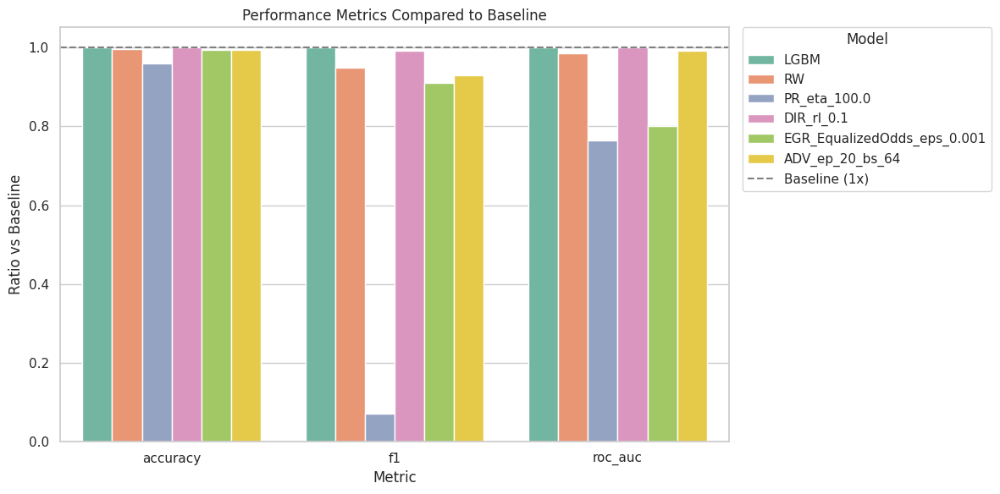

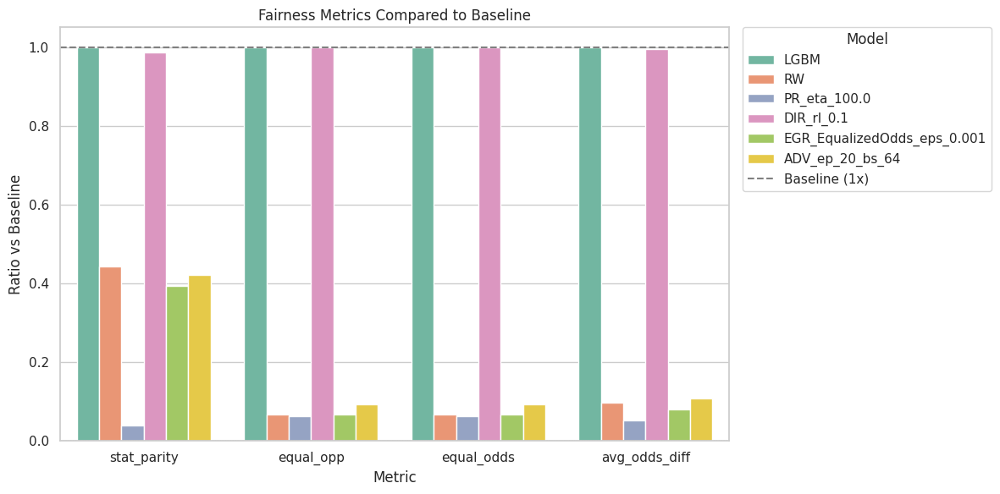

/tmp/ipython-input-2097818403.py:84: RuntimeWarning: invalid value encountered in scalar divide
  n_fav
/tmp/ipython-input-2097818403.py:89: RuntimeWarning: invalid value encountered in scalar divide
  n_unfav


[LightGBM] [Info] Number of positive: 7151, number of negative: 32849
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 40000, number of used features: 53
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178775 -> initscore=-1.524669
[LightGBM] [Info] Start training from score -1.524669


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


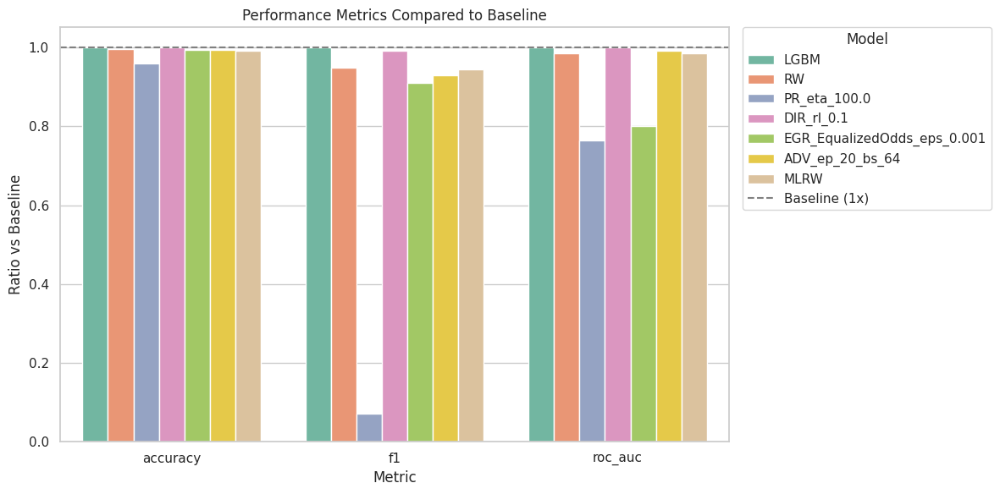

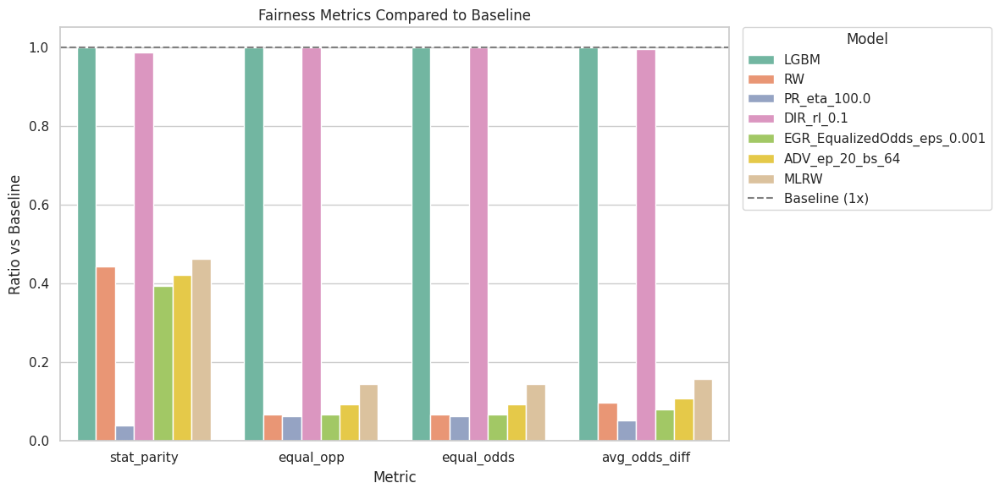

In [ ]:
combined_results_2015, combined_final_2015 = run_fair_ml_pipeline(
    data=Adult_2015,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_final_2015.style.apply(
    highlight_max, subset=['accuracy', 'f1', 'roc_auc', 'tpr']).apply(
        highlight_min_abs, subset=['stat_parity', 'equal_opp', 'equal_odds', 'avg_odds_diff', 'fpr', 'fnr'])

,train_cv_f1,val_cv_f1,accuracy,f1,roc_auc,stat_parity,equal_opp,equal_odds,avg_odds_diff,tpr,fpr,fnr,best_model,best_parameter,stat_parity_race,equal_opp_race,equal_odds_race,avg_odds_diff_race,tpr_race,fpr_race,fnr_race
LGBM,0.325853,0.303725,0.858800,0.520701,0.860025,-0.136085,-0.221024,0.221024,-0.141773,0.429365,0.047594,0.570635,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=10, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
RW,nan,nan,0.854500,0.493913,0.848056,-0.060220,-0.014983,0.014983,-0.013757,0.397092,0.045908,0.602908,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=10, random_state=57))])",nan,nan,nan,nan,nan,nan,nan,nan
PR_eta_100.0,nan,nan,0.824300,0.037260,0.656534,-0.005266,-0.013906,0.013906,-0.007344,0.019016,0.000365,0.980984,,100.000000,nan,nan,nan,nan,nan,nan,nan
DIR_rl_0.1,nan,nan,0.858600,0.516416,0.860675,-0.134265,-0.221142,0.221142,-0.141079,0.422260,0.046396,0.577740,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=10, random_state=57))])",0.100000,nan,nan,nan,nan,nan,nan,nan
EGR_EqualizedOdds_eps_0.001,nan,nan,0.853000,0.474249,0.688413,-0.053509,-0.014605,0.014605,-0.011360,0.019016,0.000365,0.980984,"ExponentiatedGradient(constraints=, eps=0.001, estimator=LogisticRegression(random_state=57, solver='liblinear'), nu=np.float64(0.0008798217707310101))",0.001000,nan,nan,nan,nan,nan,nan,nan
ADV_ep_20_bs_64,nan,nan,0.853400,0.483803,0.853352,-0.057348,-0.020512,0.020512,-0.015204,0.019016,0.000365,0.980984,,20,nan,nan,nan,nan,nan,nan,nan
MLRW,nan,nan,0.851700,0.491949,0.846693,-0.062859,-0.032018,0.032018,-0.022313,0.401566,0.050292,0.598434,"Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', LGBMClassifier(max_depth=10, random_state=57))])",nan,-0.000013,0.030745,0.030745,0.018861,0.401566,0.050292,0.598434


In [ ]:
# Export the results DataFrame to a CSV file
combined_final_2015.to_csv('/content/drive/MyDrive/UCL_MSc_AI/UCLFinalProj/FinalProj_Main/Results/Adult/Adult_Sex_2015.csv')

#### Other Years Run with fixed model

In [ ]:
combined_results2_2000 = run_fair_ml_pipeline_fixedmodel(
    data=Adult_2000,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_2005 = run_fair_ml_pipeline_fixedmodel(
    data=Adult_2005,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_2010 = run_fair_ml_pipeline_fixedmodel(
    data=Adult_2010,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

In [ ]:
combined_results2_2015 = run_fair_ml_pipeline_fixedmodel(
    data=Adult_2015,
    target=target,
    sensitive_feature=sensitive_feature,
    param_grid=param_grid
)

##  PART 2: SENSITIVE FEATURE IDENTIFICATION

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
perm = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=random_seed)

importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': perm.importances_mean})
importance_df = importance_df.sort_values('importance', ascending=False)

sensitive_feature = importance_df.iloc[0]['feature']  # Most sensitive feature
print(f"Most sensitive feature: {sensitive_feature}")

Most sensitive feature: capital-gain


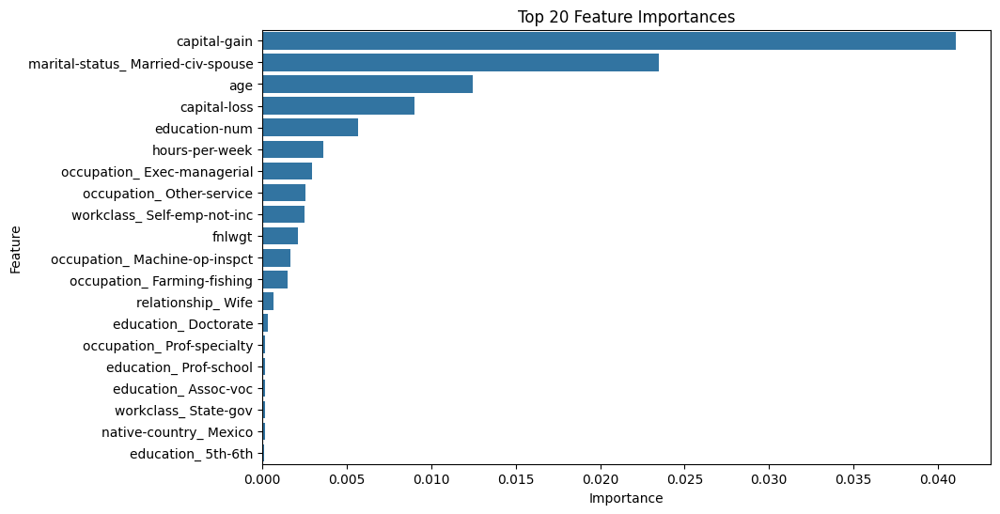

In [ ]:
# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=importance_df.head(20))
plt.title('Top 20 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

###Fair Feature importance

Added a compute_fair_feature_importance function (inspired by FairSHAP). It uses permutation-based perturbation to estimate how each feature contributes to fairness metrics (like statistical parity or equal opportunity).

In [ ]:
def compute_fair_feature_importance(model, X_test, y_test, sensitive_feature, target, fairness_metric='stat_parity'):
    base_pred = model.predict(X_test)
    base_pred = np.array(base_pred).astype(int)
    val_df = X_test.copy()
    val_df[target] = y_test.astype(int)
    base_pred_df = X_test.copy()
    base_pred_df[target] = base_pred.astype(int)

    base_true = BinaryLabelDataset(df=val_df, label_names=[target], protected_attribute_names=[sensitive_feature])
    base_pred_ds = BinaryLabelDataset(df=base_pred_df, label_names=[target], protected_attribute_names=[sensitive_feature])
    base_metric = ClassificationMetric(base_true, base_pred_ds,
        privileged_groups=[{sensitive_feature: 1}], unprivileged_groups=[{sensitive_feature: 0}])

    base_score = {
        'stat_parity': base_metric.statistical_parity_difference(),
        'equal_opp': base_metric.equal_opportunity_difference(),
        'equal_odds': base_metric.equalized_odds_difference()
    }[fairness_metric]

    feature_importance = []
    for feature in X_test.columns:
        X_temp = X_test.copy()
        X_temp[feature] = np.random.permutation(X_temp[feature].values)

        y_pred_temp = model.predict(X_temp)
        y_pred_temp = np.array(y_pred_temp).astype(int)
        temp_df = X_test.copy()
        temp_df[target] = y_pred_temp

        temp_pred_ds = BinaryLabelDataset(df=temp_df, label_names=[target], protected_attribute_names=[sensitive_feature])
        temp_metric = ClassificationMetric(base_true, temp_pred_ds,
            privileged_groups=[{sensitive_feature: 1}], unprivileged_groups=[{sensitive_feature: 0}])

        temp_score = {
            'stat_parity': temp_metric.statistical_parity_difference(),
            'equal_opp': temp_metric.equal_opportunity_difference(),
            'equal_odds': temp_metric.equalized_odds_difference()
        }[fairness_metric]

        importance_score = abs(temp_score - base_score)
        feature_importance.append({
            'feature': feature,
            'fairness_importance': importance_score
        })

        print(f"{feature}: base_score={base_score:.4f}, temp_score={temp_score:.4f}")

    # Return sorted DataFrame
    importance_df = pd.DataFrame(feature_importance).sort_values(by='fairness_importance', ascending=False).reset_index(drop=True)

    return importance_df

In [ ]:
fair_importance = compute_fair_feature_importance(rf, X_test, y_test, sensitive_feature, target)
print(fair_importance.head())

age: base_score=-0.1979, temp_score=-0.1734
fnlwgt: base_score=-0.1979, temp_score=-0.2027
education-num: base_score=-0.1979, temp_score=-0.1703
race: base_score=-0.1979, temp_score=-0.1935
sex: base_score=-0.1979, temp_score=-0.1756
capital-gain: base_score=-0.1979, temp_score=-0.1904
capital-loss: base_score=-0.1979, temp_score=-0.1950
hours-per-week: base_score=-0.1979, temp_score=-0.1794
workclass_ Local-gov: base_score=-0.1979, temp_score=-0.1960
workclass_ Private: base_score=-0.1979, temp_score=-0.1967
workclass_ Self-emp-inc: base_score=-0.1979, temp_score=-0.1988
workclass_ Self-emp-not-inc: base_score=-0.1979, temp_score=-0.1980
workclass_ State-gov: base_score=-0.1979, temp_score=-0.1981
workclass_ Without-pay: base_score=-0.1979, temp_score=-0.1981
education_ 11th: base_score=-0.1979, temp_score=-0.1970
education_ 12th: base_score=-0.1979, temp_score=-0.1978
education_ 1st-4th: base_score=-0.1979, temp_score=-0.1979
education_ 5th-6th: base_score=-0.1979, temp_score=-0.1981

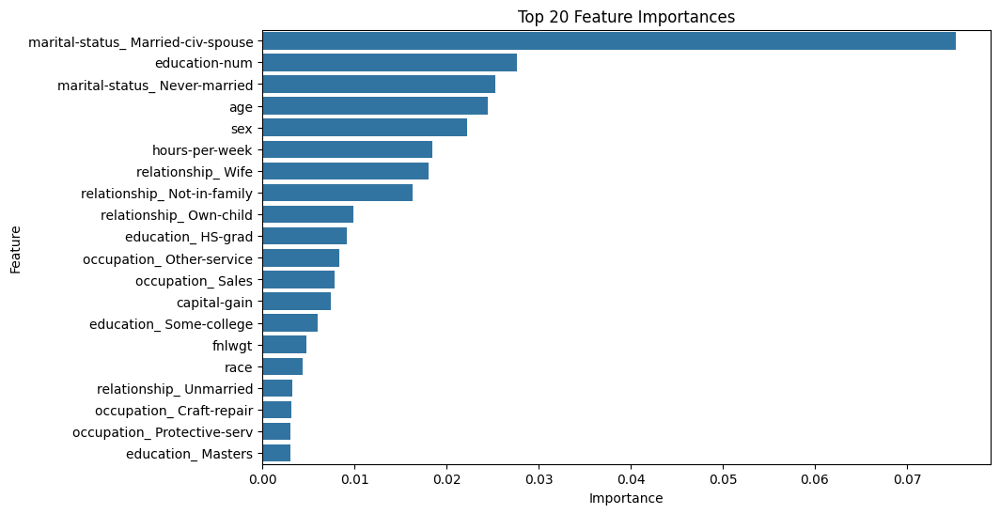

In [ ]:
# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='fairness_importance', y='feature', data=fair_importance.head(20))
plt.title('Top 20 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## FairFIS

In [ ]:
!git clone https://github.com/DebolinaHalder/FairTreeFIS.git
!cd FairTreeFIS
!python3 setup.py install

fatal: destination path 'FairTreeFIS' already exists and is not an empty directory.
python3: can't open file '//setup.py': [Errno 2] No such file or directory


In [ ]:
!git clone https://github.com/DebolinaHalder/FairTreeFIS.git #Clone the repo
%cd FairTreeFIS #Navigate into directory.
!pip install . #Install the package to your environment
%cd ..

fatal: destination path 'FairTreeFIS' already exists and is not an empty directory.
[Errno 2] No such file or directory: 'FairTreeFIS #Navigate into directory.'
/content
ERROR: Directory '.' is not installable. Neither 'setup.py' nor 'pyproject.toml' found.
/


In [ ]:
from fairTreeFIS import FairTreeFIS

ModuleNotFoundError: No module named 'fairTreeFIS'

In [ ]:
sensitive_index = list(X.columns).index('sex') if isinstance(X, pd.DataFrame) else 9

fair_fis = FairTreeFIS(model=clf, X=X_test, y=y_test, sensitive_feature_index=sensitive_index)

fairfis_scores = fair_fis.compute_fair_fis()

In [ ]:
# Convert scores to sorted list
scores_sorted = sorted(fairfis_scores.items(), key=lambda x: abs(x[1]), reverse=True)

for feature_idx, score in scores_sorted:
    print(f"Feature {feature_idx}: FairFIS Score = {score:.4f}")

In [ ]:
def compute_fairfis_scores(model, X_test_array, y_test_array, sensitive_feature_index):
    fair_fis = FairTreeFIS(
        model=model,
        X=X_test_array,
        y=y_test_array,
        sensitive_feature_index=sensitive_feature_index
    )
    return fair_fis.compute_fair_fis()

FairFIS_model = DecisionTreeClassifier(max_depth=5, random_state=42)
FairFIS_model.fit(X_train, y_train)

# Convert to arrays if using DataFrames
X_test_array = X_test.values if isinstance(X_test, pd.DataFrame) else X_test
sensitive_idx = X.columns.get_loc('sex') if 'sex' in X.columns else 0

fairfis_scores = compute_fairfis_scores(FairFIS_model, X_test_array, y_test.values, sensitive_idx)

# Display FairFIS scores sorted
sorted_scores = sorted(fairfis_scores.items(), key=lambda x: abs(x[1]), reverse=True)
for idx, score in sorted_scores:
    feature_name = X.columns[idx] if isinstance(X, pd.DataFrame) else f"Feature {idx}"
    print(f"{feature_name}: FairFIS Score = {score:.4f}")

NameError: name 'FairTreeFIS' is not defined

## Identifying Most Sensitive Features

In [ ]:
protected_candidates = ['sex', 'race']

for attr in protected_candidates:
    # Recover protected attribute from original X
    X_test_tmp = X_test.copy()
    X_test_tmp[attr] = X.loc[X_test.index, attr].values

    # Ensure predictions align with test set index
    y_pred_series = pd.Series(y_pred, index=X_test.index, name='income')

    # Construct true and predicted dataframes
    true_df = pd.concat([X_test_tmp, y_test], axis=1)
    pred_df = pd.concat([X_test_tmp, y_pred_series], axis=1)

    # Create AIF360 datasets
    true_dataset = BinaryLabelDataset(
        favorable_label=1,
        unfavorable_label=0,
        df=true_df,
        label_names=['income'],
        protected_attribute_names=[attr]
    )

    pred_dataset = BinaryLabelDataset(
        favorable_label=1,
        unfavorable_label=0,
        df=pred_df,
        label_names=['income'],
        protected_attribute_names=[attr]
    )

    # Fairness metric
    metric = ClassificationMetric(
        true_dataset, pred_dataset,
        unprivileged_groups=[{attr: 0}],
        privileged_groups=[{attr: 1}]
    )

    print(f"Fairness impact of {attr}:")
    print("  Statistical Parity:", round(metric.statistical_parity_difference(), 3))
    print("  Equal Opportunity:", round(metric.equal_opportunity_difference(), 3))
    print("  Disparate Impact:", round(metric.disparate_impact(), 3))
    print("-----")

Fairness impact of sex:
  Statistical Parity: -0.174
  Equal Opportunity: -0.058
  Disparate Impact: 0.331
-----


KeyError: 'race'